# Analysis of wavefront sensor data from ALS 5.3.1

Date: Created May 2026 · Last edited 2026-06-16

Author: Wei "Francis" He (francisho@lbl.gov, whorwhey@gmail.com)

Based on earlier versions by Dr. Antoine Islegen-Wojdyla (awojdyla@lbl.gov) and myself. 

___

## Overview

This notebook is created from the templates that designed for analyzing data taken at BL 5.3.1 via Bluesky. 

More specifically, this very script is for data taken on 2026-05-29 by Francis and Henry. 


# SETUP 

## Import 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from tiled.client import from_uri
import os, pickle
import time

import warnings
warnings.simplefilter('always', RuntimeWarning)

In [2]:
import monoplus as mp
import wfs_live as wfl

## Access Data from the Server


__Tiled connection__

>Note: We tried read data from db with `tiled.__version__='0.2.9'`, but it failed; \
>had to reinstall a 0.2.1 version to make it work. 

In [3]:
# --- Server connection ---
api_key_path = "/Users/francisho/Documents/TILED_SINGLE_USER_API_KEY.txt"   # Change this path to where your API key is stored 

with open(api_key_path, "r") as f:
    api_key = f.read().strip()

if not api_key:
    raise ValueError("API key file is empty or not found.")

tiled_client = from_uri("http://131.243.80.226:8000", api_key=api_key)

__Dataset registry__

In [4]:
# --- Camera / objective (shared across scans) ---
# Camera / objective metadata is stored in each scan's md
# PIXEL_SIZE_M       = 2.4e-6
# OBJECTIVE_MAG      = 5
# EFF_PIXEL_M        = PIXEL_SIZE_M / OBJECTIVE_MAG    # ~0.48 µm/px

Z_GD_M             = 0.3                              # grating to detector distance (m)

# --- Dataset registry ---
# Keys: chip{N}_{grid|lin}_{tag}.  bender ranges: 'neg' = -2000:-1400 (good),
# 'zero' = -400:0 (near-zero, lower quality).  Linear: 'near' = at-chip,
# 'far' = downstream caustic.
DATASETS = {
    # ── Chip 1 (7.0 µm pitch, bcs_linear_motor ≈ 4.41 mm) ──────────────
    "chip1_grid_neg": dict(
        uid="4adb81df-534d-4fc9-8590-ab1a449e5b54",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -2000, -1400, 13),
        fixed=dict(bcs_linear_motor=4.410),
    ),
    "chip1_grid_zero": dict(
        uid="f87cf0d3-ab99-464b-81fa-73d9d892f374",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -400, 0, 9),
        fixed=dict(bcs_linear_motor=4.410),
    ),
    "chip1_lin_near": dict(
        uid="a9a6beac-9762-4cfb-939f-d5d18beb9541",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 4.410, 4.600, 191),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
    "chip1_lin_far": dict(
        uid="ce368e98-65b2-4059-a954-2a2d05c21dbc",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 5.500, 5.700, 201),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
    # ── Chip 2 (6.2 µm pitch, bcs_linear_motor ≈ 7.90 mm) ──────────────
    "chip2_grid_neg": dict(
        uid="5dbef69f-1e5b-43f3-8950-7118053075a1",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -2000, -1400, 13),
        fixed=dict(bcs_linear_motor=7.900),
    ),
    "chip2_grid_zero": dict(
        uid="301119ed-ad7c-4c58-b8c6-ef5c92a52115",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -400, 0, 9),
        fixed=dict(bcs_linear_motor=7.900),
    ),
    "chip2_lin_near": dict(
        uid="a0883ecc-84b2-4096-9ee3-5f46e061a9b0",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 7.901, 8.100, 200),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
    "chip2_lin_far": dict(
        uid="67396878-25a5-459d-a6b5-cd0fe571a6f0",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 8.900, 9.100, 201),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
}

# --- Per-chip analysis defaults (to be filled in Section B) ---
CHIP_DEFAULTS = {
    1: dict(y_roi=None, tilt_rad=None, V_threshold=0.4, I0_threshold=0.02),
    2: dict(y_roi=None, tilt_rad=None, V_threshold=0.4, I0_threshold=0.02),
}

for k, d in DATASETS.items():
    print(f"{k:20s}  chip={d['chip']}  pitch={d['grating_pitch_m']*1e6:.1f} µm  "
          f"{d['scan_type']:6s}  uid={d['uid'][:]}")

chip1_grid_neg        chip=1  pitch=7.0 µm  grid    uid=4adb81df-534d-4fc9-8590-ab1a449e5b54
chip1_grid_zero       chip=1  pitch=7.0 µm  grid    uid=f87cf0d3-ab99-464b-81fa-73d9d892f374
chip1_lin_near        chip=1  pitch=7.0 µm  linear  uid=a9a6beac-9762-4cfb-939f-d5d18beb9541
chip1_lin_far         chip=1  pitch=7.0 µm  linear  uid=ce368e98-65b2-4059-a954-2a2d05c21dbc
chip2_grid_neg        chip=2  pitch=6.2 µm  grid    uid=5dbef69f-1e5b-43f3-8950-7118053075a1
chip2_grid_zero       chip=2  pitch=6.2 µm  grid    uid=301119ed-ad7c-4c58-b8c6-ef5c92a52115
chip2_lin_near        chip=2  pitch=6.2 µm  linear  uid=a0883ecc-84b2-4096-9ee3-5f46e061a9b0
chip2_lin_far         chip=2  pitch=6.2 µm  linear  uid=67396878-25a5-459d-a6b5-cd0fe571a6f0


## Helper Functions

Two utilities used throughout the rest of the notebook:

- **`load_scan(key)`** — pull a registered scan from Tiled. Returns `(images, meta, info)`, where `meta` is a dict of per-frame 1-D arrays (`mono_energy_eV`, `bender_um`, or `bcs_linear_motor_mm` depending on `scan_type`) and `info` carries the resolved shape and registry metadata.
- **`frame_label(key, idx, meta, info)`** — formatted string for plot titles and log lines, e.g. `"chip1_grid_neg (chip1)  idx=67  E=8000 eV  B=-1900 µm"`.

In [5]:
def load_scan(key, verbose=True):
    """Load a registered scan from Tiled.

    Returns
    -------
    images : (N, H, W) ndarray
    meta   : dict[str, ndarray]   per-frame scanned variable(s)
    info   : dict                 registry entry + resolved shape, dx_m
    """
    if key not in DATASETS:
        raise KeyError(f"{key!r} not in DATASETS. Keys: {list(DATASETS)}")
    info = dict(DATASETS[key])
    db   = tiled_client[info["uid"]]

    images = db["primary"]["basler_5472_image"].read()
    if images.ndim == 4 and images.shape[1] == 1:
        images = images[:, 0]

    # Effective pixel size from start metadata (varies with binning + objective)
    try:
        dx_m = float(db.metadata["start"]["effective pixel size [um]"]) * 1e-6
        info["dx_source"] = "metadata"
    except KeyError:
        # TEMP: linear scans on 2026-05-29 were taken without md=md, so start
        # metadata is missing camera/binning fields. Hardcoded from the scan
        # notebook: basler_5472, bin=1×1, 2.4 µm pixel, Mitutoyo 5× → 0.48 µm/px.
        # Remove once all scans carry full md.
        dx_m = 0.48e-6
        info["dx_source"] = "fallback (hardcoded; see load_scan TEMP block)"
        if verbose:
            print(f"[{key}]  dx_m fallback: {dx_m*1e6:.3f} µm/px (md missing)")
    info["dx_m"] = dx_m

    primary = db["primary"]
    avail   = list(primary)
    meta    = {}

    def _pull(stem_options):
        for k in stem_options:
            if k in avail:
                return np.asarray(primary[k].read())
        return None

    if info["scan_type"] == "grid":
        E = _pull(["mono_energy_energy_eV", "mono_energy"])
        B = _pull(["bender_um", "Obender", "Obender_um"])
        if E is None or B is None:
            raise KeyError(f"grid metadata not found.  primary keys: {avail}")
        meta["mono_energy_eV"] = E
        meta["bender_um"]      = B
        info["shape"]          = (info["outer"][3], info["inner"][3])

    elif info["scan_type"] == "linear":
        lm = _pull(["bcs_linear_motor", "bcs_linear_motor_mm",
                    "bcs_linear_motor_user_setpoint",
                    "bcs_linear_motor_user_readback"])
        if lm is None:
            raise KeyError(f"linear-motor metadata not found.  primary keys: {avail}")
        meta["bcs_linear_motor_mm"] = lm
        info["shape"] = (info["axis"][3],)

    info["n_frames"] = images.shape[0]
    info["image_hw"] = images.shape[1:]

    if verbose:
        print(f"[{key}]  images {images.shape}  dx={dx_m*1e6:.3f} µm  "
              f"meta keys: {list(meta)}  shape={info['shape']}")
    return images, meta, info

In [6]:
def frame_label(key, idx, meta=None, info=None):
    """Human-readable label for plot titles, log lines, etc.

    Convention: fixed values inside (...), per-frame values outside.
    """
    d = DATASETS[key]
    fixed, scanned = [], [f"idx={idx}"]

    # mono_energy
    if meta is not None and "mono_energy_eV" in meta:
        scanned.append(f"E={meta['mono_energy_eV'][idx]:.0f} eV")
    elif "mono_energy" in d["fixed"]:
        fixed.append(f"E={d['fixed']['mono_energy']:.0f} eV")

    # bender
    if meta is not None and "bender_um" in meta:
        scanned.append(f"bender={meta['bender_um'][idx]:+.0f} µm")
    elif "bender_um" in d["fixed"]:
        fixed.append(f"bender={d['fixed']['bender_um']:+.0f} µm")

    # linear motor
    if meta is not None and "bcs_linear_motor_mm" in meta:
        scanned.append(f"l={meta['bcs_linear_motor_mm'][idx]:.3f} mm")
    elif "bcs_linear_motor" in d["fixed"]:
        fixed.append(f"l={d['fixed']['bcs_linear_motor']:.3f} mm")

    head = f"{key} ({', '.join(fixed)})" if fixed else key
    return "  ".join([head, *scanned])

In [7]:
def reco_frame(key, idx, propagate=False, **overrides):
    """Reconstruct a single frame using chip-specific defaults.

    Pulls (y_roi, V_threshold, I0_threshold) from CHIP_DEFAULTS[chip] and
    physical params (dx, grating_pitch, z_gd) from DATASETS.
    Wavelength: per-frame mono_energy_eV (grid) or fixed mono_energy (linear).
    Overrides win over defaults.
    """
    images, meta, info = get_scan(key)
    chip = info["chip"]
    d    = CHIP_DEFAULTS[chip]

    if "mono_energy_eV" in meta:
        E_eV = float(meta["mono_energy_eV"][idx])
    else:
        E_eV = float(info["fixed"]["mono_energy"])
    wavelength = wfl.energy_eV_to_wavelength_m(E_eV)

    kwargs = dict(
        dx                = info["dx_m"],
        grating_pitch     = info["grating_pitch_m"],
        wavelength        = wavelength,
        z_gd              = Z_GD_M,
        y_roi             = d["y_roi"],
        V_threshold       = d["V_threshold"],
        I0_threshold      = d["I0_threshold"],
        propagate         = propagate,
        caustic_amplitude = 'gated',
    )
    kwargs.update(overrides)
    return wfl.reconstruct_single(images[idx], **kwargs)

In [8]:
SCANS = {}

def get_scan(key):
    """Cached load_scan. Repeated calls return the same (images, meta, info)."""
    if key not in SCANS:
        SCANS[key] = load_scan(key)
    return SCANS[key]

# PRE-PROCESSING

Two coding issues need resolving before bulk processing:
1. **fringe tilt.** Fringes are not exactly parallel to the y-axis. 
2. **V-threshold mask.** The trust_mask drops the wrong region on idx=67. 

## Chip 1 Santiy

### Load data and preview

In [20]:
# Load a scan (slow, ~1-2 mins)
images, meta, info = load_scan("chip1_grid_neg")


[chip1_grid_neg]  images (143, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 13)


chip1_grid_neg (l=4.410 mm)  idx=65  E=8000 eV  bender=-2000 µm


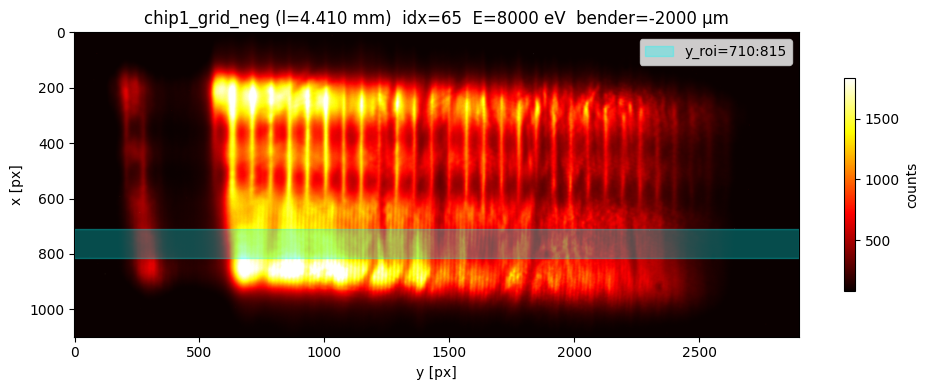

In [21]:
idx = 65
print(frame_label("chip1_grid_neg", idx, meta, info))

plt.figure(figsize=(10, 4))
plt.imshow(images[idx].T, cmap="hot", aspect="auto",
           vmin=np.percentile(images[idx],25), vmax=np.percentile(images[idx], 99.5))
plt.axhspan(710, 815, color="cyan", alpha=0.3, label="y_roi=710:815")
plt.title(frame_label("chip1_grid_neg", idx, meta, info))
plt.xlabel("y [px]"); plt.ylabel("x [px]")
plt.colorbar(label="counts", shrink=0.7)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

### `y_roi` width search 



In [ ]:
# Brightest-stripe location along y (= axis 1 of images[idx])
idx_list = [65, 67, 71, 77]

plt.figure(figsize=(12, 4))
for idx in idx_list:
    profile_y = images[idx].mean(axis=0)
    N_y_total = images[idx].shape[1]
    plt.plot(np.arange(N_y_total), profile_y, lw=0.8,
             label=frame_label('chip1_grid_neg', idx, meta, info))

plt.axvline(762.5, color='C3', ls='--', lw=1)
plt.axvspan(710, 815, color='cyan', alpha=0.2)
plt.xlabel('y [px]'); plt.ylabel('mean intensity over x [counts]')
plt.title("y-stripe profile  —  overlay (chip 1)")
plt.legend(loc='lower left', fontsize=8)
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

In [ ]:
y_candidates = [(675, 700), (700, 725), (725, 750),
                (750, 775), (775, 800), (800, 825)]
idx = 65
x_mm = np.arange(images[idx].shape[0]) * info["dx_m"] * 1e3

plt.figure(figsize=(11, 5))
for (y0, y1) in y_candidates:
    prof = images[idx][:, y0:y1].mean(axis=1)
    plt.plot(x_mm, prof, lw=0.7, label=f"y_roi=({y0},{y1})")
plt.xlabel("x [mm]"); plt.ylabel("Intensity [counts]")
plt.xlim(x_mm[0], x_mm[-1])
plt.title(f"Fringe profiles vs y_roi  —  {frame_label('chip1_grid_neg', idx, meta, info)}")
plt.legend(fontsize=8, loc="upper right")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

In [ ]:
# Half-open slice [a, a+N_y) centered at 762.5 ⇒ a = (1525 - N_y) // 2  (odd N_y)
N_y_list = list(range(15, 156, 10))

records_by_idx = {}
for idx in idx_list:
    records = []
    for N_y in N_y_list:
        a = (1525 - N_y) // 2
        y_roi = slice(a, a + N_y)
        profile = wfl.extract_profile(images[idx], y_roi, axis=1)
        car = wfl.find_carrier(profile, dx=info["dx_m"],
                               grating_pitch=info["grating_pitch_m"])
        records.append(dict(
            N_y         = N_y,
            y_roi       = (y_roi.start, y_roi.stop),
            k_peak      = car["k_peak"],
            k_amp       = car["k_amp"],
            dc_amp      = car["dc_amp"],
            bg_amp      = car["bg_amp"],
            carrier_snr = car["k_amp"] / car["bg_amp"],
            dc_ratio    = car["dc_amp"] / car["k_amp"],
        ))
    records_by_idx[idx] = records

# Plot
fig, axes = plt.subplots(1, 3, figsize=(12, 3.5))
for idx in idx_list:
    records = records_by_idx[idx]
    N_arr = np.array([r['N_y'] for r in records])
    label = frame_label('chip1_grid_neg', idx, meta, info)
    axes[0].plot(N_arr, [r['k_amp']       for r in records], 'o-', label=label)
    axes[1].plot(N_arr, [r['carrier_snr'] for r in records], 'o-', label=label)
    axes[2].plot(N_arr, [r['dc_ratio']    for r in records], 'o-', label=label)

axes[0].set_xlabel('N_y [px]'); axes[0].set_ylabel('|F(k_peak)|')
axes[0].set_title('Carrier amplitude'); axes[0].grid(alpha=0.3)
axes[1].set_xlabel('N_y [px]'); axes[1].set_ylabel('k_amp / bg_amp')
axes[1].set_title('Carrier SNR'); axes[1].grid(alpha=0.3)
axes[2].set_xlabel('N_y [px]'); axes[2].set_ylabel('dc_amp / k_amp')
axes[2].set_title('DC / carrier ratio'); axes[2].grid(alpha=0.3)
axes[0].legend(fontsize=6)
plt.tight_layout(); plt.show()

# Tables
for idx in idx_list:
    records = records_by_idx[idx]
    print(f"N_y sweep — {frame_label('chip1_grid_neg', idx, meta, info)}")
    print(f"{'N_y':>4}  {'y_roi':>12}  {'k_amp':>10}  {'snr':>7}  {'dc/k':>7}  {'k_pk[c/mm]':>10}")
    print("-" * 64)
    for r in records:
        print(f"{r['N_y']:4d}  {str(r['y_roi']):>12}  "
              f"{r['k_amp']:10.2e}  {r['carrier_snr']:7.1f}  "
              f"{r['dc_ratio']:7.2f}  {r['k_peak']*1e-3:10.2f}")
    print()

### Tilt characterization



In [ ]:
from numpy.fft import fft2, fftshift, fftfreq

idx_tilt = 65
y_crop   = slice(500, 1700)

def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

centers     = np.arange(737.5, 787.51, 5)                  # ±25 around y_center=762.5
x_crop_list = [(int(c - 52.5), int(c + 52.5)) for c in centers]

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 1, p=7.0 µm)")
print(f"{'x_crop':>13}  {'center':>7}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 78)

tilt_records_center = []
for (x0, x1), c in zip(x_crop_list, centers):
    crop = images[idx_tilt][y_crop, slice(x0, x1)].astype(float)
    crop -= crop.mean()
    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0 = np.argmin(np.abs(kx_ax))
    ky_cut = aF[:, ix0]
    bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
    ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
    cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_center.append(dict(
        x_crop=(x0, x1), x_center=c,
        ky_pos=ky_pos, ky_neg=ky_neg, cx_pos=cx_pos, cx_neg=cx_neg,
        tilt_deg=np.degrees(tilt_rad)))

    print(f"  ({x0:>4},{x1:>4})  {c:7.1f}  "
          f"{ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

xs   = [r['x_center'] for r in tilt_records_center]
ts   = [r['tilt_deg'] for r in tilt_records_center]
lbls = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records_center]

plt.figure(figsize=(9, 4))
plt.plot(xs, ts, 'o-', color='C2')
for c, t, lab in zip(xs, ts, lbls):
    plt.annotate(lab, (c, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.axvline(762.5, color='C3', ls='--', lw=1, label='y_center=762.5')
plt.xlabel('x_crop center [px]'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI center (width=105) — "
          f"{frame_label('chip1_grid_neg', idx_tilt, meta, info)}")
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
center_locked = 762.5                              # ← update from cell 1
N_y_list_w    = list(range(25, 146, 10))           # 25, 35, ..., 145

x_crop_list_w = [(int(round(center_locked - N/2)), int(round(center_locked + N/2)))
                 for N in N_y_list_w]

print(f"center_locked = {center_locked}")
print(f"{'x_crop':>13}  {'width':>6}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 78)

tilt_records_width = []
for (x0, x1) in x_crop_list_w:
    crop = images[idx_tilt][y_crop, slice(x0, x1)].astype(float)
    crop -= crop.mean()
    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0 = np.argmin(np.abs(kx_ax))
    ky_cut = aF[:, ix0]
    bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
    ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
    cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_width.append(dict(
        x_crop=(x0, x1), width=x1-x0,
        ky_pos=ky_pos, ky_neg=ky_neg, cx_pos=cx_pos, cx_neg=cx_neg,
        tilt_deg=np.degrees(tilt_rad)))

    print(f"  ({x0:>4},{x1:>4})  {x1-x0:6d}  "
          f"{ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

ws   = [r['width']    for r in tilt_records_width]
ts   = [r['tilt_deg'] for r in tilt_records_width]
lbls = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records_width]

plt.figure(figsize=(9, 4))
plt.plot(ws, ts, 'o-', color='steelblue')
for w, t, lab in zip(ws, ts, lbls):
    plt.annotate(lab, (w, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.xlabel('x_crop width [px]'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI width (center={center_locked}) — "
          f"{frame_label('chip1_grid_neg', idx_tilt, meta, info)}")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
x_crop_locked = slice(710, 815)                    # ← update from cells 1+2
idx_sweep     = list(range(65, 78))                # 65..77

print(f"x_crop = ({x_crop_locked.start}, {x_crop_locked.stop})  "
      f"width={x_crop_locked.stop - x_crop_locked.start}\n")
print(f"{'idx':>4}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 60)

tilt_records_idx = []
for idx in idx_sweep:
    crop = images[idx][y_crop, x_crop_locked].astype(float)
    crop -= crop.mean()
    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0 = np.argmin(np.abs(kx_ax))
    ky_cut = aF[:, ix0]
    bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
    ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
    cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_idx.append(dict(
        idx=idx, ky_pos=ky_pos, ky_neg=ky_neg,
        cx_pos=cx_pos, cx_neg=cx_neg, tilt_deg=np.degrees(tilt_rad)))

    print(f"  {idx:4d}  {ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

idxs = [r['idx']      for r in tilt_records_idx]
ts   = [r['tilt_deg'] for r in tilt_records_idx]

plt.figure(figsize=(8, 4))
plt.plot(idxs, ts, 'o-', color='C1')
plt.xlabel('idx'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs idx (x_crop={x_crop_locked.start}:{x_crop_locked.stop}) — chip1_grid_neg")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
crop = images[idx_tilt][y_crop, x_crop_locked].astype(float)
crop -= crop.mean()

F  = fftshift(fft2(crop)); aF = np.abs(F)
nyc, nxc = crop.shape
ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

ix0 = np.argmin(np.abs(kx_ax))
ky_cut = aF[:, ix0]
bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
win = np.abs(kx_ax) < 100e3
cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
tilt_rad_chip1 = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 1, p=7.0 µm)")
print(f"x_crop  = ({x_crop_locked.start}, {x_crop_locked.stop})  "
      f"width={x_crop_locked.stop - x_crop_locked.start}")
print(f"ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
print(f"cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
print(f"\ntilt   = {np.degrees(tilt_rad_chip1):+.3f} deg")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
ext = [kx_ax.min()*1e-3, kx_ax.max()*1e-3, ky_ax.min()*1e-3, ky_ax.max()*1e-3]
axes[0].imshow(np.log10(aF + 1), origin="lower", aspect="equal",
               extent=ext, cmap="viridis", vmin=3, vmax=7)
axes[0].set_xlim(-250, 250); axes[0].set_ylim(-250, 250)
axes[0].set_xlabel("k_x [cyc/mm]"); axes[0].set_ylabel("k_y [cyc/mm]")
axes[0].set_title("2D FFT (chip 1)")

axes[1].semilogy(ky_ax*1e-3, ky_cut)
for k, c, lab in [( k_ideal, "r", "+k_ideal"),
                  (-k_ideal, "r", "-k_ideal"),
                  ( ky_pos, "g", f"ky_pos={ky_pos*1e-3:.1f}"),
                  ( ky_neg, "b", f"ky_neg={ky_neg*1e-3:.1f}")]:
    axes[1].axvline(k*1e-3, color=c, ls="--" if "ky" in lab else ":", label=lab)
axes[1].set_xlim(-1.5*k_ideal*1e-3, 1.5*k_ideal*1e-3)
axes[1].set_ylim(1e4, 1e8)
axes[1].set_xlabel("k_y [cyc/mm]"); axes[1].set_ylabel("|F|")
axes[1].set_title("kx=0 cut"); axes[1].legend(fontsize=8)

axes[2].semilogy(kx_ax*1e-3, aF[iy_pos], color="g", label=f"ky={ky_pos*1e-3:+.1f}")
axes[2].semilogy(kx_ax*1e-3, aF[iy_neg], color="b", label=f"ky={ky_neg*1e-3:+.1f}")
axes[2].axvline(cx_pos*1e-3, color="g", ls="--", alpha=0.6)
axes[2].axvline(cx_neg*1e-3, color="b", ls="--", alpha=0.6)
axes[2].set_xlim(-200, 200); axes[2].set_ylim(bottom=1e4)
axes[2].set_xlabel("k_x [cyc/mm]"); axes[2].set_ylabel("|F|")
axes[2].set_title("Carrier-row cuts"); axes[2].legend(fontsize=8)
plt.tight_layout(); plt.show()

### Lock `y_roi_chip1` 


In [23]:
y_roi_chip1 = slice(710, 815)     # N_y=105, center 762.5
print(f"chip-1 y_roi locked: slice({y_roi_chip1.start}, {y_roi_chip1.stop})  "
      f"width={y_roi_chip1.stop - y_roi_chip1.start}  "
      f"center={(y_roi_chip1.start + y_roi_chip1.stop)/2}")

chip-1 y_roi locked: slice(710, 815)  width=105  center=762.5


### Trust_mask β-fix (archived)

In [ ]:
# Baseline reconstruction at current defaults — no propagation, just to get masks

KEY = "chip1_grid_neg"

res65 = wfl.reconstruct_single(
    images[65],
    dx=info["dx_m"],
    grating_pitch=info["grating_pitch_m"],
    wavelength=wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][65]),
    z_gd=Z_GD_M,
    y_roi=slice(750, 775),
    V_threshold=0.4,
    I0_threshold=0.02,
    propagate=False,
    verbose=True,
)
_ = wfl.plot_result(res65, title=frame_label(KEY, 65, meta, info))

res67 = wfl.reconstruct_single(
    images[67],
    dx=info["dx_m"],
    grating_pitch=info["grating_pitch_m"],
    wavelength=wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][67]),
    z_gd=Z_GD_M,
    y_roi=slice(750, 775),
    V_threshold=0.4,
    I0_threshold=0.02,
    propagate=False,
    verbose=True,
)

_ = wfl.plot_result(res67, title=frame_label(KEY, 67, meta, info))

Diagnostic

In [ ]:
# Helper to split trust_mask into raw (V>V_thr) vs filled, and identify bridged pixels
def split_trust(res):
    raw     = res["V"] > res["V_threshold"]
    filled  = wfl.fill_mask_gaps(raw)
    bridged = filled & ~raw
    return raw, filled, bridged

# Plot trust_mask components for both frames, to understand 
# how filling bridges gaps in the raw mask
fig, axes = plt.subplots(2, 1, figsize=(12, 7.5), sharex=True)
for ax, res, idx in zip(axes, [res65, res67], [65, 67]):
    raw, filled, bridged = split_trust(res)
    xc_mm = res["x_mm"][res["x_c"]]
    x = res["x_mm"] - xc_mm                          # center on x_c
    Vthr = res["V_threshold"]

    ax.plot(x, res["I0"] / res["I0"].max(), color="steelblue", lw=1.0, label="$I_0$ (norm)")
    ax.plot(x, res["A1"] / res["A1"].max(), color="crimson",   lw=1.0, label="$A_{+1}$ (norm)")
    ax.plot(x, res["V"],                    color="black",     lw=0.9, label="V (norm)")
    ax.axhline(Vthr, color="gray", ls=":", lw=1, label=f"V_thr={Vthr}")

    ax.fill_between(x, -0.06, -0.14, where=raw,     color="C2",  alpha=0.6, label="raw $V>V_{thr}$")
    ax.fill_between(x, -0.18, -0.26, where=filled,  color="C1",  alpha=0.6, label="filled trust_mask")
    ax.fill_between(x, -0.30, -0.34, where=res["beam_mask"], color="gold", alpha=0.6, label="beam_mask")
    ax.fill_between(x, -0.06, -0.26, where=bridged, color="red", alpha=0.25,
                    label=f"bridged by fill ({bridged.sum()} px)")

    ax.set_ylim(-0.40, 1.10)
    ax.set_ylabel(f"idx={idx}")
    ax.grid(alpha=0.3)
    if idx == 65:
        ax.legend(loc="upper right", ncol=4, fontsize=8, framealpha=0.9)
axes[-1].set_xlabel("x − x_c [mm]")
fig.suptitle("trust_mask: raw V>V_thr vs filled (chip1_grid_neg, V_thr=0.4)", y=0.995)
plt.tight_layout()

In [ ]:
for label, res in [("idx=65", res65), ("idx=67", res67)]:
    raw, filled, bridged = split_trust(res)
    xc_mm = res["x_mm"][res["x_c"]]

    if raw.any():
        i_l = np.argmax(raw)
        i_r = len(raw) - 1 - np.argmax(raw[::-1])
        l_mm = res["x_mm"][i_l] - xc_mm
        r_mm = res["x_mm"][i_r] - xc_mm
    else:
        l_mm = r_mm = float("nan")

    # Count disconnected raw clusters (proxy for "anchor spikes")
    flips = np.diff(raw.astype(int))
    n_clusters = int((flips == 1).sum() + raw[0])

    print(f"{label}:  raw {raw.sum():4d} px   filled {filled.sum():4d} px   "
          f"bridged {bridged.sum():4d} px   raw-clusters {n_clusters}")
    print(f"         raw extent: x − x_c ∈ [{l_mm:+.3f}, {r_mm:+.3f}] mm")

Fix

In [ ]:
V_THR  = 0.5
I0_THR = 0.02

def reco(idx, **kw):
    return wfl.reconstruct_single(
        images[idx],
        dx=info["dx_m"],
        grating_pitch=info["grating_pitch_m"],
        wavelength=wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][idx]),
        z_gd=Z_GD_M, y_roi=slice(750, 775),
        V_threshold=V_THR, I0_threshold=I0_THR,
        propagate=False,
        **kw,
    )

def manual_trust_fix(res):
    """trust = fill_gaps((V > V_thr) ∩ beam_mask); then re-fit parabola."""
    V, beam = res["V"], res["beam_mask"]
    trust_fixed = wfl.fill_mask_gaps((V > res["V_threshold"]) & beam)
    fit_fixed   = beam & trust_fixed
    refit = wfl.parabolic_focal_fit(
        res["W_rad"], res["x_m"], res["wavelength"], mask=fit_fixed,
    )
    return dict(
        trust_fixed=trust_fixed,
        fit_fixed=fit_fixed,
        n_fit_fixed=int(fit_fixed.sum()),
        f_pred_fixed=refit["f_pred"],
        rms_resid_fixed=refit["rms_resid_nm"],
    )

In [ ]:
res65 = reco(65);  fix65 = manual_trust_fix(res65)
res67 = reco(67);  fix67 = manual_trust_fix(res67)

fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
for ax, res, fix, idx in zip(axes, [res65, res67], [fix65, fix67], [65, 67]):
    xc_mm = res["x_mm"][res["x_c"]]
    x = res["x_mm"] - xc_mm
    ax.plot(x, res["I0"]/res["I0"].max(), color="steelblue", lw=1, label="$I_0$")
    ax.plot(x, res["A1"]/res["A1"].max(), color="crimson",   lw=1, label="$A_{+1}$")
    ax.plot(x, res["V"],                  color="black",     lw=0.9, label="V")
    ax.axhline(V_THR, color="gray", ls=":", lw=1)

    ax.fill_between(x, -0.06, -0.14, where=res["fit_mask"],  color="C0", alpha=0.5, label="fit (current)")
    ax.fill_between(x, -0.18, -0.26, where=fix["fit_fixed"], color="C2", alpha=0.6, label="fit (fixed)")
    ax.fill_between(x, -0.30, -0.34, where=res["beam_mask"], color="gold", alpha=0.6, label="beam_mask")

    ax.set_ylim(-0.40, 1.10); ax.grid(alpha=0.3)
    ax.set_ylabel(
        f"idx={idx}\n"
        f"cur: n_fit={res['n_fit_px']:4d}  rms={res['rms_resid_nm']:.3f} nm  f={res['f_pred']:+.3f} m\n"
        f"fix: n_fit={fix['n_fit_fixed']:4d}  rms={fix['rms_resid_fixed']:.3f} nm  f={fix['f_pred_fixed']:+.3f} m"
    )
    if idx == 65:
        ax.legend(loc="upper right", ncol=3, fontsize=8)
axes[-1].set_xlabel("x − x_c [mm]")
fig.suptitle(f"trust_mask fix (V_thr={V_THR}):  (V>V_thr) ∩ beam_mask, then fill_gaps")
plt.tight_layout()

In [ ]:
# 7 frames across 7 bender positions at the same energy
sweep_idx = np.arange(65, 79, 2)

print(f"{'idx':>4}  {'E':>6}  {'B':>6}  "
      f"{'n_cur':>5}  {'n_fix':>5}  "
      f"{'rms_cur':>8}  {'rms_fix':>8}  "
      f"{'f_cur':>8}  {'f_fix':>8}")
print("-" * 78)
for i in sweep_idx:
    r  = reco(i)
    fx = manual_trust_fix(r)
    print(f"{i:4d}  {meta['mono_energy_eV'][i]:6.0f}  {meta['bender_um'][i]:+6.0f}  "
          f"{r['n_fit_px']:5d}  {fx['n_fit_fixed']:5d}  "
          f"{r['rms_resid_nm']:8.3f}  {fx['rms_resid_fixed']:8.3f}  "
          f"{r['f_pred']:+8.3f}  {fx['f_pred_fixed']:+8.3f}")

In [ ]:
# 7 frames across 7 energies at the same bender position
sweep_idx = np.arange(65, 79, 2)

print(f"{'idx':>4}  {'E':>6}  {'B':>6}  "
      f"{'n_cur':>5}  {'n_fix':>5}  "
      f"{'rms_cur':>8}  {'rms_fix':>8}  "
      f"{'f_cur':>8}  {'f_fix':>8}")
print("-" * 78)
for i in sweep_idx:
    r  = reco(i)
    fx = manual_trust_fix(r)
    print(f"{i:4d}  {meta['mono_energy_eV'][i]:6.0f}  {meta['bender_um'][i]:+6.0f}  "
          f"{r['n_fit_px']:5d}  {fx['n_fit_fixed']:5d}  "
          f"{r['rms_resid_nm']:8.3f}  {fx['rms_resid_fixed']:8.3f}  "
          f"{r['f_pred']:+8.3f}  {fx['f_pred_fixed']:+8.3f}")

**Issue.** `fill_mask_gaps` fills *all* False values between the first and last True, not just small interior gaps. Applied to raw `V > V_thr`, an isolated peripheral spike (where I₀ is low but A₊₁/I₀ clears the threshold) anchors the fill and bridges hundreds of low-V pixels into `trust_mask`, contaminating the fit.

**Fix.** Intersect with `beam_mask` *before* `fill_mask_gaps`:
`trust_mask = fill_mask_gaps((V > V_thr) ∩ beam_mask)`.

Verified across 14 frames in `chip1_grid_neg`: most unchanged (no out-of-beam anchor present); idx=52 improved rms_resid 0.541 → 0.026 nm with `f_pred` consensus-corrected.

### Library regression

In [ ]:
sweep_idx = [0, 12, 52, 65, 67, 72, 77, 91, 104, 117, 130, 142]
print(f"{'idx':>4}  {'E':>6}  {'B':>6}  "
      f"{'n_lib':>5}  {'n_man':>5}  {'rms_lib':>8}  {'rms_man':>8}  "
      f"{'f_lib':>8}  {'f_man':>8}  {'match':>5}")
print("-" * 88)
all_ok = True
for i in sweep_idx:
    r  = reco(i)
    fx = manual_trust_fix(r)
    ok = (r["n_fit_px"] == fx["n_fit_fixed"]
          and np.isclose(r["rms_resid_nm"], fx["rms_resid_fixed"], atol=1e-6)
          and np.isclose(r["f_pred"],       fx["f_pred_fixed"],   atol=1e-6))
    all_ok &= ok
    print(f"{i:4d}  {meta['mono_energy_eV'][i]:6.0f}  {meta['bender_um'][i]:+6.0f}  "
          f"{r['n_fit_px']:5d}  {fx['n_fit_fixed']:5d}  "
          f"{r['rms_resid_nm']:8.3f}  {fx['rms_resid_fixed']:8.3f}  "
          f"{r['f_pred']:+8.3f}  {fx['f_pred_fixed']:+8.3f}  "
          f"{'OK' if ok else 'DIFF':>5}")
print()
print("All match." if all_ok else "Mismatch — investigate.")

In [ ]:
_ = wfl.plot_result(reco(65), title=frame_label(KEY, 65, meta, info))
_ = wfl.plot_result(reco(67), title=frame_label(KEY, 67, meta, info))

### Reconstruction + propagation

[  ok]  λ=0.15nm  k_peak=135.1 cyc/mm  r_DC=168.7  SNR=59.0  f_pred=-5.22m  RMS_W=9.6nm  RMS_resid=0.153nm  z_focus=-5.88m(fwhm_min)  RMS@focus=0.114nm


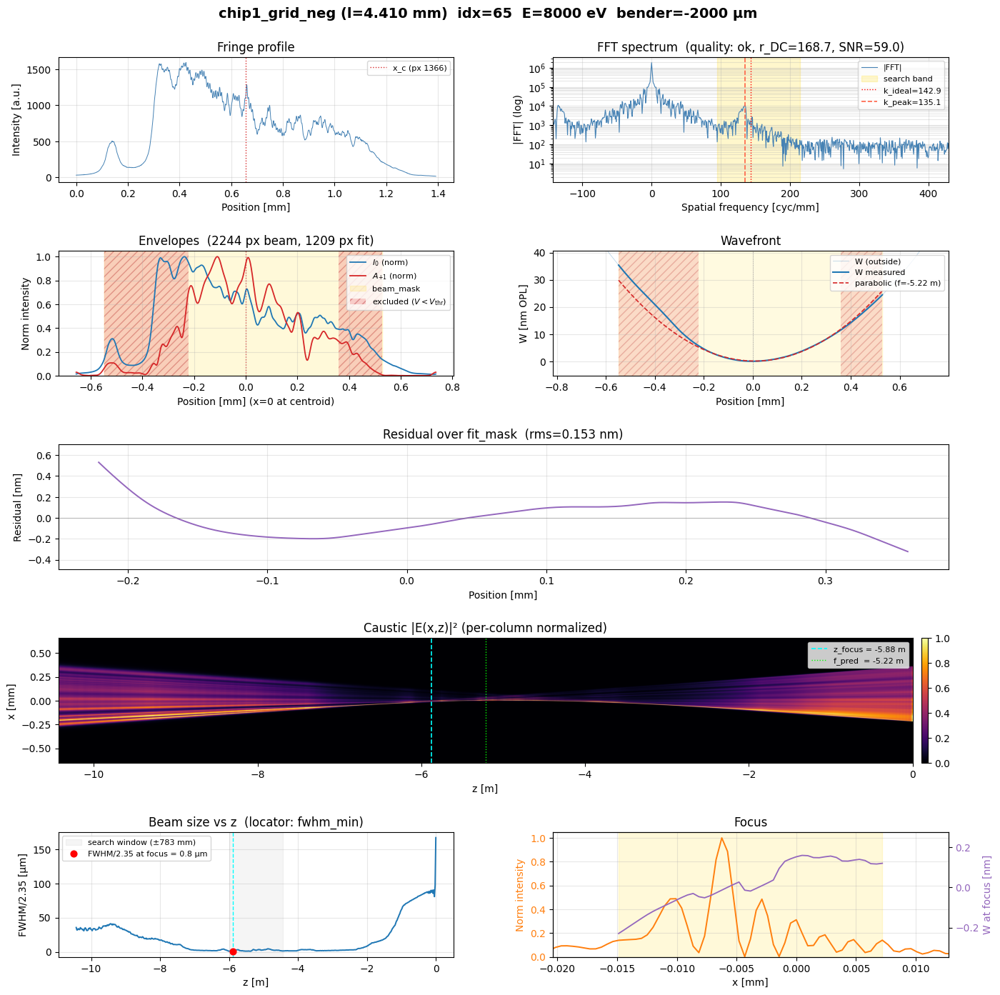

In [25]:
Z_GD_M = 0.3

idx = 65
wavelength = wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][idx])

res = wfl.reconstruct_single(
    images[idx],
    dx            = info["dx_m"],
    grating_pitch = info["grating_pitch_m"],
    wavelength    = wavelength,
    z_gd          = Z_GD_M,
    y_roi         = y_roi_chip1,
    V_threshold   = 0.5,
    I0_threshold  = 0.02,
    propagate     = True,
    caustic_amplitude = 'gated',
    verbose       = True,
)

# print(f"\nquality           = {res['quality']}")
# print(f"f_pred            = {res['f_pred']*1e3:.3f} mm")
# if 'z_focus' in res:
#     print(f"z_focus           = {res['z_focus']*1e3:.3f} mm "
#           f"({res.get('z_focus_locator', '?')})")
# print(f"rms_W_nm          = {res['rms_W_nm']:.3f} nm")
# print(f"rms_resid_nm      = {res['rms_resid_nm']:.3f} nm")
# if 'rms_at_focus_nm' in res:
#     print(f"rms_at_focus_nm   = {res['rms_at_focus_nm']:.3f} nm")
# print(f"n_fit_px          = {res['n_fit_px']}")
# print(f"dc_carrier_ratio  = {res['dc_carrier_ratio']:.1f}")
# print(f"carrier_snr       = {res['carrier_snr']:.1f}")

_ = wfl.plot_result(res, title=frame_label("chip1_grid_neg", idx, meta, info))
if 'debug' in res:
    _ = wfl.plot_caustic_amplitude(res['debug'],
        title=f"Caustic — {frame_label('chip1_grid_neg', idx, meta, info)}")

## Chip 2 Sanity

### Load data and preview

In [ ]:
images, meta, info = get_scan("chip2_grid_neg")

In [ ]:
idx = 65
print(frame_label("chip2_grid_neg", idx, meta, info))

plt.figure(figsize=(10, 4))
plt.imshow(images[idx].T, cmap="hot", aspect="auto",
           vmin=np.percentile(images[idx],50), vmax=np.percentile(images[idx], 99.5))
plt.axhspan(680, 785, color="cyan", alpha=0.3, label="y_roi=680:785")
plt.title(frame_label("chip2_grid_neg", idx, meta, info))
plt.xlabel("y [px]"); plt.ylabel("x [px]")
plt.colorbar(label="counts", shrink=0.7)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

### `y_roi` width search (carrier_snr ruler)

Sweep ROI width with center fixed at 737.5; rank by carrier amplitude, SNR, and DC/carrier ratio. Wider helps SNR via √N_y averaging but loses visibility via tilt-sinc — there's a finite optimum.


In [ ]:
# y-stripe overlay across 4 benders

# Brightest-stripe location along y (= axis 1 of images[idx])
idx_list = [65, 67, 71, 77]

plt.figure(figsize=(12, 4))

for idx in idx_list:
    profile_y = images[idx].mean(axis=0)
    N_y_total = images[idx].shape[1]
    plt.plot(np.arange(N_y_total), profile_y, lw=0.8,
             label=frame_label('chip2_grid_neg', idx, meta, info))

plt.axvline(732.5, color='C3', ls='--', lw=1)#, label='y_center=737.5')
plt.axvspan(680, 785, color='cyan', alpha=0.2)#, label='N_y=25 (725:750)')
plt.xlabel('y [px]'); plt.ylabel('mean intensity over x [counts]')
plt.title("y-stripe profile  —  overlay")
plt.legend(loc='lower left', fontsize=8)
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

In [ ]:
# N_y sweep plots for 4 benders

# Half-open slice [a, a+N_y) centered at 737.5 ⇒ a = (1475 - N_y) // 2  (odd N_y)
N_y_list = list(range(15, 156, 10))
idx_list = [65, 67, 71, 77]

records_by_idx = {}
for idx in idx_list:
    records = []
    for N_y in N_y_list:
        a = (1475 - N_y) // 2
        y_roi = slice(a, a + N_y)
        profile = wfl.extract_profile(images[idx], y_roi, axis=1)
        car = wfl.find_carrier(profile, dx=info["dx_m"],
                               grating_pitch=info["grating_pitch_m"])
        records.append(dict(
            N_y         = N_y,
            y_roi       = (y_roi.start, y_roi.stop),
            k_peak      = car["k_peak"],
            k_amp       = car["k_amp"],
            dc_amp      = car["dc_amp"],
            bg_amp      = car["bg_amp"],
            carrier_snr = car["k_amp"] / car["bg_amp"],
            dc_ratio    = car["dc_amp"] / car["k_amp"],
        ))
    records_by_idx[idx] = records

fig, axes = plt.subplots(1, 3, figsize=(12, 3.5))

for idx in idx_list:
    records = records_by_idx[idx]
    N_arr = np.array([r['N_y'] for r in records])
    label = frame_label('chip2_grid_neg', idx, meta, info)

    axes[0].plot(N_arr, [r['k_amp']       for r in records], 'o-', label=label)
    axes[1].plot(N_arr, [r['carrier_snr'] for r in records], 'o-', label=label)
    axes[2].plot(N_arr, [r['dc_ratio']    for r in records], 'o-', label=label)

axes[0].set_xlabel('N_y [px]'); axes[0].set_ylabel('|F(k_peak)|')
axes[0].set_title('Carrier amplitude'); axes[0].grid(alpha=0.3)

axes[1].set_xlabel('N_y [px]'); axes[1].set_ylabel('k_amp / bg_amp')
axes[1].set_title('Carrier SNR'); axes[1].grid(alpha=0.3)

axes[2].set_xlabel('N_y [px]'); axes[2].set_ylabel('dc_amp / k_amp')
axes[2].set_title('DC / carrier ratio'); axes[2].grid(alpha=0.3)

axes[0].legend(fontsize=6)
# fig.suptitle("N_y sweep — overlay", y=1.02)
plt.tight_layout(); plt.show()

for idx in idx_list:
    records = records_by_idx[idx]

    print(f"N_y sweep — {frame_label('chip2_grid_neg', idx, meta, info)}")
    print(f"{'N_y':>4}  {'y_roi':>12}  {'k_amp':>10}  {'snr':>7}  {'dc/k':>7}  {'k_pk[c/mm]':>10}")
    print("-" * 64)
    for r in records:
        print(f"{r['N_y']:4d}  {str(r['y_roi']):>12}  "
              f"{r['k_amp']:10.2e}  {r['carrier_snr']:7.1f}  "
              f"{r['dc_ratio']:7.2f}  {r['k_peak']*1e-3:10.2f}")
    print()  # blank line between tables

In [ ]:
# fringe profiles at fixed-stripe ROI candidates

idx = 65
y_candidates = [(650, 675), (675, 700), (700, 725), (725, 750), (750, 775), (775, 800), (800, 825)]#, (825, 850)]
x_mm = np.arange(images[idx].shape[0]) * info["dx_m"] * 1e3

plt.figure(figsize=(11, 5))
for (y0, y1) in y_candidates:
    prof = images[idx][:, y0:y1].mean(axis=1)
    plt.plot(x_mm, prof, lw=0.7, label=f"y_roi=({y0},{y1})")
plt.xlabel("x [mm]")
plt.ylabel("Intensity [counts]")
plt.xlim(x_mm[0], x_mm[-1])
plt.title(f"Fringe profiles vs y_roi  —  {frame_label('chip2_grid_neg', idx, meta, info)}")
plt.legend(fontsize=8, loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### Tilt characterization

Optimize x_crop choice on idx=65: scan ROI width, then center at fixed width=105, then cross-frame stability. Lock the local-tilt-minimum window.


In [ ]:
# 2D FFTs of those fringe profiles, to see how the carrier and sidebands evolve with y_roi
from numpy.fft import fft2, fftshift, fftfreq


In [ ]:
# tilt vs x_crop width sweep

idx_tilt = 65
y_crop = slice(500, 1700)   # fringe direction (axis 0)

# x_crop_list = [(725, 750), (720, 755), (715, 760), (710, 765), (705, 770), (700, 775),
#                (695, 780), (690, 785), (685, 790), (680, 795), (675, 800), (670, 805), (665, 810)]
x_crop_list = [(720, 745), (715, 750), (710, 755), (705, 760), (700, 765), (695, 770), 
               (690, 775), (685, 780), (680, 785), (675, 790), (670, 795), (665, 800), (660, 805)]

def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)\n")

tilt_records = []
for x0, x1 in x_crop_list:
    x_crop = slice(x0, x1)

    crop = images[idx_tilt][y_crop, x_crop].astype(float)
    crop -= crop.mean()

    F  = fftshift(fft2(crop))
    aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    # Locate ±carrier peaks at kx=0
    ix0     = np.argmin(np.abs(kx_ax))
    ky_cut  = aF[:, ix0]
    band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
    ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

    # kx centroid in ±100 cyc/mm at each carrier row
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], cut_pos[win])
    cx_neg = centroid(kx_ax[win], cut_neg[win])

    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records.append(dict(
        x_crop   = (x0, x1),
        width    = x1 - x0,
        ky_pos   = ky_pos,
        ky_neg   = ky_neg,
        cx_pos   = cx_pos,
        cx_neg   = cx_neg,
        tilt_deg = np.degrees(tilt_rad),
    ))

    print(f"x_crop = ({x0}, {x1})  width={x1-x0:3d} px")
    print(f"  ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
    print(f"  cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
    print(f"  tilt    = {np.degrees(tilt_rad):+.3f} deg\n")

# --- Plot tilt vs ROI choice ---
widths    = [r['width']    for r in tilt_records]
tilts     = [r['tilt_deg'] for r in tilt_records]
labels    = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records]

plt.figure(figsize=(8, 4))
plt.plot(widths, tilts, 'o-', color='steelblue')
for w, t, lab in zip(widths, tilts, labels):
    plt.annotate(lab, (w, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.xlabel('x_crop width [px]')
plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI width — {frame_label('chip2_grid_neg', idx_tilt, meta, info)}")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
# Tilt vs x_crop center at fixed width=105. Union of cells 9+10's shifts.
centers       = np.arange(707.5, 757.51, 5)                    # 11 centers
x_crop_list2  = [(int(c - 52.5), int(c + 52.5)) for c in centers]

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)")
print(f"{'x_crop':>13}  {'center':>7}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 78)

tilt_records_shift = []
for (x0, x1), c in zip(x_crop_list2, centers):
    x_crop = slice(x0, x1)

    crop = images[idx_tilt][y_crop, x_crop].astype(float)
    crop -= crop.mean()

    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0     = np.argmin(np.abs(kx_ax))
    ky_cut  = aF[:, ix0]
    band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
    ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], cut_pos[win])
    cx_neg = centroid(kx_ax[win], cut_neg[win])

    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    rec = dict(x_crop=(x0, x1), x_center=c,
               ky_pos=ky_pos, ky_neg=ky_neg,
               cx_pos=cx_pos, cx_neg=cx_neg,
               tilt_deg=np.degrees(tilt_rad))
    tilt_records_shift.append(rec)

    print(f"  ({x0:>4},{x1:>4})  {c:7.1f}  "
          f"{ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

# Plot
xs = [r['x_center'] for r in tilt_records_shift]
ts = [r['tilt_deg'] for r in tilt_records_shift]
lbls = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records_shift]

plt.figure(figsize=(9, 4))
plt.plot(xs, ts, 'o-', color='C2')
for c, t, lab in zip(xs, ts, lbls):
    plt.annotate(lab, (c, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.axvline(737.5, color='C3', ls='--', lw=1, label='y_center=737.5')
plt.xlabel('x_crop center [px]'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI center (width=105) — "
          f"{frame_label('chip2_grid_neg', idx_tilt, meta, info)}")
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
# tilt vs idx

y_crop = slice(500, 1700)
x_crop = slice(680, 785)
idx_list = list(range(65, 78))   # 65 to 77 inclusive

def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)")
print(f"x_crop  = ({x_crop.start}, {x_crop.stop})\n")

tilt_records_idx = []
for idx in idx_list:
    crop = images[idx][y_crop, x_crop].astype(float)
    crop -= crop.mean()

    F  = fftshift(fft2(crop))
    aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0     = np.argmin(np.abs(kx_ax))
    ky_cut  = aF[:, ix0]
    band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
    ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], cut_pos[win])
    cx_neg = centroid(kx_ax[win], cut_neg[win])

    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_idx.append(dict(
        idx      = idx,
        ky_pos   = ky_pos,
        ky_neg   = ky_neg,
        cx_pos   = cx_pos,
        cx_neg   = cx_neg,
        tilt_deg = np.degrees(tilt_rad),
    ))

    print(f"idx = {idx}")
    print(f"  ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
    print(f"  cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
    print(f"  tilt    = {np.degrees(tilt_rad):+.3f} deg\n")

# --- Plot tilt vs idx ---
idxs  = [r['idx']      for r in tilt_records_idx]
tilts = [r['tilt_deg'] for r in tilt_records_idx]

plt.figure(figsize=(8, 4))
plt.plot(idxs, tilts, 'o-', color='C1')
plt.xlabel('idx')
plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs idx (x_crop={x_crop.start}:{x_crop.stop}) — chip2_grid_neg")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
# single-config 2D FFT

idx_tilt = 65
y_crop = slice(500, 1700)   # fringe direction (axis 0)
x_crop = slice(680, 785)     # stripe direction (axis 1)

crop = images[idx_tilt][y_crop, x_crop].astype(float)
crop -= crop.mean()

F  = fftshift(fft2(crop))
aF = np.abs(F)
nyc, nxc = crop.shape
ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

# Locate ±carrier peaks at kx=0
k_ideal = 1.0 / info["grating_pitch_m"]
ix0     = np.argmin(np.abs(kx_ax))
ky_cut  = aF[:, ix0]
band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

# kx centroid in ±100 cyc/mm at each carrier row
def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
win = np.abs(kx_ax) < 100e3
cx_pos = centroid(kx_ax[win], cut_pos[win])
cx_neg = centroid(kx_ax[win], cut_neg[win])

tilt_rad_chip2 = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)")
print(f"ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
print(f"cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
print(f"\ntilt   = {np.degrees(tilt_rad_chip2):+.3f} deg")

# 2D FFT + cuts
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
ext = [kx_ax.min()*1e-3, kx_ax.max()*1e-3,
       ky_ax.min()*1e-3, ky_ax.max()*1e-3]
axes[0].imshow(np.log10(aF + 1), origin="lower", aspect="equal",
               extent=ext, cmap="viridis", vmin=3, vmax=7)
axes[0].set_xlim(-250, 250); axes[0].set_ylim(-250, 250)
axes[0].set_xlabel("k_x [cyc/mm]"); axes[0].set_ylabel("k_y [cyc/mm]")
axes[0].set_title("2D FFT (chip 2)")

axes[1].semilogy(ky_ax*1e-3, ky_cut)
for k, c, lab in [( k_ideal, "r", "+k_ideal"),
                  (-k_ideal, "r", "-k_ideal"),
                  ( ky_pos, "g", f"ky_pos={ky_pos*1e-3:.1f}"),
                  ( ky_neg, "b", f"ky_neg={ky_neg*1e-3:.1f}")]:
    axes[1].axvline(k*1e-3, color=c, ls="--" if "ky" in lab else ":", label=lab)
axes[1].set_xlim(-1.5*k_ideal*1e-3, 1.5*k_ideal*1e-3)
axes[1].set_ylim(1e4, 1e8)
axes[1].set_xlabel("k_y [cyc/mm]"); axes[1].set_ylabel("|F|")
axes[1].set_title("kx=0 cut"); axes[1].legend(fontsize=8)

axes[2].semilogy(kx_ax*1e-3, cut_pos, color="g", label=f"ky={ky_pos*1e-3:+.1f}")
axes[2].semilogy(kx_ax*1e-3, cut_neg, color="b", label=f"ky={ky_neg*1e-3:+.1f}")
axes[2].axvline(cx_pos*1e-3, color="g", ls="--", alpha=0.6)
axes[2].axvline(cx_neg*1e-3, color="b", ls="--", alpha=0.6)
axes[2].set_xlim(-200, 200)
axes[2].set_ylim(bottom=1e4)
axes[2].set_xlabel("k_x [cyc/mm]"); axes[2].set_ylabel("|F|")
axes[2].set_title("Carrier-row cuts"); axes[2].legend(fontsize=8)
plt.tight_layout(); plt.show()

### Lock `y_roi_chip2`

In [ ]:
y_roi_chip2 = slice(680, 785)     # N_y=105, center 732.5; tilt-minimized
print(f"chip-2 y_roi locked: slice({y_roi_chip2.start}, {y_roi_chip2.stop})  "
      f"width={y_roi_chip2.stop - y_roi_chip2.start}  center={(y_roi_chip2.start + y_roi_chip2.stop)/2}")

### Reconstruction + propagation

In [ ]:
# images, meta, info = get_scan("chip2_grid_neg")

idx = 67
wavelength = wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][idx])

res = wfl.reconstruct_single(
    images[idx],
    dx            = info["dx_m"],
    grating_pitch = info["grating_pitch_m"],
    wavelength    = wavelength,
    z_gd          = Z_GD_M,
    y_roi         = y_roi_chip2,
    V_threshold   = 0.4,
    I0_threshold  = 0.02,
    propagate     = True,
    caustic_amplitude = 'gated',
    verbose       = True,
)

print(f"\nquality           = {res['quality']}")
print(f"f_pred            = {res['f_pred']*1e3:.3f} mm")
if 'z_focus' in res:
    print(f"z_focus           = {res['z_focus']*1e3:.3f} mm "
          f"({res.get('z_focus_locator', '?')})")
print(f"rms_W_nm          = {res['rms_W_nm']:.3f} nm")
print(f"rms_resid_nm      = {res['rms_resid_nm']:.3f} nm")
if 'rms_at_focus_nm' in res:
    print(f"rms_at_focus_nm   = {res['rms_at_focus_nm']:.3f} nm")
print(f"n_fit_px          = {res['n_fit_px']}")
print(f"dc_carrier_ratio  = {res['dc_carrier_ratio']:.1f}")
print(f"carrier_snr       = {res['carrier_snr']:.1f}")

_ = wfl.plot_result(res, title=frame_label("chip2_grid_neg", idx, meta, info))
if 'debug' in res:
    _ = wfl.plot_caustic_amplitude(res['debug'],
        title=f"Caustic — {frame_label('chip2_grid_neg', idx, meta, info)}")

## Lock `CHIP_DEFAULTS`


In [28]:
CHIP_DEFAULTS = {
    1: dict(y_roi=slice(710, 815), V_threshold=0.5, I0_threshold=0.02),
    2: dict(y_roi=slice(680, 785), V_threshold=0.5, I0_threshold=0.02),
}

Z_GD_M = 0.3   # grating-detector distance [m], shared across all BL 5.3.1 scans

for chip, d in CHIP_DEFAULTS.items():
    print(f"chip {chip}: y_roi={d['y_roi']}, V_thr={d['V_threshold']}, "
          f"I0_thr={d['I0_threshold']}")
print(f"Z_GD_M = {Z_GD_M} m")

chip 1: y_roi=slice(710, 815, None), V_thr=0.5, I0_thr=0.02
chip 2: y_roi=slice(680, 785, None), V_thr=0.5, I0_thr=0.02
Z_GD_M = 0.3 m


# ANALYSIS

## Load all scans 

8 scans: chip1/2 × {grid_neg, grid_zero, lin_near, lin_far}.

In [9]:
CHIP_DEFAULTS = {
    1: dict(y_roi=slice(710, 815), V_threshold=0.5, I0_threshold=0.02),
    2: dict(y_roi=slice(680, 785), V_threshold=0.5, I0_threshold=0.02),
}

Z_GD_M = 0.3   # grating-detector distance [m], shared across all BL 5.3.1 scans

for chip, d in CHIP_DEFAULTS.items():
    print(f"chip {chip}: y_roi={d['y_roi']}, V_thr={d['V_threshold']}, "
          f"I0_thr={d['I0_threshold']}")
print(f"Z_GD_M = {Z_GD_M} m")

chip 1: y_roi=slice(710, 815, None), V_thr=0.5, I0_thr=0.02
chip 2: y_roi=slice(680, 785, None), V_thr=0.5, I0_thr=0.02
Z_GD_M = 0.3 m


In [10]:
SCANS.clear()

In [10]:
# P2.0 — load all 8 scans into the SCANS cache
# Slow on first run (~1–2 min/scan). SCANS cache handles re-entry.

ALL_KEYS = [
    "chip1_grid_neg", "chip1_grid_zero", "chip1_lin_near", "chip1_lin_far",
    "chip2_grid_neg", "chip2_grid_zero", "chip2_lin_near", "chip2_lin_far",
]

for key in ALL_KEYS:
    get_scan(key)

print(f"\nLoaded {len(SCANS)} scans: {list(SCANS)}")

[chip1_grid_neg]  images (143, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 13)
[chip1_grid_zero]  images (99, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 9)
[chip1_lin_near]  dx_m fallback: 0.480 µm/px (md missing)
[chip1_lin_near]  images (191, 2900, 1100)  dx=0.480 µm  meta keys: ['bcs_linear_motor_mm']  shape=(191,)
[chip1_lin_far]  dx_m fallback: 0.480 µm/px (md missing)
[chip1_lin_far]  images (201, 2900, 1100)  dx=0.480 µm  meta keys: ['bcs_linear_motor_mm']  shape=(201,)
[chip2_grid_neg]  images (143, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 13)
[chip2_grid_zero]  images (99, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 9)
[chip2_lin_near]  dx_m fallback: 0.480 µm/px (md missing)
[chip2_lin_near]  images (200, 2900, 1100)  dx=0.480 µm  meta keys: ['bcs_linear_motor_mm']  shape=(200,)
[chip2_lin_far]  dx_m fallback: 0.480 µm/px (md 

## Bulk Triage

Triage stage: reconstruct all 8 scans across V_threshold ∈ {0.4, 0.5} with no propagation. Outputs feed three decisions:
1. recalibrated r_good / r_bad for BL 5.3.1
2. global V_threshold lock (or keep both)
3. per-scan usable sub-regions for Phase 3 / 4

### Bulk reconstruction

8 scans × 2 V_thr configs, propagate=False. Slim records:
idx, scan-axis labels, per-config metadata. Optional disk cache.


In [29]:
V_CONFIGS = {'V03': 0.3, 'V04': 0.4, 'V05': 0.5}

FRAME_KEYS  = ('dc_carrier_ratio', 'carrier_snr', 'quality')   # V_thr-independent
CONFIG_KEYS = ('f_pred', 'rms_resid_nm', 'n_fit_px')           # V_thr-dependent


def _axis_labels(meta, info, idx):
    """Per-frame scan-axis values. Grid → E_eV + B_um; linear → lm_mm."""
    d = {'idx': idx}
    if 'mono_energy_eV' in meta:
        d['E_eV'] = float(meta['mono_energy_eV'][idx])
    if 'bender_um' in meta:
        d['B_um'] = float(meta['bender_um'][idx])
    if 'bcs_linear_motor_mm' in meta:
        d['lm_mm'] = float(meta['bcs_linear_motor_mm'][idx])
    return d


def bulk_reco(key, verbose=True):
    """Reconstruct every frame in `key` under all V_CONFIGS. No propagation,
    no disk cache. Suppresses the n_min_fit RuntimeWarning (n_fit_px is
    already recorded — frames with low n_fit_px are visible downstream).

    Decision J (2026-06-15): reconstruct_single returns soft-fail on
    parabolic-fit failure (NaN sentinels, fit_status='fail'). The try/except
    here is a guard against unexpected exceptions only (corrupt frame, OOM).
    Carrier-stage metrics are V_thr-independent and recorded once per frame
    from the first config that returns (almost always V03, the loosest).
    """
    images, meta, info = get_scan(key)
    n = info['n_frames']
    out, exc_log = [], []
    t0 = time.time()

    with warnings.catch_warnings():
        warnings.filterwarnings(
            'ignore',
            message=r'parabolic_focal_fit: mask has only.*',
            category=RuntimeWarning,
        )
        for idx in range(n):
            record = _axis_labels(meta, info, idx)
            frame_intrinsic = None
            record['configs'] = {}
            for tag, V_thr in V_CONFIGS.items():
                try:
                    res = reco_frame(key, idx, V_threshold=V_thr)
                    if frame_intrinsic is None:
                        frame_intrinsic = {k: res[k] for k in FRAME_KEYS}
                    cfg = {k: res[k] for k in CONFIG_KEYS}
                    cfg['fit_status']      = res['fit_status']
                    cfg['fit_fail_reason'] = res['fit_fail_reason']
                except Exception as e:
                    cfg = {k: np.nan for k in CONFIG_KEYS}
                    cfg['fit_status']      = 'fail'
                    cfg['fit_fail_reason'] = f"{type(e).__name__}: {str(e)[:80]}"
                    exc_log.append((idx, tag))
                record['configs'][tag] = cfg
            if frame_intrinsic is None:
                frame_intrinsic = {k: np.nan for k in FRAME_KEYS}
            record.update(frame_intrinsic)
            out.append(record)

    dt = time.time() - t0
    if verbose:
        print(f"[{key}] {n} frames × {len(V_CONFIGS)} configs in {dt:.1f}s")
        if exc_log:
            preview = [f"idx={i}({t})" for i, t in exc_log[:6]]
            tail = f" ... (+{len(exc_log)-6} more)" if len(exc_log) > 6 else ""
            print(f"    {len(exc_log)} unexpected exceptions: {preview}{tail}")
    return out


RESULTS = {}

In [30]:
for key in ["chip1_grid_neg", "chip1_grid_zero"]:
    RESULTS[key] = bulk_reco(key)

[chip1_grid_neg] 143 frames × 3 configs in 3.6s
[chip1_grid_zero] 99 frames × 3 configs in 2.9s


In [31]:
for key in ["chip1_lin_near", "chip1_lin_far"]:
    RESULTS[key] = bulk_reco(key)

[chip1_lin_near] 191 frames × 3 configs in 6.7s
[chip1_lin_far] 201 frames × 3 configs in 6.6s


In [32]:
for key in ["chip2_grid_neg", "chip2_grid_zero"]:
    RESULTS[key] = bulk_reco(key)

[chip2_grid_neg] 143 frames × 3 configs in 5.7s


/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/wfs_live.py:1021: UserWarning: k_peak=112.1 cyc/mm landed within 5% of k_ideal of a search-band edge [107.5, 241.9] cyc/mm. Consider increasing band_factor (currently 1.5).
  car = find_carrier(profile, dx, grating_pitch, band_factor=band_factor)


[chip2_grid_zero] 99 frames × 3 configs in 4.0s


In [33]:
for key in ["chip2_lin_near", "chip2_lin_far"]:
    RESULTS[key] = bulk_reco(key)

[chip2_lin_near] 200 frames × 3 configs in 7.8s
[chip2_lin_far] 201 frames × 3 configs in 7.7s


In [36]:
print(list(RESULTS.keys()))
total = sum(len(v) for v in RESULTS.values())
print(f"\nTotal: {total} frames across {len(RESULTS)} scans\n")

# Per-config fail counts + all-fail (no V_thr saves it) / any-fail (V05 fails).
# Monotonic strictness ⇒ V03_fail ⊆ V04_fail ⊆ V05_fail, so all_fail = V03_fail
# and any_fail = V05_fail.  Listed explicitly anyway.
tags = list(V_CONFIGS)
hdr = (f"{'scan':<18s}  {'n':>4s}  "
       + "  ".join(f"{t+' fail':>13s}" for t in tags)
       + f"  {'all':>5s}  {'any':>5s}")
print(hdr)
print("-" * len(hdr))
for key, recs in RESULTS.items():
    n = len(recs)
    fails = {t: sum(r['configs'][t]['fit_status'] == 'fail' for r in recs)
             for t in tags}
    all_fail = sum(all(r['configs'][t]['fit_status'] == 'fail' for t in tags)
                   for r in recs)
    any_fail = sum(any(r['configs'][t]['fit_status'] == 'fail' for t in tags)
                   for r in recs)
    cells = "  ".join(f"{fails[t]:>4d} ({100*fails[t]/n:>5.1f}%)" for t in tags)
    print(f"{key:<18s}  {n:>4d}  {cells}  {all_fail:>5d}  {any_fail:>5d}")

['chip1_grid_neg', 'chip1_grid_zero', 'chip1_lin_near', 'chip1_lin_far', 'chip2_grid_neg', 'chip2_grid_zero', 'chip2_lin_near', 'chip2_lin_far']

Total: 1277 frames across 8 scans

scan                   n       V03 fail       V04 fail       V05 fail    all    any
-----------------------------------------------------------------------------------
chip1_grid_neg       143     3 (  2.1%)     5 (  3.5%)     6 (  4.2%)      3      6
chip1_grid_zero       99     0 (  0.0%)     5 (  5.1%)     8 (  8.1%)      0      8
chip1_lin_near       191     0 (  0.0%)     0 (  0.0%)     0 (  0.0%)      0      0
chip1_lin_far        201     0 (  0.0%)     0 (  0.0%)     0 (  0.0%)      0      0
chip2_grid_neg       143    13 (  9.1%)    14 (  9.8%)    17 ( 11.9%)     13     17
chip2_grid_zero       99     0 (  0.0%)     6 (  6.1%)     7 (  7.1%)      0      7
chip2_lin_near       200    88 ( 44.0%)    94 ( 47.0%)   200 (100.0%)     88    200
chip2_lin_far        201     0 (  0.0%)     0 (  0.0%)    36 ( 

In [35]:
# Post-rerun sanity check.
# (a) Carrier-stage fields should now be finite on every frame — including
#     fit-fail frames (Decision J).
# (b) Known fail case chip2_grid_neg idx=0 should tag fail at V05 but keep
#     finite carrier stats. V03 (looser) may now succeed.

n_total    = sum(len(recs) for recs in RESULTS.values())
n_nan_rdc  = sum(not np.isfinite(r['dc_carrier_ratio'])
                 for recs in RESULTS.values() for r in recs)
n_nan_snr  = sum(not np.isfinite(r['carrier_snr'])
                 for recs in RESULTS.values() for r in recs)
print(f"(a) frames total          : {n_total}")
print(f"    NaN dc_carrier_ratio  : {n_nan_rdc}   (expect 0)")
print(f"    NaN carrier_snr       : {n_nan_snr}   (expect 0)")

print(f"\n(b) chip2_grid_neg idx=0:")
r = RESULTS['chip2_grid_neg'][0]
print(f"    dc_carrier_ratio = {r['dc_carrier_ratio']:.1f}   (expect finite)")
print(f"    carrier_snr      = {r['carrier_snr']:.1f}   (expect finite)")
for tag in V_CONFIGS:
    cfg = r['configs'][tag]
    rms = cfg['rms_resid_nm']
    rms_str = f"{rms:.3f}" if np.isfinite(rms) else "  nan"
    print(f"    {tag}: fit_status={cfg['fit_status']:4s}  "
          f"n_fit_px={cfg['n_fit_px']!s:>6}  "
          f"rms_resid_nm={rms_str}")

(a) frames total          : 1277
    NaN dc_carrier_ratio  : 0   (expect 0)
    NaN carrier_snr       : 0   (expect 0)

(b) chip2_grid_neg idx=0:
    dc_carrier_ratio = 455.2   (expect finite)
    carrier_snr      = 14.7   (expect finite)
    V03: fit_status=fail  n_fit_px=     0  rms_resid_nm=  nan
    V04: fit_status=fail  n_fit_px=     0  rms_resid_nm=  nan
    V05: fit_status=fail  n_fit_px=     0  rms_resid_nm=  nan


### Diagnostics and results

Triage diagnostics from the bulk-reconstructed `RESULTS` dict.

Two metric families:

- **Frame-intrinsic** (`dc_carrier_ratio`, `carrier_snr`) — computed in the carrier-finding stage, V_threshold-independent. Indicator of data quality at the input side.
- **V_threshold-dependent** (`rms_resid_nm`, `f_pred`) — outputs of the parabolic fit; depend on `fit_mask`, which is V_threshold-gated.

For each metric, two cells: heatmaps for grid scans, line traces for linear scans, one figure per chip with neg/zero (or near/far) side by side. Color/y limits set explicitly per cell — auto-scale by default; override at the call site.

In [ ]:
def plot_heatmap(ax, key, field, tag=None,
                 vmin=None, vmax=None, values=None,
                 cmap_name='viridis', symmetric=False):
    """Render a grid scan's metric as an imshow on `ax`. Returns AxesImage."""
    vals = values if values is not None else _values(key, field, tag)
    arr  = vals.reshape(_grid_shape(key))
    E, B = _grid_axes(key)

    cmap = plt.colormaps.get_cmap(cmap_name).copy()
    cmap.set_bad('lightgrey')

    if vmin is None or vmax is None:
        if np.isfinite(vals).any():
            if symmetric:
                m = float(np.nanmax(np.abs(vals)))
                vmin, vmax = -m, m
            else:
                vmin = float(np.nanmin(vals)) if vmin is None else vmin
                vmax = float(np.nanmax(vals)) if vmax is None else vmax

    im = ax.imshow(arr, aspect='auto', origin='lower',
                   extent=[B[0], B[-1], E[0], E[-1]],
                   vmin=vmin, vmax=vmax, cmap=cmap)
    ax.set_xlabel('bender (µm)', fontsize=9)
    ax.set_ylabel('energy (eV)', fontsize=9)
    ax.set_title(key, fontsize=10)
    ax.tick_params(labelsize=8)
    return im


def plot_trace(ax, key, field, tag=None, values=None):
    """Render a linear scan's metric as a connected scatter on `ax`."""
    lm   = _values(key, 'lm_mm')
    vals = values if values is not None else _values(key, field, tag)
    ax.plot(lm, vals, '.-', ms=3, lw=0.5)
    ax.set_xlabel('lm_motor (mm)', fontsize=9)
    ax.set_ylabel(field, fontsize=9)
    ax.set_title(key, fontsize=10)
    ax.tick_params(labelsize=8)


TAG = 'V05'   # default V_threshold tag for V_thr-dependent fields

#### Quality

In [ ]:
FIELD = 'dc_carrier_ratio'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, vmin=50, vmax=750)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, vmin=50, vmax=750)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, vmin=50, vmax=1500)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, vmin=50, vmax=1500)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

In [ ]:
FIELD = 'dc_carrier_ratio'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD)
plot_trace(axes[1], 'chip1_lin_far',  FIELD)
axes[0].set_ylim(120, 180)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD)
plot_trace(axes[1], 'chip2_lin_far',  FIELD)
axes[0].set_ylim(150, 220)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

In [ ]:
FIELD = 'carrier_snr'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, vmin=0, vmax=150)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, vmin=0, vmax=150)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, vmin=0, vmax=100)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, vmin=0, vmax=100)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

In [ ]:
FIELD = 'carrier_snr'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD)
plot_trace(axes[1], 'chip1_lin_far',  FIELD)
# axes[0].set_ylim(55, 95)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD)
plot_trace(axes[1], 'chip2_lin_far',  FIELD)
# axes[0].set_ylim(80, 130)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

#### Results

In [ ]:
FIELD, TAG_USE = 'rms_resid_nm', TAG

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG_USE})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG_USE})")
plt.show()

In [ ]:
FIELD = 'rms_resid_nm'

# chip 1 — both V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip1_lin_far',  FIELD, tag=TAG)
# axes[0].set_ylim(0, 0.18)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2 — near forced to V04 (V05 has no data); far at V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD, tag='V04')
plot_trace(axes[1], 'chip2_lin_far',  FIELD, tag=TAG)
# axes[0].set_ylim(0, 0.05)
fig.suptitle(f"chip 2 — {FIELD}  (near: V04, far: {TAG})")
plt.show()

In [ ]:
FIELD, TAG = 'f_pred', 'V05'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG})")
plt.show()

In [ ]:
FIELD = 'f_pred'

# chip 1 — both V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip1_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2 — near V04, far V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD, tag='V04')
plot_trace(axes[1], 'chip2_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 2 — {FIELD}  (near: V04, far: {TAG})")
plt.show()

##### V_threhold = 0.4

In [ ]:
FIELD, TAG_USE = 'rms_resid_nm', 'V04'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG_USE})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG_USE})")
plt.show()

In [ ]:
FIELD, TAG = 'f_pred', 'V04'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG})")
plt.show()

In [ ]:
FIELD, TAG = 'f_pred', 'V04'

# chip 1 — both V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip1_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2 — near V04, far V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip2_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG})")
plt.show()

##### Comparison between V04 and V05

In [ ]:
def _delta(key, field):
    """V_thr-pair difference, V04 − V05. NaN where either config failed."""
    return _values(key, field, 'V04') - _values(key, field, 'V05')

LABEL = 'Δrms_resid_nm (V04 − V05)'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  LABEL,
             values=_delta('chip1_grid_neg', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', LABEL,
             values=_delta('chip1_grid_zero', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, label=LABEL)
fig.suptitle("chip 1 — Δrms_resid_nm")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True )
plot_heatmap(axes[0], 'chip2_grid_neg',  LABEL,
             values=_delta('chip2_grid_neg', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', LABEL,
             values=_delta('chip2_grid_zero', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, label=LABEL)
fig.suptitle("chip 2 — Δrms_resid_nm")
plt.show()

In [ ]:
LABEL = 'Δrms_resid_nm (V04 − V05)'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', LABEL,
           values=_delta('chip1_lin_near', 'rms_resid_nm'))
plot_trace(axes[1], 'chip1_lin_far',  LABEL,
           values=_delta('chip1_lin_far',  'rms_resid_nm'))
# axes[0].set_ylim(-0.15, 0.15)
fig.suptitle("chip 1 — Δrms_resid_nm")
plt.show()

# chip 2 — near will be all NaN (V05 dead); plot anyway for symmetry
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', LABEL,
           values=_delta('chip2_lin_near', 'rms_resid_nm'))
plot_trace(axes[1], 'chip2_lin_far',  LABEL,
           values=_delta('chip2_lin_far',  'rms_resid_nm'))
# axes[0].set_ylim(-0.15, 0.15)
fig.suptitle("chip 2 — Δrms_resid_nm")
plt.show()

In [ ]:
LABEL = 'Δf_pred (V04 − V05) [m]'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  LABEL,
             values=_delta('chip1_grid_neg', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', LABEL,
             values=_delta('chip1_grid_zero', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=LABEL)
fig.suptitle("chip 1 — Δf_pred")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  LABEL,
             values=_delta('chip2_grid_neg', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', LABEL,
             values=_delta('chip2_grid_zero', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=LABEL)
fig.suptitle("chip 2 — Δf_pred")
plt.show()

In [ ]:
LABEL = 'Δf_pred (V04 − V05) [m]'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', LABEL,
           values=_delta('chip1_lin_near', 'f_pred'))
plot_trace(axes[1], 'chip1_lin_far',  LABEL,
           values=_delta('chip1_lin_far',  'f_pred'))
axes[0].set_ylim(-1, 1)
fig.suptitle("chip 1 — Δf_pred")
plt.show()

# chip 2 — near all NaN as in D5b
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', LABEL,
           values=_delta('chip2_lin_near', 'f_pred'))
plot_trace(axes[1], 'chip2_lin_far',  LABEL,
           values=_delta('chip2_lin_far',  'f_pred'))
axes[0].set_ylim(-1, 1)
fig.suptitle("chip 2 — Δf_pred")
plt.show()

##### Quick visual inspection for irregularity


In [ ]:
def preview_frame(key, idx):
    """Image with .T + y_roi overlay, plus the 1D fringe profile.
    Returns (image, y_roi, wavelength, label, info) for the cell to feed
    into quick_look or reconstruct_single."""
    images, meta, info = get_scan(key)
    chip  = info['chip']
    y_roi = CHIP_DEFAULTS[chip]['y_roi']
    if 'mono_energy_eV' in meta:
        E_eV = float(meta['mono_energy_eV'][idx])
    else:
        E_eV = float(info['fixed']['mono_energy'])
    wavelength = wfl.energy_eV_to_wavelength_m(E_eV)
    label = frame_label(key, idx, meta, info)
    image = images[idx]

    fig, (ax_img, ax_prof) = plt.subplots(
        2, 1, figsize=(11, 6),
        gridspec_kw={'height_ratios': [3, 1]},
        constrained_layout=True,
    )
    ax_img.imshow(image.T, aspect='auto', cmap='hot')
    ax_img.axhline(y_roi.start, color='cyan', lw=0.8)
    ax_img.axhline(y_roi.stop,  color='cyan', lw=0.8)
    ax_img.set(title=f"{label}    y_roi={y_roi}",
               xlabel='x [px]', ylabel='y [px]')

    profile = wfl.extract_profile(image, y_roi, axis=1)
    ax_prof.plot(profile, lw=0.7)
    ax_prof.set(xlabel='x [px]', ylabel='intensity',
                title='1D profile at locked y_roi')
    plt.show()

    return image, y_roi, wavelength, label, info

In [ ]:
image, y_roi, wavelength, label, info = preview_frame('chip2_grid_neg', 0)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

In [ ]:
image, y_roi, wavelength, label, info = preview_frame('chip2_lin_near', 2)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

In [ ]:
image, y_roi, wavelength, label, info = preview_frame('chip1_grid_neg', 2)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

In [ ]:
image, y_roi, wavelength, label, info = preview_frame('chip2_lin_far', 9)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

In [ ]:
key = 'chip1_grid_zero'
delta = np.array([
    (r['configs']['V04']['f_pred'] - r['configs']['V05']['f_pred'])
    if r['configs']['V04']['fit_status'] == 'ok'
       and r['configs']['V05']['fit_status'] == 'ok'
    else np.nan
    for r in RESULTS[key]
])
idx = int(np.nanargmax(np.abs(delta)))
print(f"{key}: idx={idx}  |Δf_pred|={abs(delta[idx]):.3f} m")

image, y_roi, wavelength, label, info = preview_frame(key, idx)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

In [ ]:
key = 'chip2_grid_zero'
delta = np.array([
    (r['configs']['V04']['f_pred'] - r['configs']['V05']['f_pred'])
    if r['configs']['V04']['fit_status'] == 'ok'
       and r['configs']['V05']['fit_status'] == 'ok'
    else np.nan
    for r in RESULTS[key]
])
idx = int(np.nanargmax(np.abs(delta)))
print(f"{key}: idx={idx}  |Δf_pred|={abs(delta[idx]):.3f} m")

image, y_roi, wavelength, label, info = preview_frame(key, idx)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

##### Summary stats

__Indicator only.__ 
Per-scan medians and failure counts from `RESULTS`. Numbers are dominated by bad sub-regions (especially `grid_zero` and `chip2_lin_near`) and are **not** a quality benchmark — they exist as a baseline for cross-session comparison only.

In [ ]:
def _med(recs, field, tag=None):
    if tag is None:
        v = np.array([r.get(field, np.nan) for r in recs], dtype=float)
    else:
        v = np.array([r['configs'][tag][field] for r in recs], dtype=float)
    return float(np.nanmedian(v)) if np.isfinite(v).any() else np.nan

def _n_fail(recs, tag):
    return sum(r['configs'][tag]['fit_status'] == 'fail' for r in recs)

def _n_fail_both(recs):
    return sum(all(r['configs'][t]['fit_status'] == 'fail' for t in V_CONFIGS)
               for r in recs)

hdr = (f"{'scan':<18s} {'n':>4s} "
       f"{'failV04':>8s} {'failV05':>8s} {'failBoth':>9s} "
       f"{'r_DC':>6s} {'snr':>6s} "
       f"{'rmsV04':>7s} {'rmsV05':>7s} "
       f"{'fV04':>7s} {'fV05':>7s}")
print(hdr)
print("-" * len(hdr))
for key, recs in RESULTS.items():
    print(f"{key:<18s} {len(recs):>4d} "
          f"{_n_fail(recs, 'V04'):>8d} {_n_fail(recs, 'V05'):>8d} "
          f"{_n_fail_both(recs):>9d} "
          f"{_med(recs, 'dc_carrier_ratio'):>6.0f} "
          f"{_med(recs, 'carrier_snr'):>6.1f} "
          f"{_med(recs, 'rms_resid_nm', 'V04'):>7.3f} "
          f"{_med(recs, 'rms_resid_nm', 'V05'):>7.3f} "
          f"{_med(recs, 'f_pred',       'V04'):>+7.2f} "
          f"{_med(recs, 'f_pred',       'V05'):>+7.2f}")

## Data quality


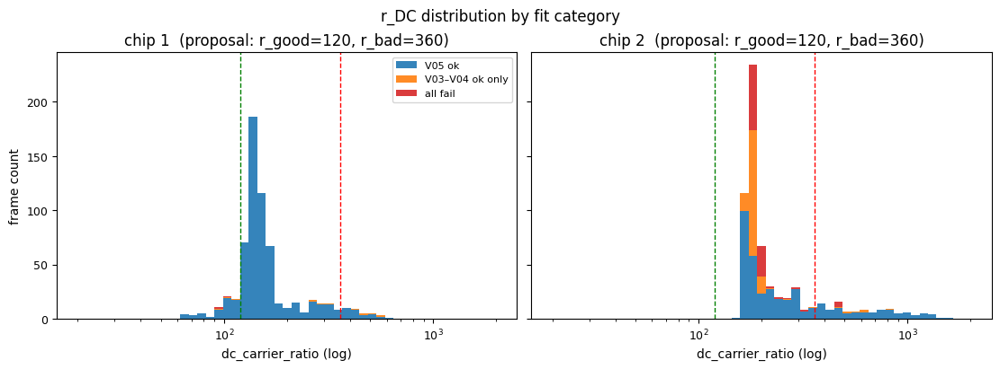

chip category                 n   median     5th    95th
--------------------------------------------------------
   1 V05 ok                 620    143.7   105.5   345.4
   1 V03–V04 ok only         11    334.3   101.6   529.9
   1 all fail                 3     97.1    95.6   105.3
   2 V05 ok                 383    217.3   162.6   949.0
   2 V03–V04 ok only        159    183.6   168.1   282.8
   2 all fail               101    188.9   180.6   307.3


In [58]:
# B1 — recalibrate r_good / r_bad for BL 5.3.1.
# r_DC distribution colored by fit-category. Monotonic V_thr strictness
# (V03 ⊆ V04 ⊆ V05) ⇒ three disjoint categories:
#   - 'V05 ok'           : strictest succeeds. Clean baseline.
#   - 'V03–V04 ok only'  : looser threshold needed. Marginal frames.
#   - 'all fail'         : no V_thr saves it. Sets the r_bad floor.

# R_GOOD_PROPOSAL = 100    # adjust after viewing
# R_BAD_PROPOSAL  = 300
R_GOOD_PROPOSAL = 120    # adjust after viewing
R_BAD_PROPOSAL  = 360


def _fit_category(r):
    statuses = [r['configs'][t]['fit_status'] for t in V_CONFIGS]
    if r['configs']['V05']['fit_status'] == 'ok':
        return 'V05 ok'
    if 'ok' in statuses:
        return 'V03–V04 ok only'
    return 'all fail'


CATS   = ['V05 ok', 'V03–V04 ok only', 'all fail']
COLORS = {'V05 ok': 'C0', 'V03–V04 ok only': 'C1', 'all fail': 'C3'}


def _rdc_by_category(chip):
    out = {c: [] for c in CATS}
    for key, recs in RESULTS.items():
        if DATASETS[key]['chip'] != chip:
            continue
        for r in recs:
            out[_fit_category(r)].append(r['dc_carrier_ratio'])
    return {c: np.array(v) for c, v in out.items()}


# Log bins for both chips so the two panels are directly comparable.
# r_DC spans ~50–800 across the dataset (chip2_grid_zero's focus column
# pushes the high tail).
bins = np.logspace(np.log10(20), np.log10(2000), 50)

fig, axes = plt.subplots(1, 2, figsize=(11, 4), constrained_layout=True,
                         sharey=True)
for ax, chip in zip(axes, [1, 2]):
    by_cat = _rdc_by_category(chip)
    ax.hist([by_cat[c] for c in CATS], bins=bins, stacked=True,
            color=[COLORS[c] for c in CATS], label=CATS, alpha=0.9)
    ax.set_xscale('log')
    ax.axvline(R_GOOD_PROPOSAL, color='green', ls='--', lw=1)
    ax.axvline(R_BAD_PROPOSAL,  color='red',   ls='--', lw=1)
    ax.set_xlabel('dc_carrier_ratio (log)')
    ax.set_title(f'chip {chip}  (proposal: r_good={R_GOOD_PROPOSAL}, '
                 f'r_bad={R_BAD_PROPOSAL})')
    ax.tick_params(labelsize=9)
axes[0].set_ylabel('frame count')
axes[0].legend(fontsize=8, loc='upper right')
fig.suptitle('r_DC distribution by fit category')
plt.show()

# Per-category quantiles
print(f"{'chip':>4} {'category':<20} {'n':>5} "
      f"{'median':>8} {'5th':>7} {'95th':>7}")
print('-' * 56)
for chip in [1, 2]:
    by_cat = _rdc_by_category(chip)
    for c in CATS:
        v = by_cat[c]
        if len(v) == 0:
            print(f"{chip:>4} {c:<20} {0:>5}")
            continue
        print(f"{chip:>4} {c:<20} {len(v):>5} "
              f"{np.median(v):>8.1f} "
              f"{np.percentile(v, 5):>7.1f} "
              f"{np.percentile(v, 95):>7.1f}")

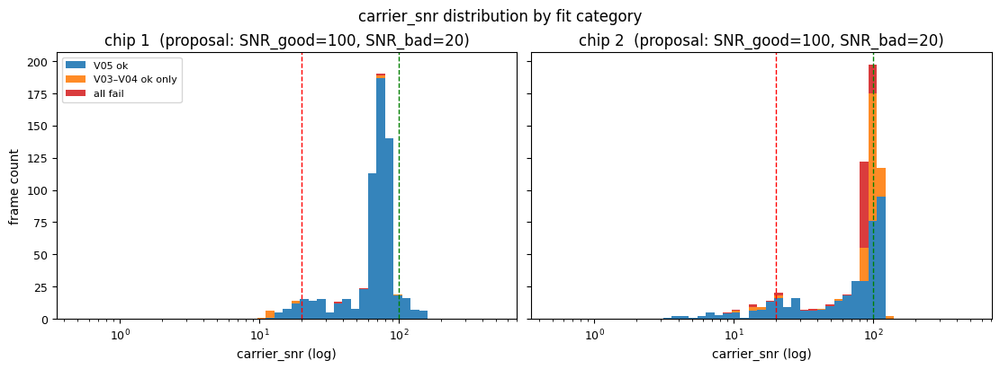

chip category                 n   median     5th    95th
--------------------------------------------------------
   1 V05 ok                 620     73.0    20.5   104.5
   1 V03–V04 ok only         11     12.4    11.0    87.3
   1 all fail                 3     53.2    39.7    76.9
   2 V05 ok                 383     83.1     9.6   114.6
   2 V03–V04 ok only        159     96.4    38.0   110.8
   2 all fail               101     88.8    20.6    95.0


In [59]:
# B1' — same recipe with carrier_snr instead of dc_carrier_ratio.
# Threshold direction reversed: high SNR is good, low SNR is bad.

SNR_GOOD_PROPOSAL = 100      # adjust after viewing
SNR_BAD_PROPOSAL  = 20


def _snr_by_category(chip):
    out = {c: [] for c in CATS}
    for key, recs in RESULTS.items():
        if DATASETS[key]['chip'] != chip:
            continue
        for r in recs:
            out[_fit_category(r)].append(r['carrier_snr'])
    return {c: np.array(v) for c, v in out.items()}


# SNR spans ~1 (worst fits) up to ~hundreds (clean wings); log bins.
bins = np.logspace(np.log10(0.5), np.log10(500), 50)

fig, axes = plt.subplots(1, 2, figsize=(11, 4), constrained_layout=True,
                         sharey=True)
for ax, chip in zip(axes, [1, 2]):
    by_cat = _snr_by_category(chip)
    ax.hist([by_cat[c] for c in CATS], bins=bins, stacked=True,
            color=[COLORS[c] for c in CATS], label=CATS, alpha=0.9)
    ax.set_xscale('log')
    ax.axvline(SNR_GOOD_PROPOSAL, color='green', ls='--', lw=1)
    ax.axvline(SNR_BAD_PROPOSAL,  color='red',   ls='--', lw=1)
    ax.set_xlabel('carrier_snr (log)')
    ax.set_title(f'chip {chip}  (proposal: SNR_good={SNR_GOOD_PROPOSAL}, '
                 f'SNR_bad={SNR_BAD_PROPOSAL})')
    ax.tick_params(labelsize=9)
axes[0].set_ylabel('frame count')
axes[0].legend(fontsize=8, loc='upper left')
fig.suptitle('carrier_snr distribution by fit category')
plt.show()

# Per-category quantiles
print(f"{'chip':>4} {'category':<20} {'n':>5} "
      f"{'median':>8} {'5th':>7} {'95th':>7}")
print('-' * 56)
for chip in [1, 2]:
    by_cat = _snr_by_category(chip)
    for c in CATS:
        v = by_cat[c]
        if len(v) == 0:
            print(f"{chip:>4} {c:<20} {0:>5}")
            continue
        print(f"{chip:>4} {c:<20} {len(v):>5} "
              f"{np.median(v):>8.1f} "
              f"{np.percentile(v, 5):>7.1f} "
              f"{np.percentile(v, 95):>7.1f}")

In [38]:
# B3 — usable-frame filter. Indicator/guideline only; not authoritative.
# Per-comparison cells can call this with overrides or build their own mask.

# Manual blanket overrides — whole scans or sub-ranges known to be unreliable
# regardless of V_thr. Loose, conservative, expand as we learn more.
USABLE_OVERRIDES = {
    # chip2_lin_near: V05 100% fail, V04 47% fail. The whole scan is at the
    # near-focus side where fringes compress; treat as unreliable by default
    # but don't hard-disable — caller can opt in.
    'chip2_lin_near': None,
    # grid_zero scans: bender ≈ 0 puts the under-focus column on the chip;
    # narrow-beam frames with tens-of-meters f_pred and overfit small masks.
    # Sub-region varies by chip; leave loose for now.
    'chip1_grid_zero': None,
    'chip2_grid_zero': None,
}


def usable(key, tag, min_n_fit=50, max_r_DC=400, require_finite_f=True):
    """Per-frame boolean mask for a given scan + V_thr config.

    Filters:
      - fit_status == 'ok'
      - n_fit_px >= min_n_fit                 (rejects overfit-tiny-mask)
      - dc_carrier_ratio < max_r_DC           (loose r_DC ceiling)
      - f_pred finite                         (defensive; ok-status implies)

    Returns a length-n_frames boolean array.

    Indicator/guideline only — caller is free to relax (e.g. min_n_fit=0)
    or tighten as the comparison demands.
    """
    recs = RESULTS[key]
    out = np.zeros(len(recs), dtype=bool)
    for i, r in enumerate(recs):
        cfg = r['configs'][tag]
        if cfg['fit_status'] != 'ok':
            continue
        if cfg['n_fit_px'] < min_n_fit:
            continue
        if r['dc_carrier_ratio'] >= max_r_DC:
            continue
        if require_finite_f and not np.isfinite(cfg['f_pred']):
            continue
        out[i] = True
    return out

In [56]:
print(f"{'scan':<15} {'V03':>15} {'V04':>15} {'V05':>15}   "
      f"(default: min_n_fit=50, max_r_DC=400)")
print('-' * 105)
for key in RESULTS:
    n = len(RESULTS[key])
    cells = []
    for tag in V_CONFIGS:
        u = usable(key, tag).sum()
        cells.append(f"{u}/{n} ({100*u/n:.0f}%)")
    print(f"{key:<16} " + " ".join(f"{c:>15}" for c in cells))

scan                        V03             V04             V05   (default: min_n_fit=50, max_r_DC=400)
---------------------------------------------------------------------------------------------------------
chip1_grid_neg     124/143 (87%)   122/143 (85%)   118/143 (83%)
chip1_grid_zero      88/99 (89%)     88/99 (89%)     84/99 (85%)
chip1_lin_near    191/191 (100%)  191/191 (100%)  191/191 (100%)
chip1_lin_far     201/201 (100%)  201/201 (100%)  201/201 (100%)
chip2_grid_neg     118/143 (83%)   116/143 (81%)   114/143 (80%)
chip2_grid_zero      19/99 (19%)     19/99 (19%)     17/99 (17%)
chip2_lin_near     112/200 (56%)    84/200 (42%)      0/200 (0%)
chip2_lin_far     201/201 (100%)  201/201 (100%)   118/201 (59%)


## Multi-frame comparisons 


### Sweep helpers

In [12]:
# Three-tier per-frame flag. Caller can disable any check via None.
# Returns 'fail' | 'suspect' | 'ok'.

def frame_flag(res, min_n_fit=50, check_focus_edge=True, min_snr=None):
    if res.get('fit_status') != 'ok':
        return 'fail'
    if min_n_fit is not None and res['n_fit_px'] < min_n_fit:
        return 'suspect'
    if check_focus_edge and res.get('focus_at_edge', False):
        return 'suspect'
    if min_snr is not None and res['carrier_snr'] < min_snr:
        return 'suspect'
    return 'ok'

In [13]:
# sweep: reconstruct one slice through a scan, full result dicts.
#
# Grid scan: fix exactly one of (fix_E_idx, fix_B_idx); sweeps the other axis.
# Linear scan: neither needed; sweeps along the linear motor. `step` subsamples.
#
# Returns (results, param, label, flags). param is the sweep-axis values
# (bender_um, mono_energy_eV, or bcs_linear_motor_mm); label is the axis title.

def sweep(key, *, fix_E_idx=None, fix_B_idx=None, step=None,
          V_threshold=0.4, propagate=True, **overrides):
    images, meta, info = get_scan(key)
    is_grid = 'mono_energy_eV' in meta and 'bender_um' in meta
    is_lin  = 'bcs_linear_motor_mm' in meta

    if is_grid:
        n_E, n_B = info['shape']
        if (fix_E_idx is None) == (fix_B_idx is None):
            raise ValueError("Grid sweep: specify exactly one of "
                             "fix_E_idx, fix_B_idx")
        if fix_E_idx is not None:
            indices = [fix_E_idx * n_B + j for j in range(n_B)]
            param   = np.asarray(meta['bender_um'])[indices]
            label   = 'bender [µm]'
        else:
            indices = [i * n_B + fix_B_idx for i in range(n_E)]
            param   = np.asarray(meta['mono_energy_eV'])[indices]
            label   = 'energy [eV]'
    elif is_lin:
        n = info['n_frames']
        indices = list(range(0, n, step or 1))
        param   = np.asarray(meta['bcs_linear_motor_mm'])[indices]
        label   = 'lm [mm]'
    else:
        raise ValueError(f"Unknown scan type for {key}")

    results = [reco_frame(key, i, V_threshold=V_threshold,
                          propagate=propagate, **overrides)
               for i in indices]
    flags = [frame_flag(r) for r in results]

    counts = {t: sum(f == t for f in flags) for t in ('ok', 'suspect', 'fail')}
    print(f"[{key}] {len(indices)} frames @ V_thr={V_threshold}, "
          f"propagate={propagate}  →  "
          f"{counts['ok']} ok, {counts['suspect']} suspect, "
          f"{counts['fail']} fail")
    return results, param, label, flags

### Multi-frame comparison pipeline test

`chip1_grid_neg`, `FIX_B_IDX  = 2` to test (multi-energy at bender = -1900 µm).

In [16]:
# Sanity check for sweep(). chip1_grid_neg at fix_B_idx=2 → bender = -1900 µm,
# 11 frames over E = 7000..9000 eV. Reproduces the "Sweep 2" slice from the
# prototype. propagate=False here to keep the test cheap — we'll switch to
# True for the actual plots.

results, param, label, flags = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.4, propagate=False,
)

print(f"\nparam ({label}): {param}")
print(f"\n{'idx':>3} {'E [eV]':>8} {'flag':>8} "
      f"{'f_pred [m]':>12} {'rms_resid':>12} {'n_fit':>7}")
for i, (r, p, f) in enumerate(zip(results, param, flags)):
    f_pred = r['f_pred']    if np.isfinite(r['f_pred'])       else float('nan')
    rms    = r['rms_resid_nm'] if np.isfinite(r['rms_resid_nm']) else float('nan')
    print(f"{i:>3d} {p:>8.0f} {f:>8s} "
          f"{f_pred:>+12.3f} {rms:>12.3f} {r['n_fit_px']:>7d}")

[chip1_grid_neg] 11 frames @ V_thr=0.4, propagate=False  →  10 ok, 0 suspect, 1 fail

param (energy [eV]): [6999.82026249 7199.75430632 7399.8249612  7599.965793   7799.69586854
 8000.18402781 8200.077768   8399.64098065 8599.92676675 8800.28140144
 8999.98635788]

idx   E [eV]     flag   f_pred [m]    rms_resid   n_fit
  0     7000     fail         +nan          nan       0
  1     7200       ok       -5.732        0.008     378
  2     7400       ok       -5.704        0.036    1087
  3     7600       ok       -5.432        0.091    1218
  4     7800       ok       -5.071        0.140    1207
  5     8000       ok       -5.094        0.174    1269
  6     8200       ok       -4.239        0.545    1783
  7     8400       ok       -4.296        0.555    1844
  8     8600       ok       -4.266        0.549    1845
  9     8800       ok       -3.737        0.598    1726
 10     9000       ok       -4.185        0.551    1778


In [59]:
# Small-multiples helper for per-frame fringe profiles. Failed frames are
# still drawn (we want to see why they failed) with the title in red.
#
# Returns (fig, axes) so the caller can post-edit; default styling is
# minimal — flag-color in the title, centroid vline at x=0, beam-mask
# shaded yellow.

_FLAG_COLOR = {'ok': 'black', 'suspect': 'darkorange', 'fail': 'firebrick'}


def _grid_layout(n, ncols, figsize=None, panel=(4, 2.4), sharey=False):
    """Common axes layout for small-multiples helpers."""
    nrows = int(np.ceil(n / ncols))
    figsize = figsize or (ncols * panel[0], nrows * panel[1])
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize,
                             sharey=sharey, squeeze=False,
                             constrained_layout=True)
    # Hide trailing unused axes; return everything so the caller knows
    # how many are visible.
    for j in range(n, nrows * ncols):
        axes.flat[j].set_visible(False)
    return fig, axes, nrows


def plot_fringe_grid(results, param, flags, label,
                     ncols=3, figsize=None, sharey=False):
    """Per-frame fringe profile (collapsed y), arranged in a grid.

    Raw position axis (origin = left edge of detector ROI). Centroid x_c
    marked at its physical mm position; beam_mask shaded yellow.
    """
    n = len(results)
    fig, axes, nrows = _grid_layout(n, ncols, figsize, sharey=sharey)

    for i, (r, p, f) in enumerate(zip(results, param, flags)):
        ax = axes.flat[i]
        N = len(r['profile'])
        x_raw_mm = np.arange(N) * r['dx'] * 1e3
        xc_mm    = r['x_c']     * r['dx'] * 1e3
        ax.plot(x_raw_mm, r['profile'], lw=0.6, color='steelblue',
                label='profile')
        ax.axvline(xc_mm, color='red', ls=':', alpha=0.6, lw=1,
                   label='centroid x_c')
        bm = r['beam_mask']
        if bm.any():
            i0, i1 = np.where(bm)[0][[0, -1]]
            ax.axvspan(x_raw_mm[i0], x_raw_mm[i1], color='yellow', alpha=0.15,
                       label='beam_mask')
        ax.set_title(f"{label} = {p:.0f}  [{f}]",
                     color=_FLAG_COLOR[f], fontsize=9)
        ax.tick_params(labelsize=8)
        row, col = divmod(i, ncols)
        on_bottom = (row == nrows - 1) or (i + ncols >= n)
        if on_bottom:
            ax.set_xlabel('position [mm]', fontsize=9)
        if col == 0:
            ax.set_ylabel('intensity', fontsize=9)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right', framealpha=0.9)
    return fig, axes

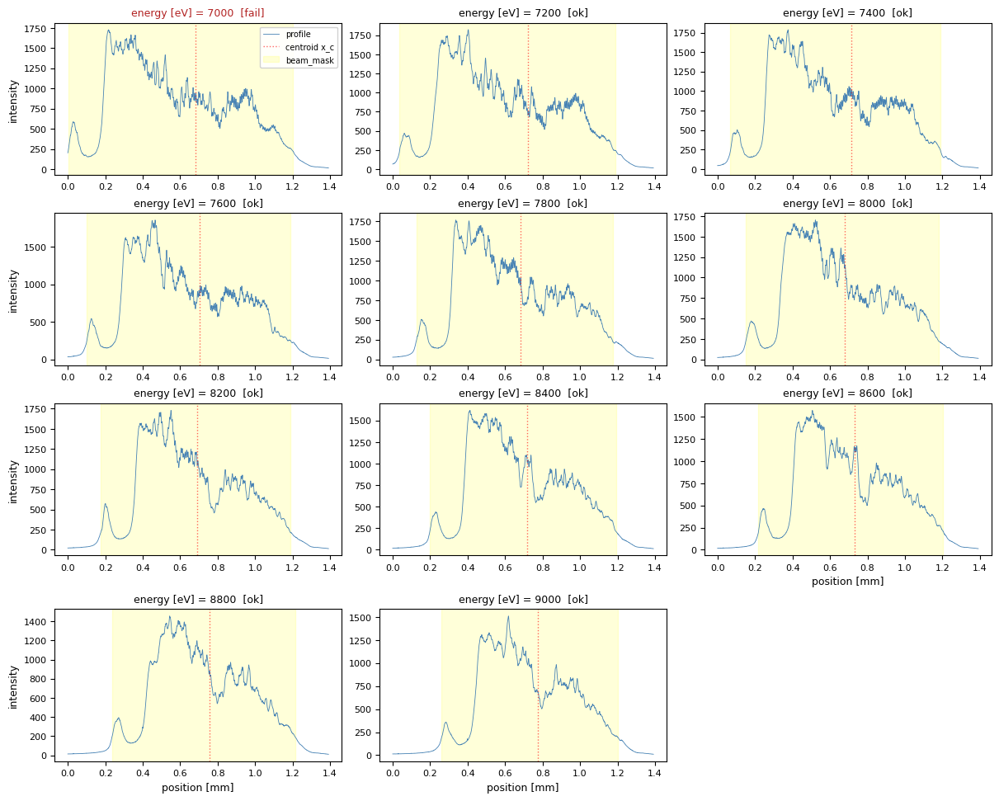

In [60]:
fig, _ = plot_fringe_grid(results, param, flags, label, ncols=3)
plt.show()

In [47]:
def plot_fft_grid(results, param, flags, label,
                  ncols=3, figsize=None):
    """Per-frame FFT magnitude spectrum (semilog y).

    Mark: k_peak (red), k_ideal (faint red), carrier search band (yellow).
    x-range: (-k_ideal, 3·k_ideal) in cyc/mm — matches plot_result Panel 2.
    Shared y because |FFT| dynamic range is large but comparable across
    frames in log space.
    """
    n = len(results)
    fig, axes, nrows = _grid_layout(n, ncols, figsize, sharey=True)

    for i, (r, p, f) in enumerate(zip(results, param, flags)):
        ax = axes.flat[i]
        freq      = r['freq']
        fft_amp   = np.abs(r['fft_avg'])
        k_peak    = r['k_peak']
        k_ideal   = r['k_ideal']
        b_lo, b_hi = r['carrier_band']
        ax.semilogy(freq * 1e-3, fft_amp, lw=0.5, color='steelblue',
                    label='|FFT|')
        ax.axvspan(b_lo * 1e-3, b_hi * 1e-3, color='yellow', alpha=0.15,
                   label='search band')
        ax.axvline(k_ideal * 1e-3, color='red', ls='--', alpha=0.5, lw=1,
                   label='k_ideal')
        ax.axvline(k_peak  * 1e-3, color='red', ls='-', alpha=0.7, lw=0.7,
                   label='k_peak')
        ax.set_xlim(-k_ideal * 1e-3, 3 * k_ideal * 1e-3)
        ax.set_title(f"{label} = {p:.0f}  [{f}]",
                     color=_FLAG_COLOR[f], fontsize=9)
        ax.tick_params(labelsize=8)
        row, col = divmod(i, ncols)
        on_bottom = (row == nrows - 1) or (i + ncols >= n)
        if on_bottom:
            ax.set_xlabel('freq [cyc/mm]', fontsize=9)
        if col == 0:
            ax.set_ylabel('|FFT|', fontsize=9)
        if i == 0:
            ax.legend(fontsize=6, loc='upper right', framealpha=0.9)
    return fig, axes

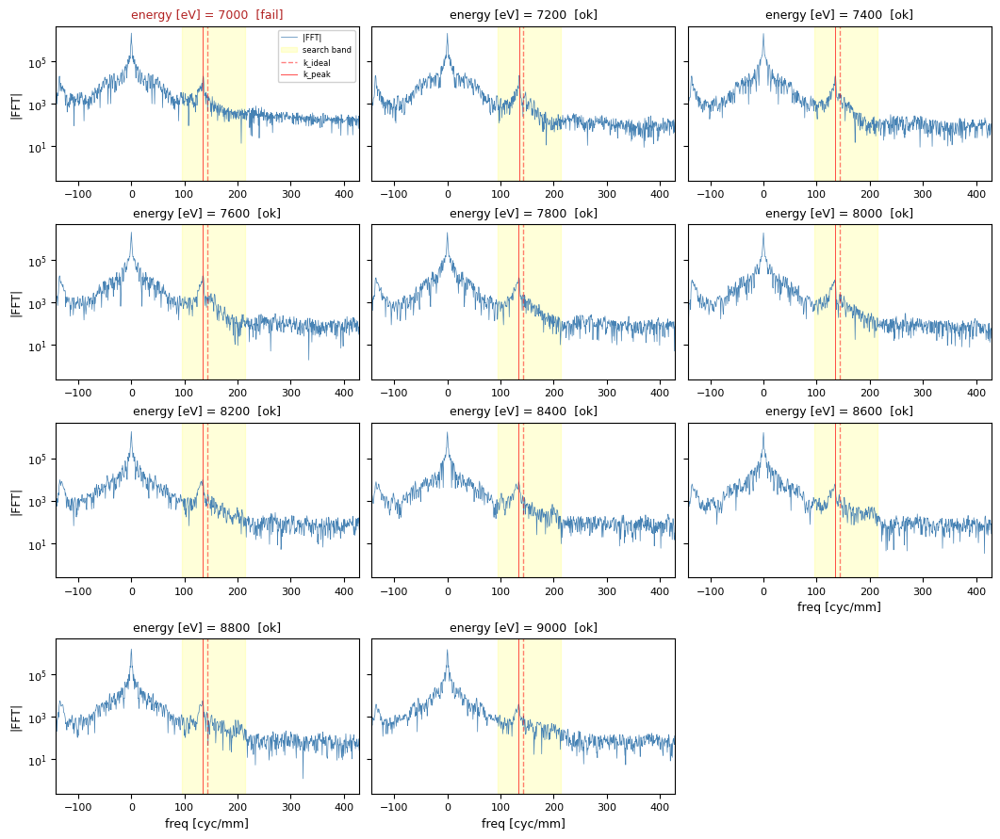

In [48]:
fig, _ = plot_fft_grid(results, param, flags, label, ncols=3)
plt.show()

In [61]:
def plot_envelope_grid(results, param, flags, label,
                       ncols=3, figsize=None):
    """Per-frame envelopes I0 and |A1| (normalized) with masks shaded.

    Raw position axis (consistent with plot_fringe_grid). Centroid x_c
    marked. Gold = beam_mask; lightcoral hatched = beam_mask & ~trust_mask
    (rejected by V < V_threshold). Mirrors plot_result Panel 3.
    """
    n = len(results)
    fig, axes, nrows = _grid_layout(n, ncols, figsize, sharey=True)

    for i, (r, p, f) in enumerate(zip(results, param, flags)):
        ax = axes.flat[i]
        N = len(r['I0'])
        x_raw_mm = np.arange(N) * r['dx'] * 1e3
        xc_mm    = r['x_c']     * r['dx'] * 1e3

        I0_n = r['I0'] / r['I0'].max()
        A1_n = r['A1'] / r['A1'].max()
        bm   = r['beam_mask']
        rej  = bm & ~r['trust_mask']

        ax.plot(x_raw_mm, I0_n, 'C0', lw=1.3, label=r'$I_0$ (norm)')
        ax.plot(x_raw_mm, A1_n, 'C3', lw=1.3, label=r'$A_{+1}$ (norm)')
        ax.fill_between(x_raw_mm, 0, 1.05, where=bm,
                        color='gold', alpha=0.15, label='beam_mask')
        if rej.any():
            ax.fill_between(x_raw_mm, 0, 1.05, where=rej,
                            color='lightcoral', alpha=0.35, hatch='///',
                            edgecolor='firebrick', linewidth=0,
                            label=r'excluded ($V < V_{\rm thr}$)')
        ax.axvline(xc_mm, color='C3', ls=':', alpha=0.7, lw=1,
                   label='centroid x_c')

        ax.set_ylim(0, 1.05)
        ax.set_title(f"{label} = {p:.0f}  [{f}]  "
                     f"({r['n_mask_px']} bm, {r['n_fit_px']} fit)",
                     color=_FLAG_COLOR[f], fontsize=9)
        ax.tick_params(labelsize=8)
        row, col = divmod(i, ncols)
        on_bottom = (row == nrows - 1) or (i + ncols >= n)
        if on_bottom:
            ax.set_xlabel('position [mm]', fontsize=9)
        if col == 0:
            ax.set_ylabel('norm intensity', fontsize=9)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right', framealpha=0.9)
    return fig, axes

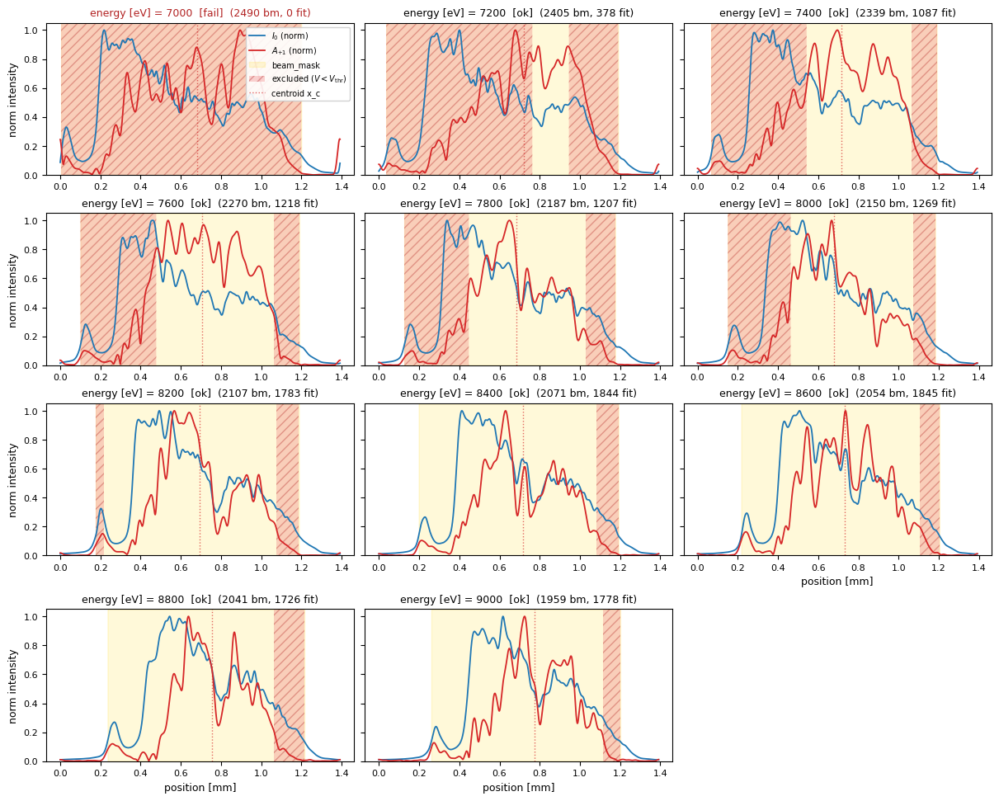

In [62]:
fig, _ = plot_envelope_grid(results, param, flags, label, ncols=3)
plt.show()

In [63]:
def plot_V_grid(results, param, flags, label,
                thresholds=(0.3, 0.4, 0.5),
                ncols=3, figsize=None):
    """Per-frame visibility V(x) = 2·A1/I0, arranged in a grid.

    Horizontal lines mark candidate V_thresholds (gray gradient, darker =
    stricter). Beam_mask shaded yellow. y-range fixed to (0, 1) so the
    threshold lines stay at the same vertical position across panels.

    Title appends V_max within beam_mask — if V_max < V_thr, no pixel
    survives gating at that threshold.
    """
    n = len(results)
    fig, axes, nrows = _grid_layout(n, ncols, figsize, sharey=True)
    thr_colors = plt.cm.Greys(np.linspace(0.45, 0.85, len(thresholds)))

    for i, (r, p, f) in enumerate(zip(results, param, flags)):
        ax = axes.flat[i]
        N = len(r['V'])
        x_raw_mm = np.arange(N) * r['dx'] * 1e3
        xc_mm    = r['x_c']     * r['dx'] * 1e3
        bm = r['beam_mask']
        V_max = float(r['V'][bm].max()) if bm.any() else float(r['V'].max())

        if bm.any():
            ax.fill_between(x_raw_mm, 0, 1.0, where=bm,
                            color='gold', alpha=0.15, label='beam_mask')
        ax.plot(x_raw_mm, r['V'], color='purple', lw=1.0, label='V')
        for t, c in zip(thresholds, thr_colors):
            ax.axhline(t, color=c, ls='--', lw=0.9, alpha=0.9,
                       label=f'V_thr={t:.1f}')
        ax.axvline(xc_mm, color='C3', ls=':', alpha=0.7, lw=1,
                   label='centroid x_c')

        ax.set_ylim(0, 1)
        ax.set_title(f"{label} = {p:.0f}  [{f}]  V_max={V_max:.2f}",
                     color=_FLAG_COLOR[f], fontsize=9)
        ax.tick_params(labelsize=8)
        row, col = divmod(i, ncols)
        on_bottom = (row == nrows - 1) or (i + ncols >= n)
        if on_bottom:
            ax.set_xlabel('position [mm]', fontsize=9)
        if col == 0:
            ax.set_ylabel('V', fontsize=9)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right', framealpha=0.9, ncol=2)
    return fig, axes

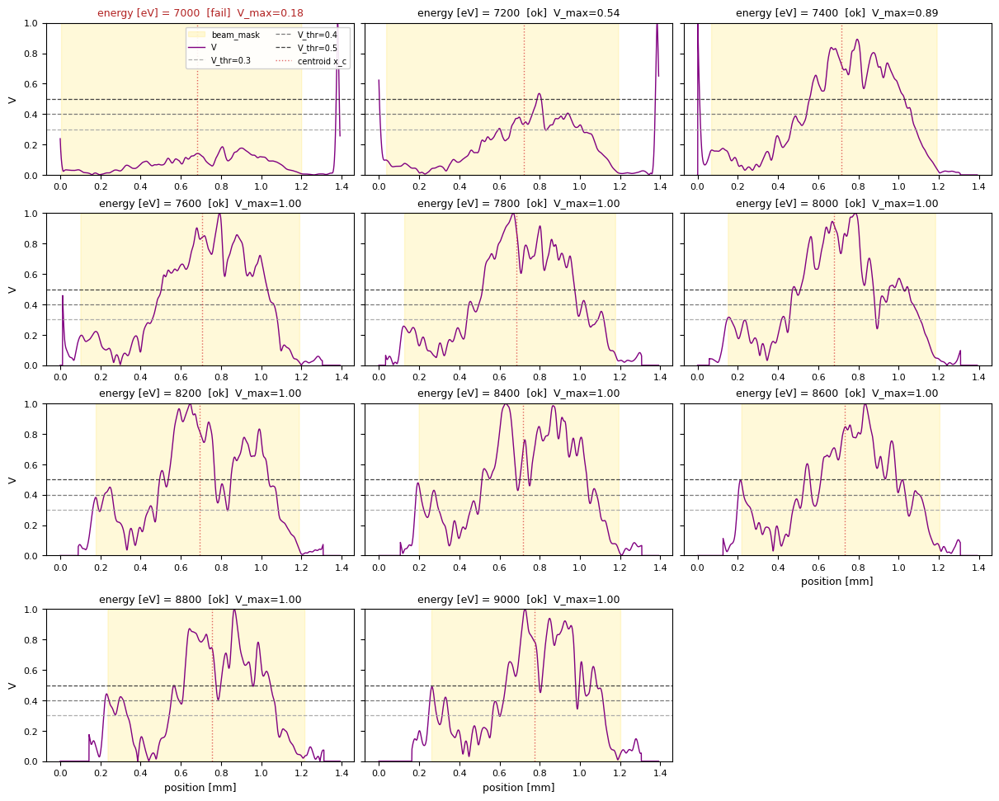

In [64]:
fig, _ = plot_V_grid(results, param, flags, label, ncols=3)
plt.show()

     E   V_med     V25   Vr_max   Vr_med    Vr_25  edge/beam   (norm | raw | edge-spike ratio)
----------------------------------------------------------------------
  7000   0.072   0.031    0.068    0.026    0.012       4.60
  7200   0.189   0.061    0.077    0.027    0.009       1.43
  7400   0.356   0.153    0.063    0.025    0.011       1.12
  7600   0.456   0.150    0.061    0.028    0.009       1.00
  7800   0.393   0.204    0.050    0.020    0.010       1.00
  8000   0.460   0.239    0.042    0.019    0.010       1.00
  8200   0.453   0.245    0.035    0.016    0.009       1.00
  8400   0.492   0.268    0.029    0.014    0.008       1.00
  8600   0.413   0.224    0.026    0.011    0.006       1.00
  8800   0.416   0.161    0.024    0.010    0.004       1.00
  9000   0.438   0.208    0.017    0.008    0.004       1.00


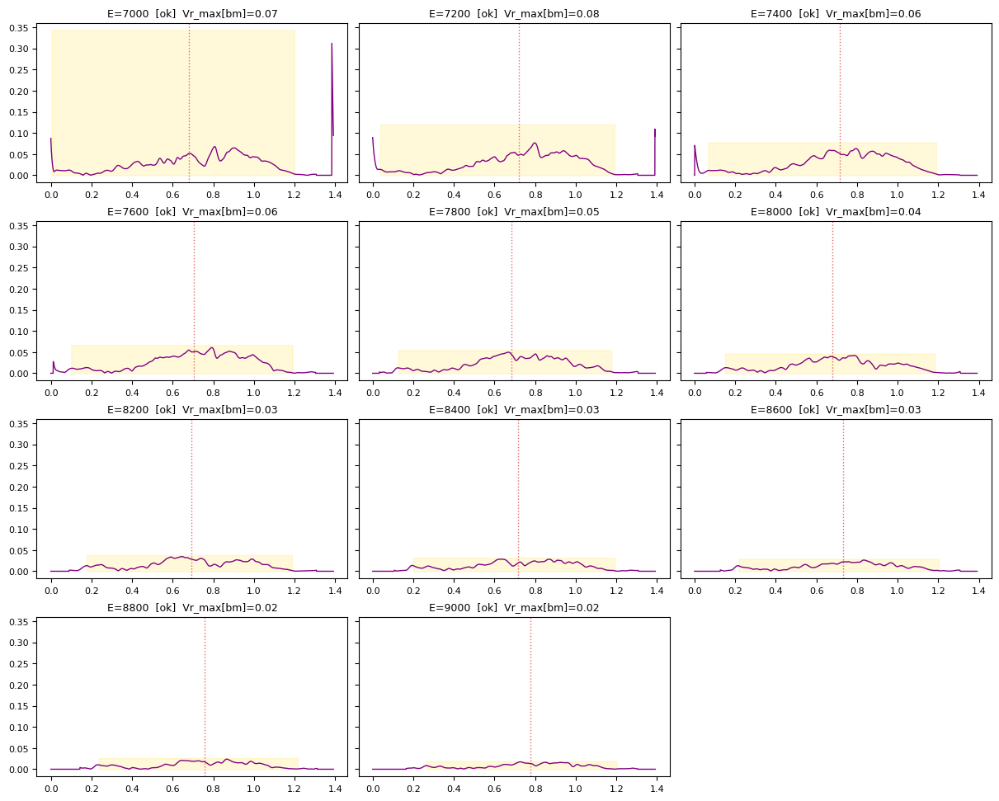

In [148]:
# Raw V = 2·A1/I0 with the same safety floor (I0 > 2% max) used by the
# script's safety_mask, but NOT renormalized. Compare to normalized V.

I0_FLOOR_FRAC = 0.02   # matches script's I0_threshold

def _raw_V(r, floor_frac=I0_FLOOR_FRAC):
    I0_thresh = floor_frac * r['I0'].max()
    return np.where(r['I0'] > I0_thresh,
                    2 * r['A1'] / np.maximum(r['I0'], I0_thresh),
                    0.0)

# Augmented metric table — normalized V stats vs raw V stats inside beam_mask.
print(f"{'E':>6} "
      f"{'V_med':>7} {'V25':>7} "
      f"{'Vr_max':>8} {'Vr_med':>8} {'Vr_25':>8} "
      f"{'edge/beam':>10}   (norm | raw | edge-spike ratio)")
print('-' * 70)
for r, p in zip(results_00, param_00):
    bm = r['beam_mask']
    sm = r['safety_mask']
    V_norm = r['V']
    V_raw  = _raw_V(r)
    edge_over_beam = (V_raw[sm].max() / max(V_raw[bm].max(), 1e-12)
                      if bm.any() else np.nan)
    print(f"{p:>6.0f} "
          f"{np.median(V_norm[bm]):>7.3f} "
          f"{np.percentile(V_norm[bm], 25):>7.3f} "
          f"{V_raw[bm].max():>8.3f} "
          f"{np.median(V_raw[bm]):>8.3f} "
          f"{np.percentile(V_raw[bm], 25):>8.3f} "
          f"{edge_over_beam:>10.2f}")
    
fig, axes, nrows = _grid_layout(len(results_00), ncols=3, sharey=True)
for i, (r, p, f) in enumerate(zip(results_00, param_00, flags_00)):
    ax = axes.flat[i]
    N = len(r['V'])
    x_raw_mm = np.arange(N) * r['dx'] * 1e3
    xc_mm    = r['x_c']     * r['dx'] * 1e3
    bm = r['beam_mask']
    V_raw = _raw_V(r)
    V_max_bm = V_raw[bm].max() if bm.any() else 0
    ax.fill_between(x_raw_mm, 0, V_raw.max() * 1.1, where=bm,
                    color='gold', alpha=0.15)
    ax.plot(x_raw_mm, V_raw, color='purple', lw=1.0)
    ax.axvline(xc_mm, color='C3', ls=':', alpha=0.7, lw=1)
    ax.set_title(f"E={p:.0f}  [{f}]  Vr_max[bm]={V_max_bm:.2f}",
                 color=_FLAG_COLOR[f], fontsize=9)
    ax.tick_params(labelsize=8)
plt.show()

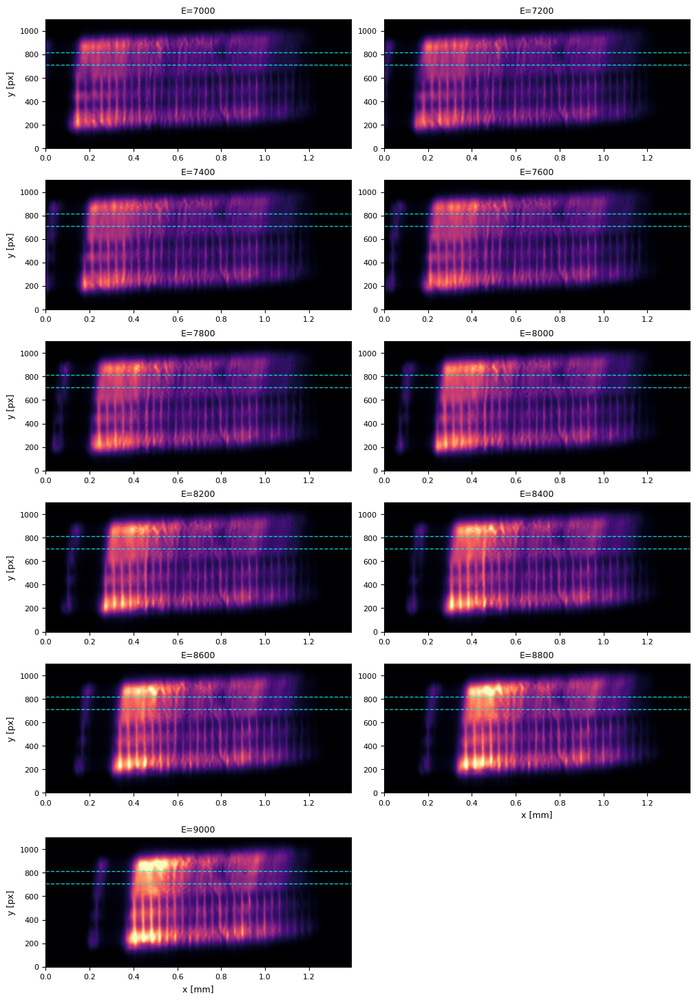

In [205]:
images_full, meta, info = SCANS[KEY]
y_roi                   = CHIP_DEFAULTS[1]['y_roi']
n = len(results_00)
fig, axes, nrows = _grid_layout(n, ncols=2, panel=(5, 2.4), sharey=False)

for i, (r, p, f) in enumerate(zip(results_00, param_00, flags_00)):
    ax = axes.flat[i]
    sub_disp = images_full[i].T                  # full image, (N_y_full, N_x)
    N_y, N_x = sub_disp.shape                    # (1100, 2900)
    extent_mm = [0, N_x * r['dx'] * 1e3,         # x: 0 → ~1.4 mm
                 0, N_y]                          # y: 0 → 1100 (raw px)
    ax.imshow(sub_disp, origin='lower', aspect='auto',
              extent=extent_mm, cmap='magma',
              vmin=100, vmax=3000) #sub_disp.max())
    # Mark y_roi as horizontal reference lines
    ax.axhline(y_roi.start, color='cyan', ls='--', lw=1.0, alpha=0.8)
    ax.axhline(y_roi.stop,  color='cyan', ls='--', lw=1.0, alpha=0.8)
    ax.set_title(f"E={p:.0f}", #  [{f}]  max={int(sub_disp.max())}",
                 color=_FLAG_COLOR[f], fontsize=9)
    ax.tick_params(labelsize=8)
    row, col = divmod(i, 2)
    on_bottom = (row == nrows - 1) or (i + 2 >= n)
    if on_bottom:
        ax.set_xlabel('x [mm]', fontsize=9)
    if col == 0:
        ax.set_ylabel('y [px]', fontsize=9)

plt.show()

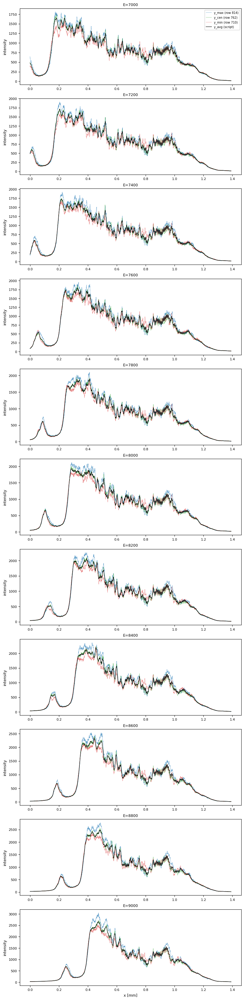

In [204]:
# y_avg (what the script averages) vs single-row profiles at y_max,
# y_min, y_cen (all within y_roi). If y_max shows clean fringes but
# y_avg doesn't, y-averaging is washing out the contrast — either by
# mixing in dim rows or by mixing rows whose carrier phase shifts in y.

images_full, meta, info = SCANS[KEY]
y_roi                   = CHIP_DEFAULTS[1]['y_roi']
n = len(results_00)
fig, axes, nrows = _grid_layout(n, ncols=1, panel=(8, 3), sharey=False)

for i, (r, p, f) in enumerate(zip(results_00, param_00, flags_00)):
    ax = axes.flat[i]
    img = images_full[i]                       # (2900, 1100)
    sub = img[:, y_roi]                        # (2900, 105) — fringes on axis-0

    # Per-row total intensity → identify brightest/dimmest rows WITHIN y_roi
    row_total = sub.sum(axis=0)                # length 105
    i_max = int(row_total.argmax())
    i_min = int(row_total.argmin())
    i_cen = sub.shape[1] // 2

    y_avg = sub.mean(axis=1)                   # what the script uses
    y_max = sub[:, i_max]                      # brightest row in y_roi
    y_min = sub[:, i_min]                      # dimmest row in y_roi
    y_cen = sub[:, i_cen]                      # center of y_roi (y ≈ 762)

    x_mm = np.arange(len(y_avg)) * r['dx'] * 1e3

    ax.plot(x_mm, y_max, color='C0',    lw=0.5, alpha=0.7,
            label=f'y_max (row {y_roi.start + i_max})')
    ax.plot(x_mm, y_cen, color='C2',    lw=0.5, alpha=0.7,
            label=f'y_cen (row {y_roi.start + i_cen})')
    ax.plot(x_mm, y_min, color='C3',    lw=0.5, alpha=0.6,
            label=f'y_min (row {y_roi.start + i_min})')
    ax.plot(x_mm, y_avg, color='black', lw=0.9,
            label='y_avg (script)')

    ax.set_title(f"E={p:.0f}", color=_FLAG_COLOR[f], fontsize=9)
    ax.tick_params(labelsize=8)
    row, col = divmod(i, 1)
    on_bottom = (row == nrows - 1) or (i + 1 >= n)
    if on_bottom:
        ax.set_xlabel('x [mm]', fontsize=9)
    if col == 0:
        ax.set_ylabel('intensity', fontsize=9)
    if i == 0:
        ax.legend(fontsize=7, loc='upper right', framealpha=0.9)

plt.show()

In [206]:
y_roi

slice(710, 815, None)

[chip1_grid_neg] 11 frames @ V_thr=0.3, propagate=False  →  10 ok, 0 suspect, 1 fail


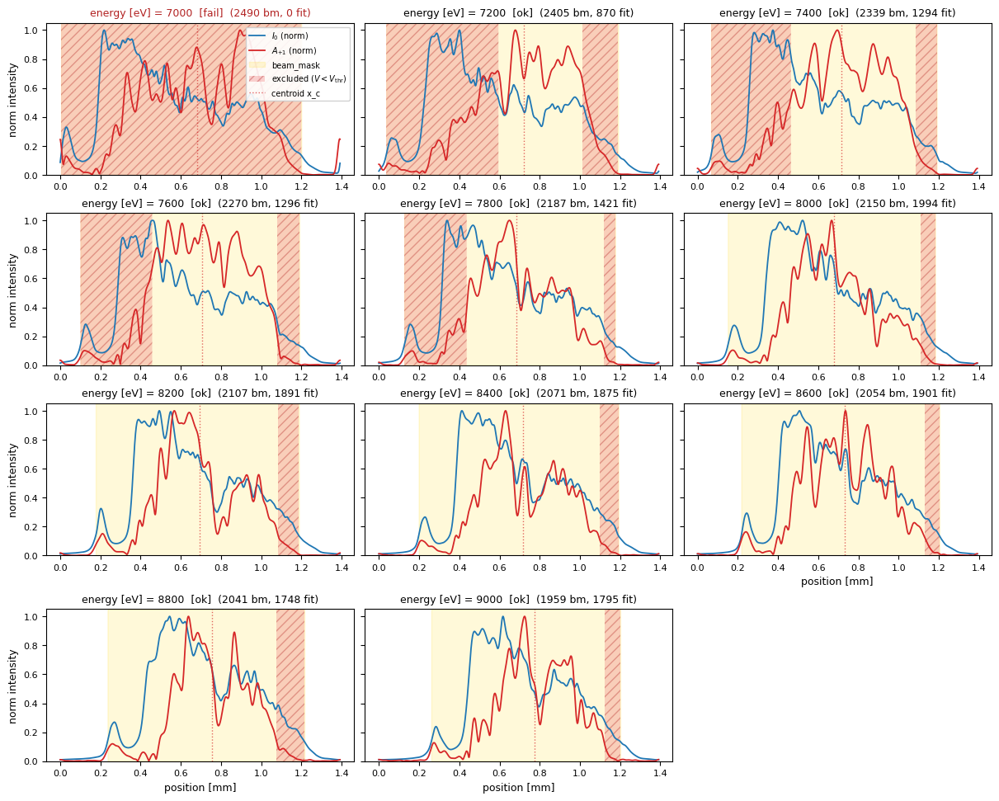

In [67]:
# Confirm that V_thr=0.3 recovers the idx=0 (E=7000) fit. Re-sweep at the
# looser threshold; re-plot only the envelope grid since fringe and FFT
# are V_thr-independent.

results_03, param_03, label_03, flags_03 = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.3, propagate=False,
)
fig, _ = plot_envelope_grid(results_03, param_03, flags_03, label_03, ncols=3)
plt.show()

[chip1_grid_neg] 11 frames @ V_thr=0.1, propagate=False  →  11 ok, 0 suspect, 0 fail


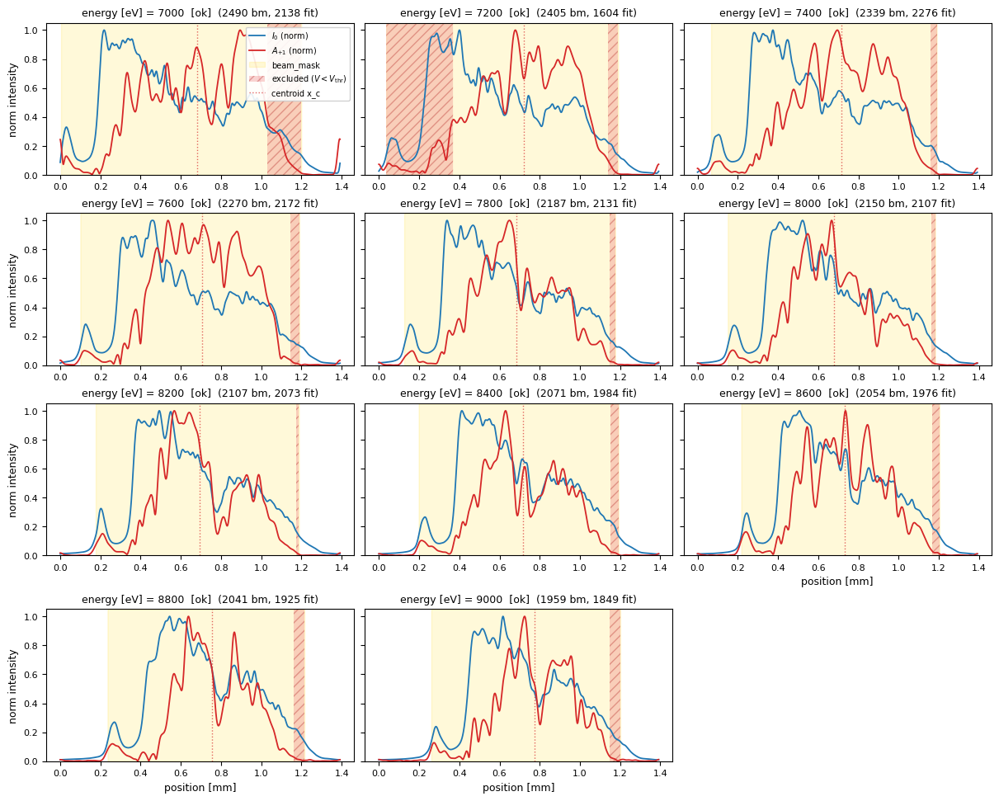

In [73]:
# Confirm that V_thr=0.3 recovers the idx=0 (E=7000) fit. Re-sweep at the
# looser threshold; re-plot only the envelope grid since fringe and FFT
# are V_thr-independent.

results_01, param_01, label_01, flags_01 = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.1, propagate=False,
)
fig, _ = plot_envelope_grid(results_01, param_01, flags_01, label_01, ncols=3)
plt.show()

[chip1_grid_neg] 11 frames @ V_thr=0.6, propagate=False  →  9 ok, 0 suspect, 2 fail


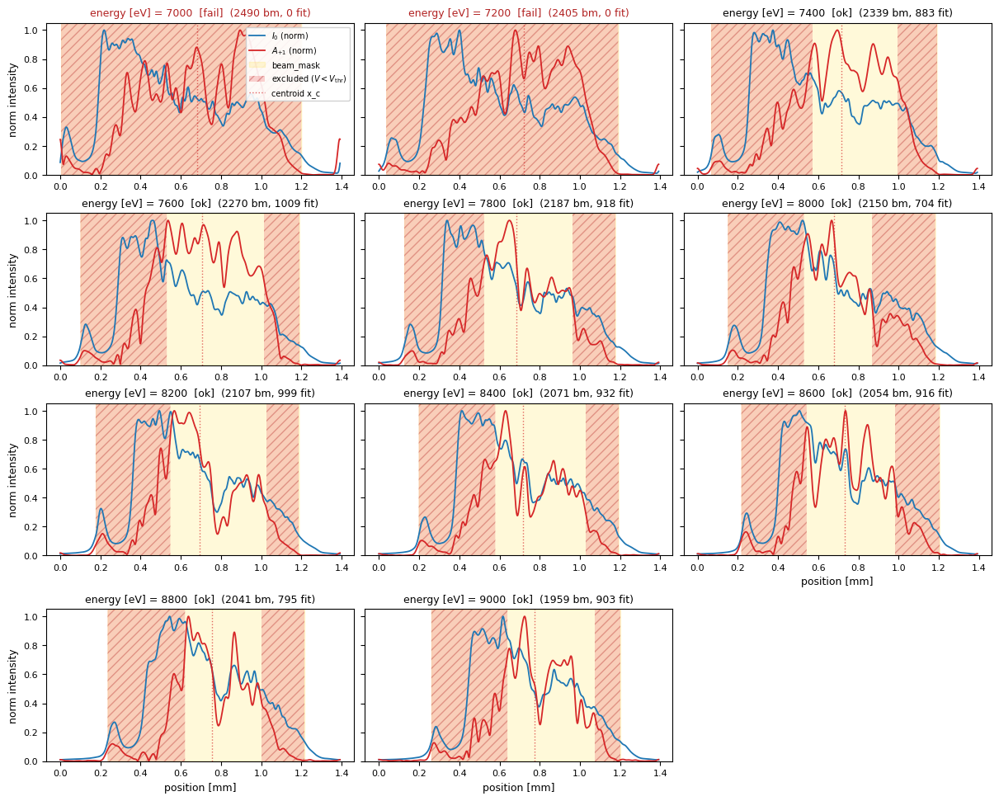

In [101]:
# Confirm that V_thr=0.3 recovers the idx=0 (E=7000) fit. Re-sweep at the
# looser threshold; re-plot only the envelope grid since fringe and FFT
# are V_thr-independent.

results_06, param_06, label_06, flags_06 = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.6, propagate=False,
)
fig, _ = plot_envelope_grid(results_06, param_06, flags_06, label_06, ncols=3)
plt.show()

In [144]:
from matplotlib.colors import Normalize


def plot_wavefront_overlay(ax, results, param, flags, cmap='magma',
                           x_axis='centered',
                           vmin=None, vmax=None,
                           lw_trust=1.3, lw_dim=1.0,
                           alpha_trust=1.0, alpha_dim=0.4):
    """Overlay W(x) for many frames on a single axis.

    Two-segment per-frame styling:
      - solid, full alpha within trust_mask
      - dashed, lower alpha within (beam_mask & ~trust_mask)

    W is computed for every frame regardless of fit_status, so fail frames
    are still drawn (the color/parameter axis tells you which is which).

    x_axis='centered' (default) puts each frame's centroid at x=0;
    x_axis='raw' uses raw detector position (origin at left edge of ROI).

    vmin/vmax control the colormap range — set wider than the data range
    to avoid bright-end colormap extremes.
    """
    if x_axis not in ('centered', 'raw'):
        raise ValueError("x_axis must be 'centered' or 'raw'")

    cmap_obj = plt.get_cmap(cmap)
    norm = Normalize(
        vmin=float(np.nanmin(param)) if vmin is None else vmin,
        vmax=float(np.nanmax(param)) if vmax is None else vmax,
    )

    for r, p in zip(results, param):
        c   = cmap_obj(norm(p))
        if x_axis == 'centered':
            x = r['x_mm']
        else:
            x = r['x_mm'] + r['x_c'] * r['dx'] * 1e3
        W   = r['W_nm']
        bm  = r['beam_mask']
        tm  = r['trust_mask']
        dim = bm & ~tm
        ax.plot(x, np.where(tm,  W, np.nan), color=c, lw=lw_trust,
                alpha=alpha_trust)
        ax.plot(x, np.where(dim, W, np.nan), color=c, ls='--', lw=lw_dim,
                alpha=alpha_dim)

    xlabel = ('x [mm]  (centered at centroid)' if x_axis == 'centered'
              else 'x [mm]  (raw detector position)')
    ax.set_xlabel(xlabel)
    ax.set_ylabel('W [nm OPL]')
    ax.grid(alpha=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_obj, norm=norm)
    sm.set_array([])
    return sm

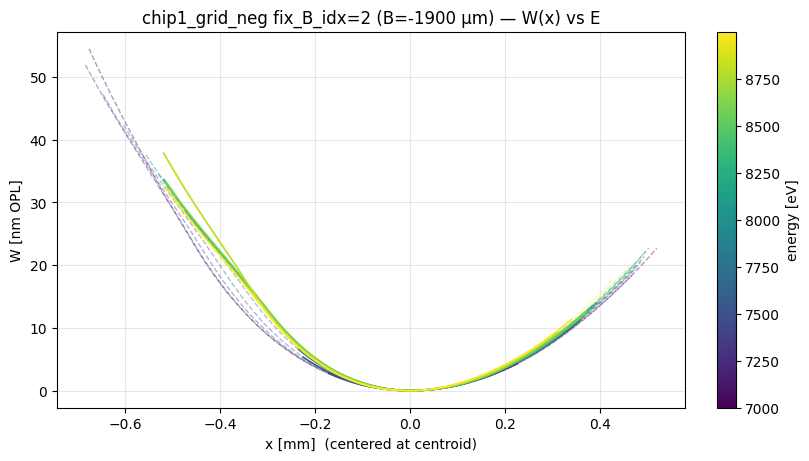

In [ ]:
# Overlay W(x) for the chip1_grid_neg sweep at V_thr=0.4. Color by energy to
# see if there's a trend; confirm that the idx=0 (E=7000) fit is reasonable.

fig, ax = plt.subplots(figsize=(8, 4.5), constrained_layout=True)
sm = plot_wavefront_overlay(ax, results, param, flags, cmap='viridis')
fig.colorbar(sm, ax=ax, label=label)
ax.set_title(f'chip1_grid_neg fix_B_idx=2 (B=-1900 µm) — W(x) vs E')
plt.show()

In [76]:
def plot_residual_overlay(ax, results, param, flags, cmap='viridis',
                          lw_ok=1.3, lw_suspect=1.0,
                          alpha_ok=1.0, alpha_suspect=0.7):
    """Overlay residual W − parabolic_fit for many frames on a single axis.

    Residual is defined only over fit_mask. Each frame converted rad → nm
    with its own wavelength (matters for multi-E sweeps).

    Styling:
      - ok:      solid, full alpha
      - suspect: dotted, lower alpha
      - fail:    skipped (residual is NaN; nothing to draw)

    Returns the ScalarMappable for colorbar attachment.
    """
    cmap_obj = plt.get_cmap(cmap)
    norm = Normalize(vmin=float(np.nanmin(param)), vmax=float(np.nanmax(param)))

    for r, p, f in zip(results, param, flags):
        if f == 'fail':
            continue
        c   = cmap_obj(norm(p))
        x   = r['x_mm']
        fm  = r['fit_mask']
        resid_nm = r['W_resid_rad'] * r['wavelength'] / (2 * np.pi) * 1e9
        if f == 'ok':
            ax.plot(x, np.where(fm, resid_nm, np.nan),
                    color=c, lw=lw_ok, alpha=alpha_ok)
        else:  # suspect
            ax.plot(x, np.where(fm, resid_nm, np.nan),
                    color=c, ls=':', lw=lw_suspect, alpha=alpha_suspect)

    ax.set_xlabel('x [mm]  (centered at centroid)')
    ax.set_ylabel('residual [nm]')
    ax.grid(alpha=0.3)
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_obj, norm=norm)
    sm.set_array([])
    return sm

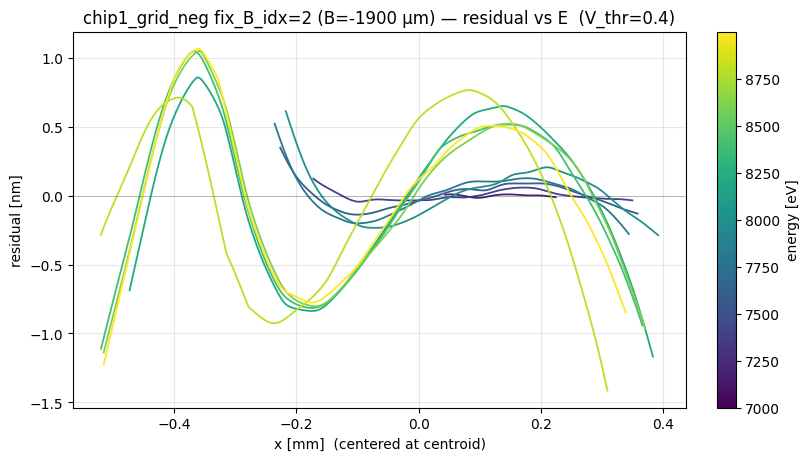

In [77]:
# Residuals at V_thr=0.4 — the default sweep. 7000 eV is fail (no fit_mask),
# so it won't appear here.
fig, ax = plt.subplots(figsize=(8, 4.5), constrained_layout=True)
sm = plot_residual_overlay(ax, results, param, flags, cmap='viridis')
fig.colorbar(sm, ax=ax, label=label)
ax.set_title('chip1_grid_neg fix_B_idx=2 (B=-1900 µm) — '
             'residual vs E  (V_thr=0.4)')
plt.show()

[chip1_grid_neg] 11 frames @ V_thr=0.1, propagate=False  →  11 ok, 0 suspect, 0 fail


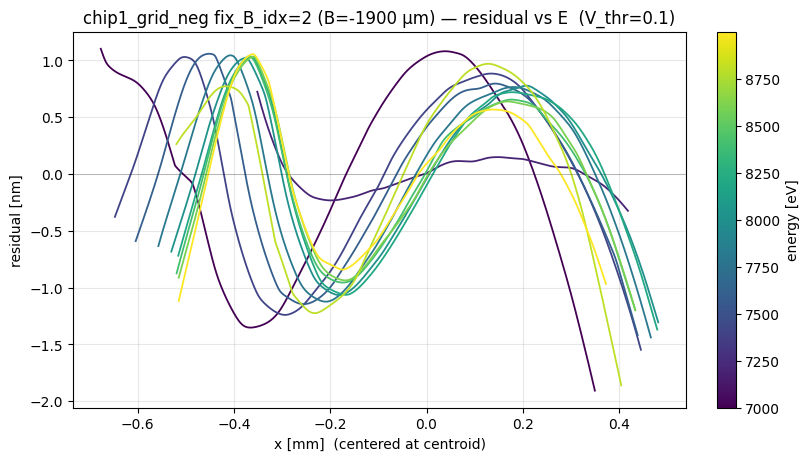

In [78]:
# Residuals at V_thr=0.1 — pushes the trust region wide. 7000 eV should
# now contribute a residual trace. The diagnostic: does the 7000 eV
# residual sit at comparable amplitude to E=7200..7600, or does it blow
# up at the wings where V was below ~0.1?
#
# Expected from 3.2.9: the 7000 eV W(x) followed the parabolic shape, so
# residuals should be order ~0.1–0.3 nm — not order 1 nm.

results_01, param_01, label_01, flags_01 = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.1, propagate=False,
)

fig, ax = plt.subplots(figsize=(8, 4.5), constrained_layout=True)
sm = plot_residual_overlay(ax, results_01, param_01, flags_01, cmap='viridis')
fig.colorbar(sm, ax=ax, label=label_01)
ax.set_title('chip1_grid_neg fix_B_idx=2 (B=-1900 µm) — '
             'residual vs E  (V_thr=0.1)')
plt.show()

In [105]:
def plot_residual_overlay(ax, results, param, flags, cmap='magma',
                          x_axis='centered',
                          vmin=None, vmax=None,
                          lw_ok=1.3, lw_suspect=1.0,
                          alpha_ok=1.0, alpha_suspect=0.7):
    """Overlay residual W − parabolic_fit for many frames on a single axis.

    Residual values are invariant under choice of x-origin (§3.4: piston
    and tilt absorbed by the parabolic fit), but the x-axis label they're
    plotted against is not. Use x_axis='raw' to plot vs raw detector
    position (origin = left edge of ROI) — detector-locked features then
    align across frames; beam-locked features shift with centroid.
    """
    if x_axis not in ('centered', 'raw'):
        raise ValueError("x_axis must be 'centered' or 'raw'")

    cmap_obj = plt.get_cmap(cmap)
    norm = Normalize(
        vmin=float(np.nanmin(param)) if vmin is None else vmin,
        vmax=float(np.nanmax(param)) if vmax is None else vmax,
    )

    for r, p, f in zip(results, param, flags):
        if f == 'fail':
            continue
        c   = cmap_obj(norm(p))
        if x_axis == 'centered':
            x = r['x_mm']
        else:
            x = r['x_mm'] + r['x_c'] * r['dx'] * 1e3   # shift back to raw
        fm  = r['fit_mask']
        resid_nm = r['W_resid_rad'] * r['wavelength'] / (2 * np.pi) * 1e9
        ls, lw, alpha = (('-',  lw_ok,      alpha_ok) if f == 'ok' else
                         (':',  lw_suspect, alpha_suspect))
        ax.plot(x, np.where(fm, resid_nm, np.nan),
                color=c, ls=ls, lw=lw, alpha=alpha)

    xlabel = ('x [mm]  (centered at centroid)' if x_axis == 'centered'
              else 'x [mm]  (raw detector position)')
    ax.set_xlabel(xlabel)
    ax.set_ylabel('residual [nm]')
    ax.grid(alpha=0.3)
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_obj, norm=norm)
    sm.set_array([])
    return sm

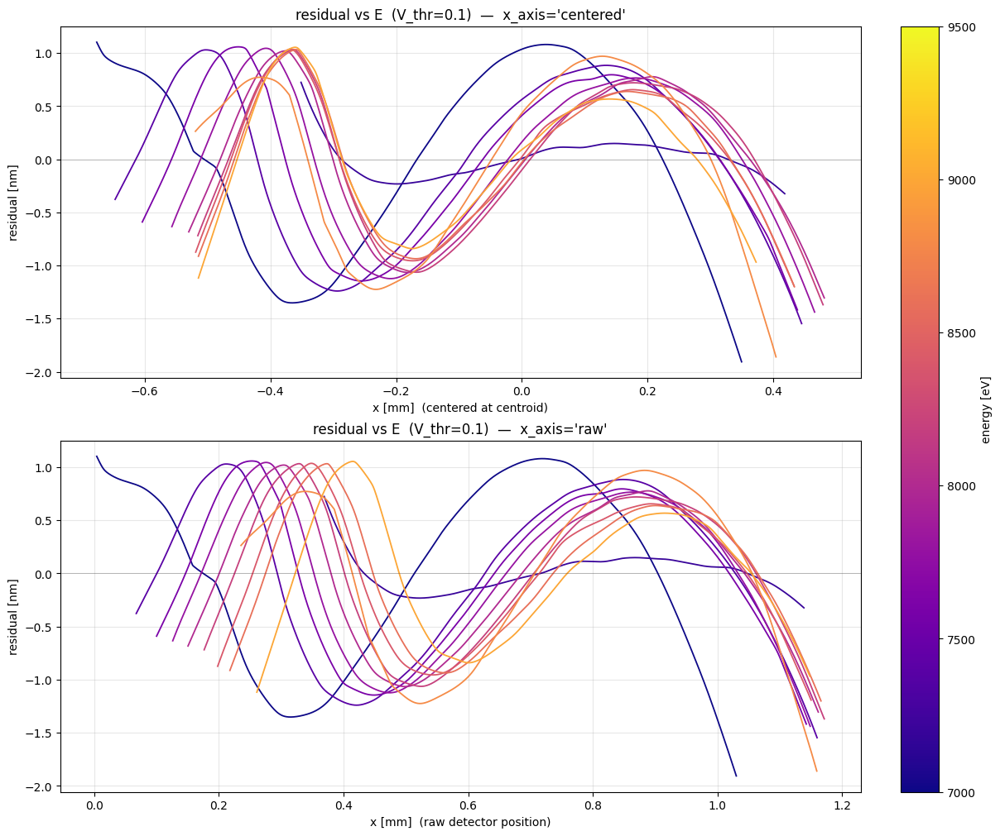

In [108]:
# Test detector- vs beam-locked hypothesis: re-plot residuals on raw x.
# If features align across frames, they're detector-locked (likely a real
# beam-line aberration fixed in detector position). If they keep shifting,
# the centroid drift wasn't the cause and we're seeing real chromatic
# behavior.

fig, axes = plt.subplots(2, 1, figsize=(12, 10), constrained_layout=True,
                         sharey=True)
for ax, axis_choice in zip(axes, ['centered', 'raw']):
    sm = plot_residual_overlay(ax, results_01, param_01, flags_01, vmax=9500,
                                cmap='plasma', x_axis=axis_choice)
    ax.set_title(f"residual vs E  (V_thr=0.1)  —  x_axis='{axis_choice}'")
fig.colorbar(sm, ax=axes, label=label_01)
plt.show()

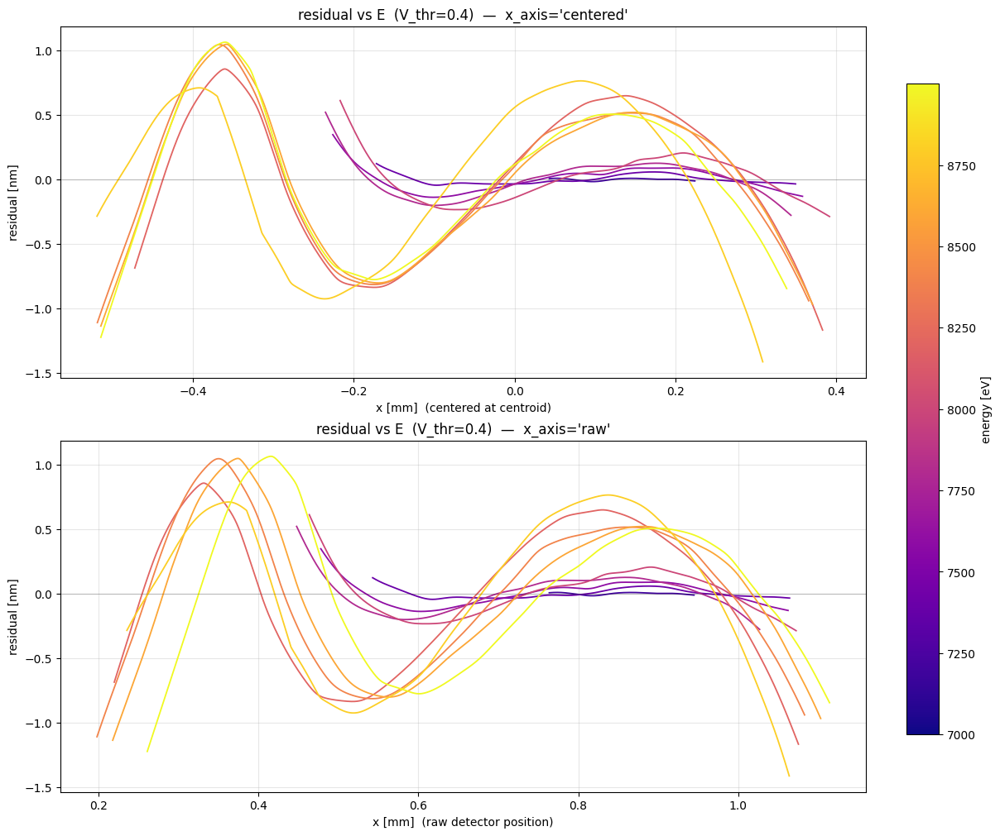

In [96]:
# Test detector- vs beam-locked hypothesis: re-plot residuals on raw x.
# If features align across frames, they're detector-locked (likely a real
# beam-line aberration fixed in detector position). If they keep shifting,
# the centroid drift wasn't the cause and we're seeing real chromatic
# behavior.

fig, axes = plt.subplots(2, 1, figsize=(12, 10), constrained_layout=True,
                         sharey=True)
for ax, axis_choice in zip(axes, ['centered', 'raw']):
    sm = plot_residual_overlay(ax, results, param, flags,
                                cmap='plasma', x_axis=axis_choice)
    ax.set_title(f"residual vs E  (V_thr=0.4)  —  x_axis='{axis_choice}'")
fig.colorbar(sm, ax=axes, label=label_01, shrink=0.85)
plt.show()

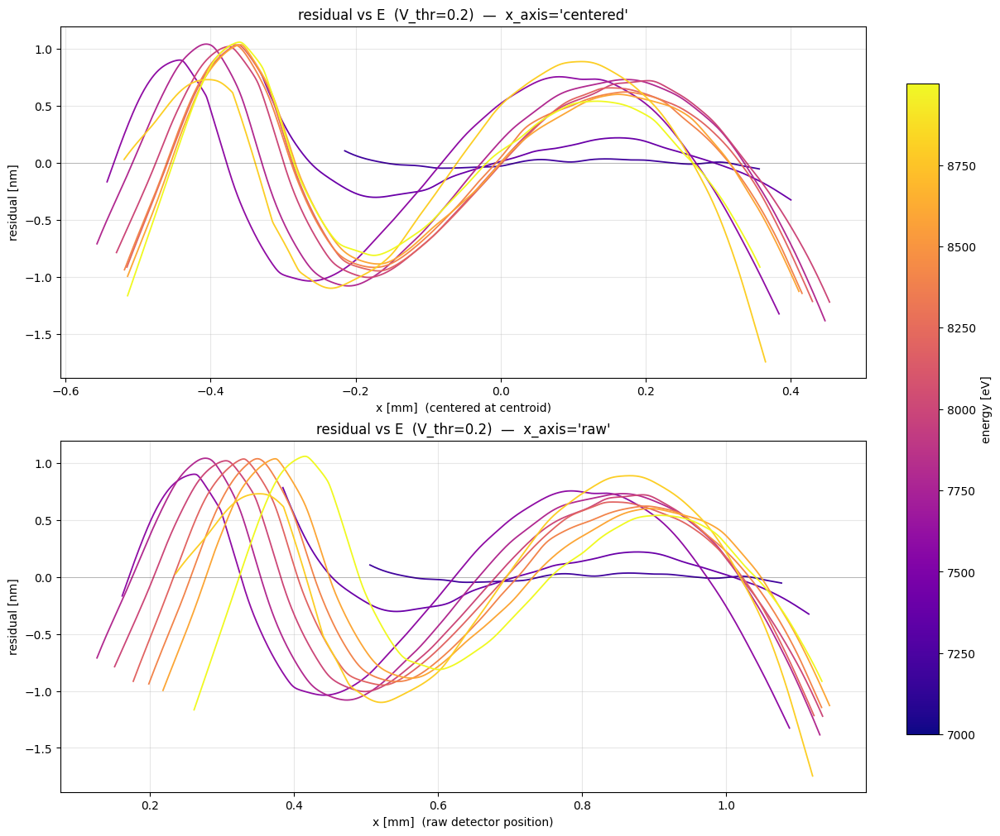

In [104]:
# Test detector- vs beam-locked hypothesis: re-plot residuals on raw x.
# If features align across frames, they're detector-locked (likely a real
# beam-line aberration fixed in detector position). If they keep shifting,
# the centroid drift wasn't the cause and we're seeing real chromatic
# behavior.

fig, axes = plt.subplots(2, 1, figsize=(12, 10), constrained_layout=True,
                         sharey=True)
for ax, axis_choice in zip(axes, ['centered', 'raw']):
    sm = plot_residual_overlay(ax, results_02, param_02, flags_02,
                                cmap='plasma', x_axis=axis_choice)
    ax.set_title(f"residual vs E  (V_thr=0.2)  —  x_axis='{axis_choice}'")
fig.colorbar(sm, ax=axes, label=label_02, shrink=0.85)
plt.show()

[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail


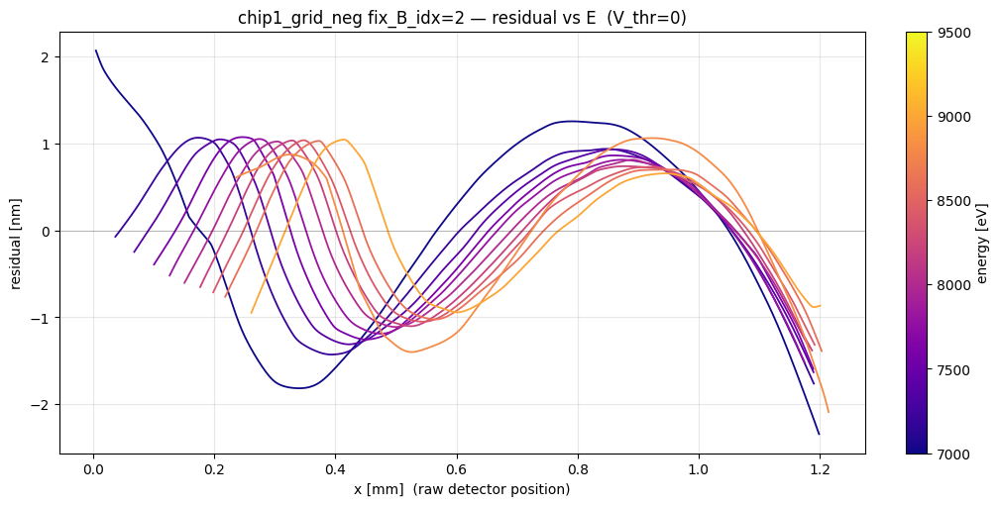

In [110]:
# V_thr=0 disables V-gating entirely: trust_mask = beam_mask, fit_mask =
# beam_mask. Now the only thing limiting the fit is beam extent.
results_00, param_00, label_00, flags_00 = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.0, propagate=False,
)

fig, ax = plt.subplots(figsize=(10, 5), constrained_layout=True)
sm = plot_residual_overlay(ax, results_00, param_00, flags_00,
                           cmap='plasma', x_axis='raw', vmax=9500)
fig.colorbar(sm, ax=ax, label=label_00)
ax.set_title('chip1_grid_neg fix_B_idx=2 — residual vs E  (V_thr=0)')
plt.show()

     E    r_DC     SNR  V_max[bm]  n_mask  n_fit01  k_peak/k_id  f_pred[m]  rms[nm]
------------------------------------------------------------------------------------------------
  7000   106.2    53.2      0.185    2490     2138       0.9454     -4.321    0.856
  7200    96.3    95.8      0.536    2405     1604       0.9454     -5.473    0.170
  7400   100.3   110.4      0.892    2339     2276       0.9454     -4.629    0.748
  7600   113.3   106.1      1.000    2270     2172       0.9454     -4.552    0.701
  7800   135.4    76.5      1.000    2187     2131       0.9404     -4.499    0.685
  8000   166.2    54.6      1.000    2150     2107       0.9404     -4.492    0.654
  8200   185.1    49.8      1.000    2107     2073       0.9404     -4.461    0.661
  8400   219.6    42.2      1.000    2071     1984       0.9404     -4.402    0.607
  8600   264.1    27.5      1.000    2054     1976       0.9404     -4.366    0.601
  8800   273.0    24.7      1.000    2041     1925       0.9404

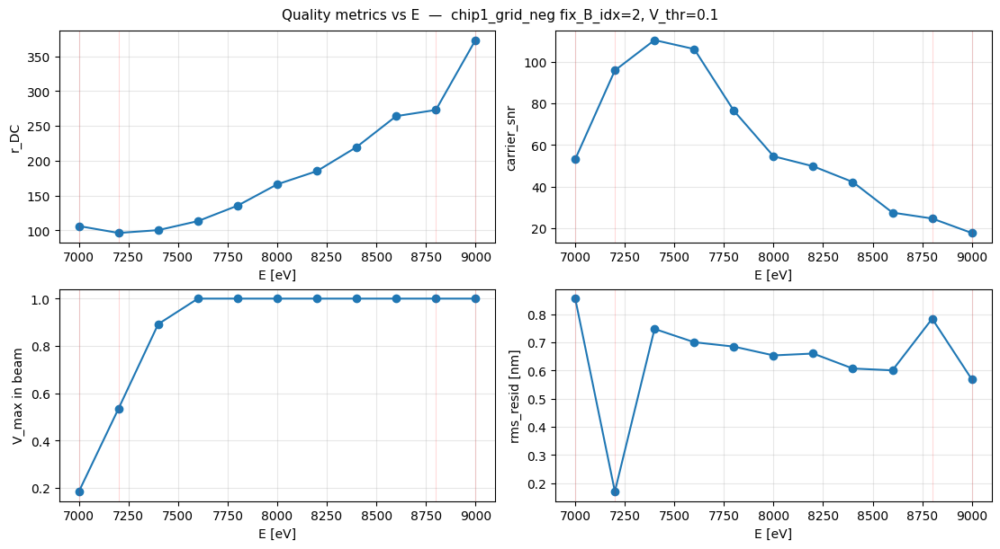

In [111]:
# Pull r_DC, SNR, V_max[bm], and reconstruction stats across the E line
# from the V_thr=0.1 sweep (most permissive — gives us every frame's
# metrics). r_DC and SNR are V_thr-independent so the choice doesn't
# matter for those; V_max and n_fit_px depend on the beam_mask
# definition, which is V_thr-independent too.

print(f"{'E':>6} {'r_DC':>7} {'SNR':>7} "
      f"{'V_max[bm]':>10} {'n_mask':>7} {'n_fit01':>8} "
      f"{'k_peak/k_id':>12} "
      f"{'f_pred[m]':>10} {'rms[nm]':>8}")
print('-' * 96)
for r, p in zip(results_01, param_01):
    bm = r['beam_mask']
    V_max_bm = r['V'][bm].max() if bm.any() else np.nan
    print(f"{p:>6.0f} "
          f"{r['dc_carrier_ratio']:>7.1f} "
          f"{r['carrier_snr']:>7.1f} "
          f"{V_max_bm:>10.3f} "
          f"{r['n_mask_px']:>7d} "
          f"{r['n_fit_px']:>8d} "
          f"{r['k_peak']/r['k_ideal']:>12.4f} "
          f"{r['f_pred']:>+10.3f} "
          f"{r['rms_resid_nm']:>8.3f}")

# Visual: r_DC, SNR, V_max[bm], rms_resid vs E
fig, axes = plt.subplots(2, 2, figsize=(11, 6), constrained_layout=True)
metrics = [
    ('dc_carrier_ratio',  'r_DC',          axes[0, 0]),
    ('carrier_snr',       'carrier_snr',   axes[0, 1]),
    ('V_max_bm',          'V_max in beam', axes[1, 0]),
    ('rms_resid_nm',      'rms_resid [nm]',axes[1, 1]),
]
for keyname, ylabel, ax in metrics:
    if keyname == 'V_max_bm':
        vals = [r['V'][r['beam_mask']].max() if r['beam_mask'].any() else np.nan
                for r in results_01]
    else:
        vals = [r[keyname] for r in results_01]
    ax.plot(param_01, vals, 'o-', color='C0')
    ax.set_xlabel('E [eV]')
    ax.set_ylabel(ylabel)
    ax.grid(alpha=0.3)
    # Highlight the suspect frames you flagged: 7000, 7200, 8800, 9000
    for E_susp in (7000, 7200, 8800, 9000):
        ax.axvline(E_susp, color='red', alpha=0.15, lw=0.8)
fig.suptitle('Quality metrics vs E  —  chip1_grid_neg fix_B_idx=2, V_thr=0.1',
             fontsize=11)
plt.show()

     E    r_DC     SNR  V_max[bm]  n_mask  n_fit01  k_peak/k_id  f_pred[m]  rms[nm]
------------------------------------------------------------------------------------------------
  7000   106.2    53.2      0.185    2490     2490       0.9454     -4.637    1.126
  7200    96.3    95.8      0.536    2405     2405       0.9454     -4.728    0.833
  7400   100.3   110.4      0.892    2339     2339       0.9454     -4.675    0.783
  7600   113.3   106.1      1.000    2270     2270       0.9454     -4.626    0.753
  7800   135.4    76.5      1.000    2187     2187       0.9404     -4.543    0.717
  8000   166.2    54.6      1.000    2150     2150       0.9404     -4.523    0.674
  8200   185.1    49.8      1.000    2107     2107       0.9404     -4.488    0.678
  8400   219.6    42.2      1.000    2071     2071       0.9404     -4.470    0.649
  8600   264.1    27.5      1.000    2054     2054       0.9404     -4.428    0.641
  8800   273.0    24.7      1.000    2041     2041       0.9404

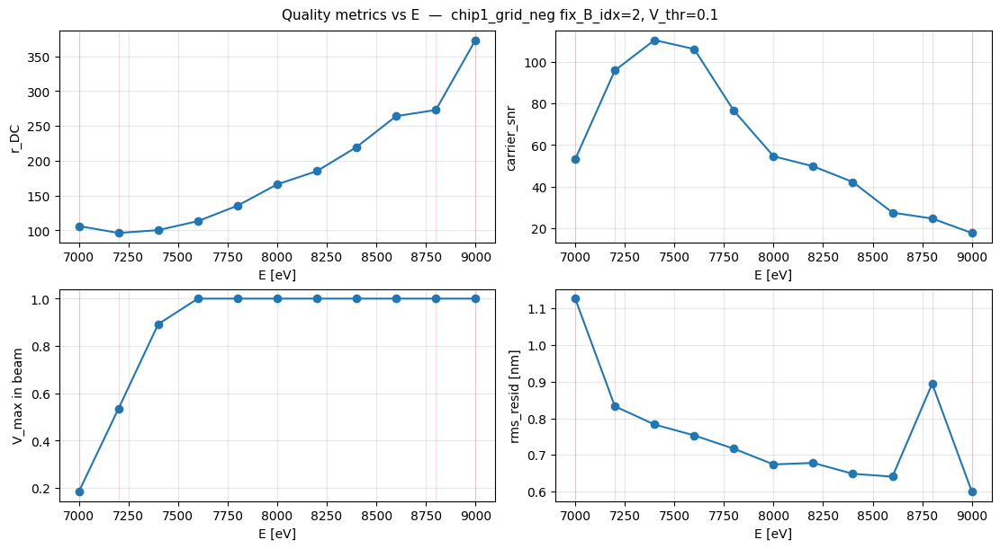

In [112]:
# Pull r_DC, SNR, V_max[bm], and reconstruction stats across the E line
# from the V_thr=0.1 sweep (most permissive — gives us every frame's
# metrics). r_DC and SNR are V_thr-independent so the choice doesn't
# matter for those; V_max and n_fit_px depend on the beam_mask
# definition, which is V_thr-independent too.

print(f"{'E':>6} {'r_DC':>7} {'SNR':>7} "
      f"{'V_max[bm]':>10} {'n_mask':>7} {'n_fit01':>8} "
      f"{'k_peak/k_id':>12} "
      f"{'f_pred[m]':>10} {'rms[nm]':>8}")
print('-' * 96)
for r, p in zip(results_00, param_00):
    bm = r['beam_mask']
    V_max_bm = r['V'][bm].max() if bm.any() else np.nan
    print(f"{p:>6.0f} "
          f"{r['dc_carrier_ratio']:>7.1f} "
          f"{r['carrier_snr']:>7.1f} "
          f"{V_max_bm:>10.3f} "
          f"{r['n_mask_px']:>7d} "
          f"{r['n_fit_px']:>8d} "
          f"{r['k_peak']/r['k_ideal']:>12.4f} "
          f"{r['f_pred']:>+10.3f} "
          f"{r['rms_resid_nm']:>8.3f}")

# Visual: r_DC, SNR, V_max[bm], rms_resid vs E
fig, axes = plt.subplots(2, 2, figsize=(11, 6), constrained_layout=True)
metrics = [
    ('dc_carrier_ratio',  'r_DC',          axes[0, 0]),
    ('carrier_snr',       'carrier_snr',   axes[0, 1]),
    ('V_max_bm',          'V_max in beam', axes[1, 0]),
    ('rms_resid_nm',      'rms_resid [nm]',axes[1, 1]),
]
for keyname, ylabel, ax in metrics:
    if keyname == 'V_max_bm':
        vals = [r['V'][r['beam_mask']].max() if r['beam_mask'].any() else np.nan
                for r in results_00]
    else:
        vals = [r[keyname] for r in results_00]
    ax.plot(param_00, vals, 'o-', color='C0')
    ax.set_xlabel('E [eV]')
    ax.set_ylabel(ylabel)
    ax.grid(alpha=0.3)
    # Highlight the suspect frames you flagged: 7000, 7200, 8800, 9000
    for E_susp in (7000, 7200, 8800, 9000):
        ax.axvline(E_susp, color='red', alpha=0.15, lw=0.8)
fig.suptitle('Quality metrics vs E  —  chip1_grid_neg fix_B_idx=2, V_thr=0.1',
             fontsize=11)
plt.show()

In [135]:
# Replace V_max with V_mean / V_median / V25 (lower quartile) over beam_mask.
# V25 captures "how bad is the worse half of the beam" — a stricter
# version of median.

print(f"{'E':>6} {'r_DC':>7} {'SNR':>7} "
      f"{'V_max':>7} {'V_mean':>7} {'V_med':>7} {'V25':>7} "
      f"{'n_mask':>7} {'f_pred':>10} {'rms[nm]':>8}")
print('-' * 92)
for r, p in zip(results_00, param_00):
    bm = r['beam_mask']
    V_in = r['V'][bm]
    print(f"{p:>6.0f} "
          f"{r['dc_carrier_ratio']:>7.1f} {r['carrier_snr']:>7.1f} "
          f"{V_in.max():>7.3f} {V_in.mean():>7.3f} "
          f"{np.median(V_in):>7.3f} {np.percentile(V_in, 25):>7.3f} "
          f"{r['n_mask_px']:>7d} "
          f"{r['f_pred']:>+10.3f} {r['rms_resid_nm']:>8.3f}")

     E    r_DC     SNR   V_max  V_mean   V_med     V25  n_mask     f_pred  rms[nm]
--------------------------------------------------------------------------------------------
  7000   106.2    53.2   0.185   0.075   0.072   0.031    2490     -4.637    1.126
  7200    96.3    95.8   0.536   0.200   0.189   0.061    2405     -4.728    0.833
  7400   100.3   110.4   0.892   0.403   0.356   0.153    2339     -4.675    0.783
  7600   113.3   106.1   1.000   0.440   0.456   0.150    2270     -4.626    0.753
  7800   135.4    76.5   1.000   0.462   0.393   0.204    2187     -4.543    0.717
  8000   166.2    54.6   1.000   0.470   0.460   0.239    2150     -4.523    0.674
  8200   185.1    49.8   1.000   0.490   0.453   0.245    2107     -4.488    0.678
  8400   219.6    42.2   1.000   0.506   0.492   0.268    2071     -4.470    0.649
  8600   264.1    27.5   1.000   0.451   0.413   0.224    2054     -4.428    0.641
  8800   273.0    24.7   1.000   0.431   0.416   0.161    2041     -4.071    

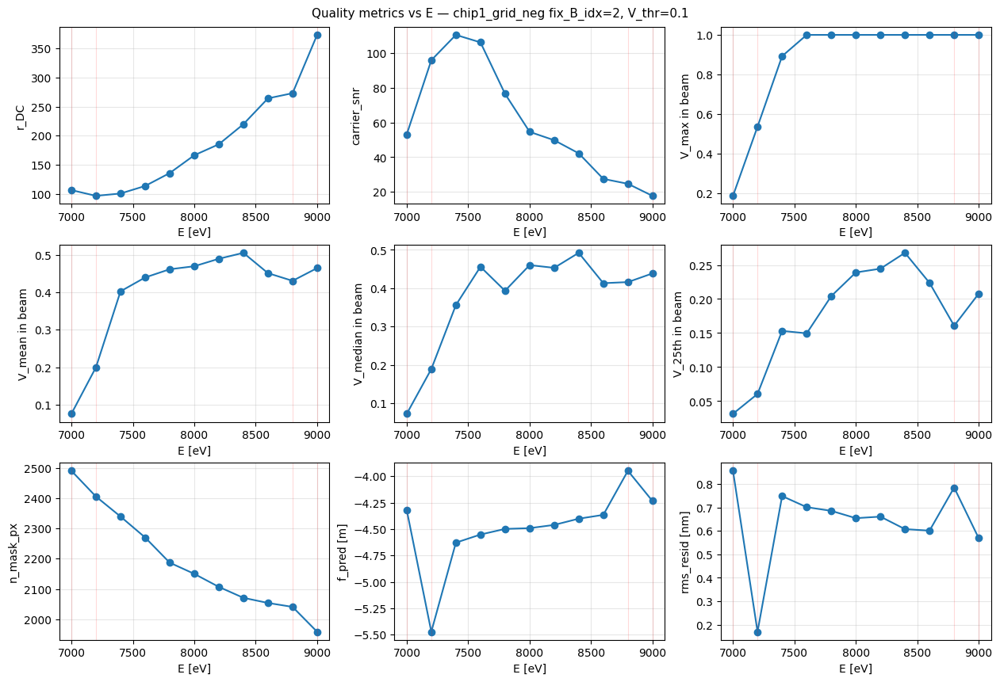

In [136]:
# Same recipe as the earlier 2x2, expanded to all relevant metrics.
metrics = [
    ('dc_carrier_ratio',  'r_DC'),
    ('carrier_snr',       'carrier_snr'),
    ('V_max',             'V_max in beam'),
    ('V_mean',            'V_mean in beam'),
    ('V_med',             'V_median in beam'),
    ('V25',               'V_25th in beam'),
    ('n_mask_px',         'n_mask_px'),
    ('f_pred',            'f_pred [m]'),
    ('rms_resid_nm',      'rms_resid [nm]'),
]
fig, axes = plt.subplots(3, 3, figsize=(12.5, 8.5), constrained_layout=True)
for (key, ylabel), ax in zip(metrics, axes.flat):
    if key == 'V_max':
        vals = [r['V'][r['beam_mask']].max() if r['beam_mask'].any() else np.nan
                for r in results_01]
    elif key == 'V_mean':
        vals = [r['V'][r['beam_mask']].mean() if r['beam_mask'].any() else np.nan
                for r in results_01]
    elif key == 'V_med':
        vals = [np.median(r['V'][r['beam_mask']]) if r['beam_mask'].any() else np.nan
                for r in results_01]
    elif key == 'V25':
        vals = [np.percentile(r['V'][r['beam_mask']], 25)
                if r['beam_mask'].any() else np.nan for r in results_01]
    else:
        vals = [r[key] for r in results_01]
    ax.plot(param_01, vals, 'o-', color='C0')
    ax.set_xlabel('E [eV]')
    ax.set_ylabel(ylabel)
    ax.grid(alpha=0.3)
    for E_susp in (7000, 7200, 8800, 9000):
        ax.axvline(E_susp, color='red', alpha=0.15, lw=0.8)
fig.suptitle('Quality metrics vs E — chip1_grid_neg fix_B_idx=2, V_thr=0.1',
             fontsize=11)
plt.show()

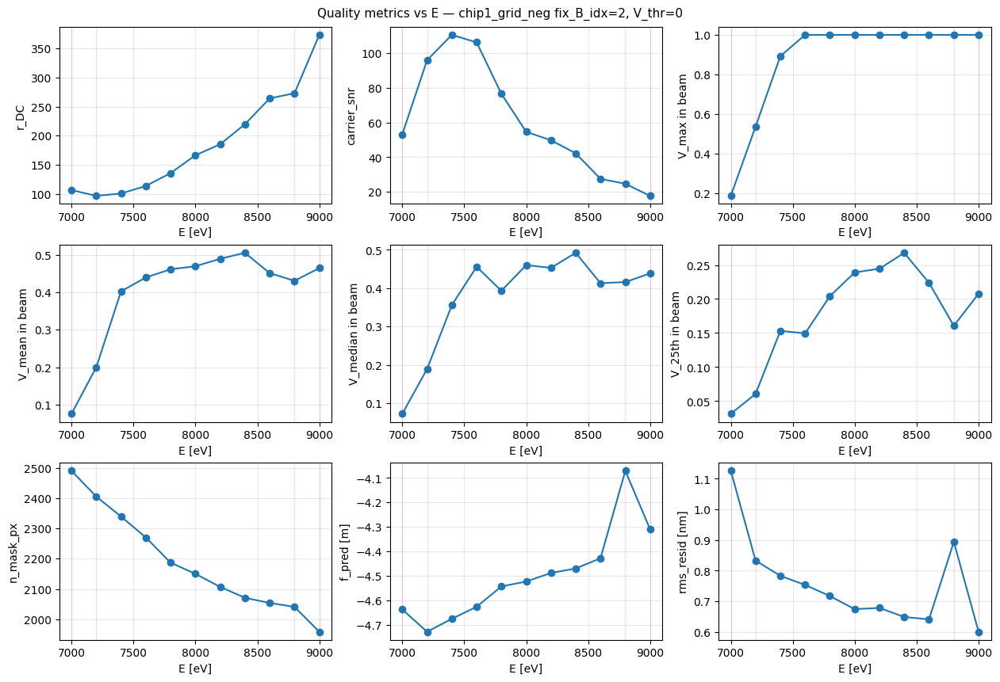

In [138]:
# Same recipe as the earlier 2x2, expanded to all relevant metrics.
metrics = [
    ('dc_carrier_ratio',  'r_DC'),
    ('carrier_snr',       'carrier_snr'),
    ('V_max',             'V_max in beam'),
    ('V_mean',            'V_mean in beam'),
    ('V_med',             'V_median in beam'),
    ('V25',               'V_25th in beam'),
    ('n_mask_px',         'n_mask_px'),
    ('f_pred',            'f_pred [m]'),
    ('rms_resid_nm',      'rms_resid [nm]'),
]
fig, axes = plt.subplots(3, 3, figsize=(12.5, 8.5), constrained_layout=True)
for (key, ylabel), ax in zip(metrics, axes.flat):
    if key == 'V_max':
        vals = [r['V'][r['beam_mask']].max() if r['beam_mask'].any() else np.nan
                for r in results_00]
    elif key == 'V_mean':
        vals = [r['V'][r['beam_mask']].mean() if r['beam_mask'].any() else np.nan
                for r in results_00]
    elif key == 'V_med':
        vals = [np.median(r['V'][r['beam_mask']]) if r['beam_mask'].any() else np.nan
                for r in results_00]
    elif key == 'V25':
        vals = [np.percentile(r['V'][r['beam_mask']], 25)
                if r['beam_mask'].any() else np.nan for r in results_00]
    else:
        vals = [r[key] for r in results_00]
    ax.plot(param_00, vals, 'o-', color='C0')
    ax.set_xlabel('E [eV]')
    ax.set_ylabel(ylabel)
    ax.grid(alpha=0.3)
    for E_susp in (7000, 7200, 8800, 9000):
        ax.axvline(E_susp, color='red', alpha=0.15, lw=0.8)
fig.suptitle('Quality metrics vs E — chip1_grid_neg fix_B_idx=2, V_thr=0',
             fontsize=11)
plt.show()

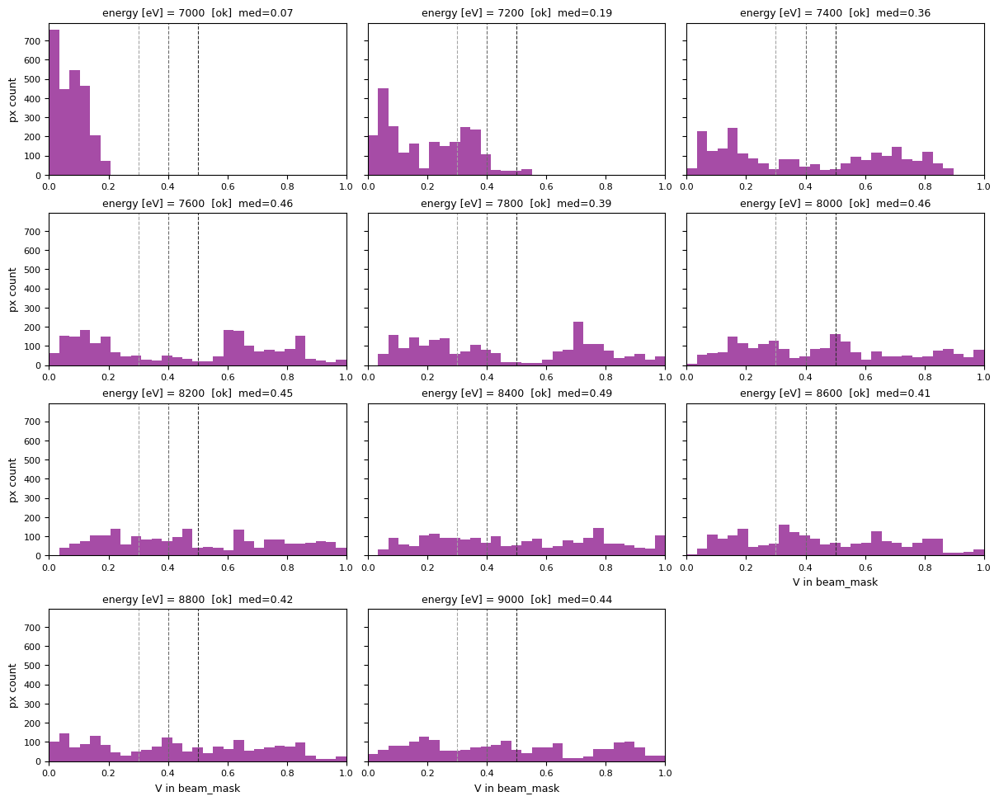

In [115]:
# V histograms per frame, small multiples. If we see a bimodal split
# (clean frames: V centered around 0.7+; bad frames: V centered near 0.1)
# we have a clean threshold.

n = len(results_01)
fig, axes, nrows = _grid_layout(n, ncols=3, sharey=True)
for i, (r, p, f) in enumerate(zip(results_01, param_01, flags_01)):
    ax = axes.flat[i]
    V_in = r['V'][r['beam_mask']]
    ax.hist(V_in, bins=np.linspace(0, 1, 30), color='purple', alpha=0.7)
    for t, c in zip([0.3, 0.4, 0.5], plt.cm.Greys([0.45, 0.65, 0.85])):
        ax.axvline(t, color=c, ls='--', lw=0.8)
    ax.set_xlim(0, 1)
    ax.set_title(f"{label_01} = {p:.0f}  [{f}]  "
                 f"med={np.median(V_in):.2f}",
                 color=_FLAG_COLOR[f], fontsize=9)
    ax.tick_params(labelsize=8)
    row, col = divmod(i, 3)
    if (row == nrows - 1) or (i + 3 >= n):
        ax.set_xlabel('V in beam_mask', fontsize=9)
    if col == 0:
        ax.set_ylabel('px count', fontsize=9)
plt.show()

In [126]:
from matplotlib.colors import LinearSegmentedColormap

def truncate_cmap(name, low=0.0, high=0.85, n=256):
    """Slice a colormap to its [low, high] sub-range to avoid bright extremes."""
    cmap = plt.get_cmap(name)
    return LinearSegmentedColormap.from_list(
        f'{name}_t', cmap(np.linspace(low, high, n))
    )

PLASMA_DARK = truncate_cmap('plasma', high=0.92)   # define once, reuse

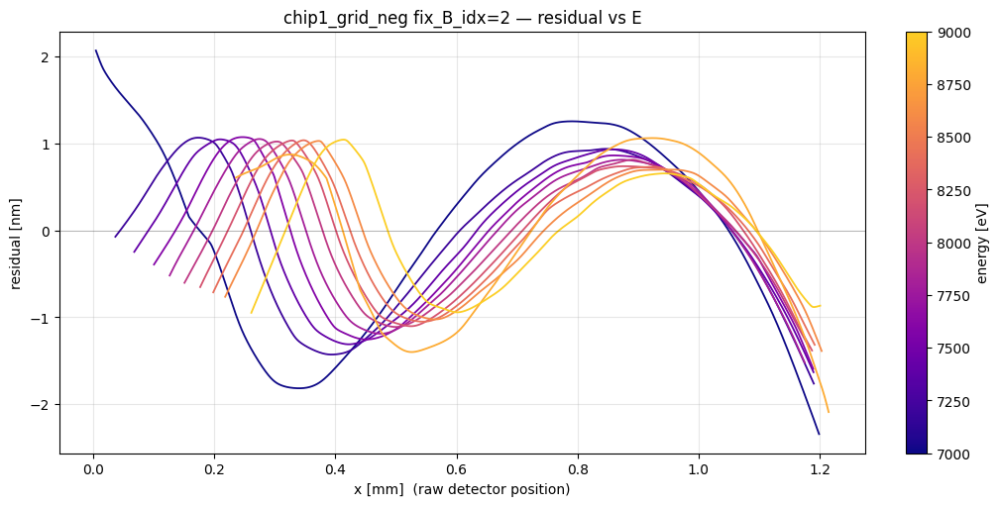

In [154]:
PLASMA_DARK = truncate_cmap('plasma', high=0.9)   # define once, reuse

fig, ax = plt.subplots(figsize=(10, 5), constrained_layout=True)
sm = plot_residual_overlay(ax, results_00, param_00, flags_00,
                           cmap=PLASMA_DARK, x_axis='raw',
                           vmin=7000, vmax=9000)
fig.colorbar(sm, ax=ax, label=label_00)
ax.set_title('chip1_grid_neg fix_B_idx=2 — residual vs E')
plt.show()

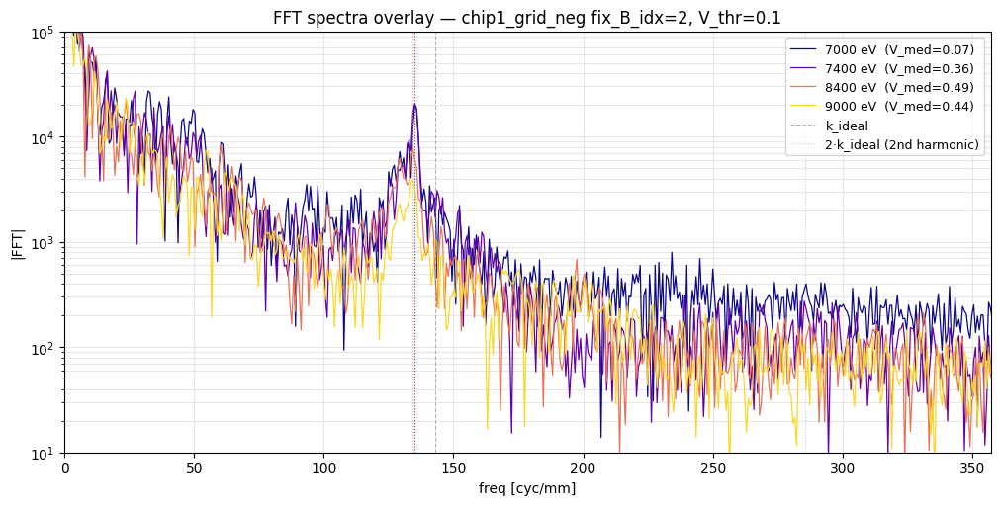

In [134]:
# Compare FFT shapes for low-V vs high-V frames. Test the hypothesis:
# does 7000 eV's carrier peak look "normal" (sharp, well-isolated) despite
# garbage per-pixel V? If yes, that confirms the granularity-mismatch
# story.

E_sel  = [7000, 7400, 8400, 9000]
idx_sel = [int(np.argmin(np.abs(param_01 - E))) for E in E_sel]

fig, ax = plt.subplots(figsize=(10, 5), constrained_layout=True)
norm = Normalize(vmin=7000, vmax=9000)
k_ideal_mm = results_01[0]['k_ideal'] * 1e-3   # same for all frames

for i in idx_sel:
    r = results_01[i]
    E = param_01[i]
    c = PLASMA_DARK(norm(E))
    V_med = np.median(r['V'][r['beam_mask']])
    ax.semilogy(r['freq'] * 1e-3, np.abs(r['fft_avg']),
                color=c, lw=0.9,
                label=f'{E:.0f} eV  (V_med={V_med:.2f})')
    # Mark per-frame k_peak (small markers near top of frame)
    ax.axvline(r['k_peak'] * 1e-3, color=c, ls=':', alpha=0.5, lw=0.8)

ax.axvline(k_ideal_mm, color='gray', ls='--', alpha=0.6, lw=0.8,
           label='k_ideal')
ax.axvline(2 * k_ideal_mm, color='gray', ls=':', alpha=0.4, lw=0.8,
           label='2·k_ideal (2nd harmonic)')
ax.set_xlim(0, 2.5 * k_ideal_mm)
# ax.set_xlim(50, 250)
ax.set_ylim(1e1, 1e5)
ax.set_xlabel('freq [cyc/mm]')
ax.set_ylabel('|FFT|')
ax.legend(fontsize=9, loc='upper right')
ax.grid(alpha=0.3, which='both')
ax.set_title('FFT spectra overlay — chip1_grid_neg fix_B_idx=2, V_thr=0.1')
plt.show()

In [139]:
def plot_scalar_vs_param(ax, results, param, flags, key, cmap='magma',
                         vmin=None, vmax=None,
                         ms_ok=8, ms_suspect=8, lw_connect=1.0):
    """Scatter one scalar field per frame against param, with connecting line.

    key is a string field name on the result dict (e.g. 'f_pred', 'z_focus',
    'rms_resid_nm', 'n_fit_px', 'carrier_snr', 'dc_carrier_ratio'), OR a
    callable f(r) → scalar for derived quantities (e.g. lambda r:
    np.percentile(r['V'][r['beam_mask']], 25) for V25).

    Marker styles:
      - ok      : filled, color = cmap(param)
      - suspect : hollow (white fill, colored edge)
      - fail    : skipped (line breaks at the gap, NaN-driven)

    Connecting line drawn first (gray, low alpha), markers on top.
    """
    cmap_obj = plt.get_cmap(cmap)
    norm = Normalize(
        vmin=float(np.nanmin(param)) if vmin is None else vmin,
        vmax=float(np.nanmax(param)) if vmax is None else vmax,
    )

    def _val(r):
        if callable(key):
            return key(r)
        return r[key]

    # Connecting line: NaN out fails so the line breaks visibly.
    line_vals = np.array([_val(r) if f != 'fail' else np.nan
                          for r, f in zip(results, flags)],
                         dtype=float)
    ax.plot(param, line_vals, '-', color='gray', alpha=0.4, lw=lw_connect,
            zorder=0)

    # Markers
    for r, p, f in zip(results, param, flags):
        if f == 'fail':
            continue
        v = _val(r)
        c = cmap_obj(norm(p))
        if f == 'ok':
            ax.plot(p, v, 'o', color=c, mfc=c, mec=c, ms=ms_ok)
        else:
            ax.plot(p, v, 'o', mfc='white', mec=c, ms=ms_suspect, mew=1.4)

    ax.grid(alpha=0.3)
    sm = plt.cm.ScalarMappable(cmap=cmap_obj, norm=norm)
    sm.set_array([])
    return sm

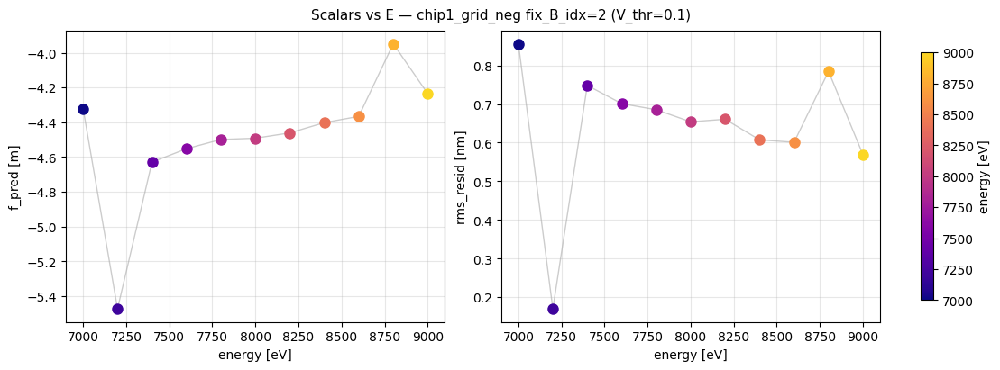

In [ ]:
# Test on the same V_thr=0.1 sweep. Three scalars: f_pred, z_focus, V25.
# V25 demonstrates the callable-key path.

V25_fn = lambda r: (np.percentile(r['V'][r['beam_mask']], 25)
                    if r['beam_mask'].any() else np.nan)

fig, axes = plt.subplots(1, 3, figsize=(13, 3.8), constrained_layout=True)
sm = None
for ax, key, ylabel in [
    (axes[0], 'f_pred',       'f_pred [m]'),
    (axes[1], 'z_focus',      'z_focus [m]'),
    (axes[2], V25_fn,         'V25 in beam'),
]:
    sm = plot_scalar_vs_param(ax, results_01, param_01, flags_01,
                              key=key, cmap=PLASMA_DARK,
                              vmin=7000, vmax=9000)
    ax.set_xlabel(label_01)
    ax.set_ylabel(ylabel)
fig.colorbar(sm, ax=axes, label=label_01, shrink=0.85)
fig.suptitle('Scalars vs E — chip1_grid_neg fix_B_idx=2 (V_thr=0.1)',
             fontsize=11)
plt.show()

In [142]:
# Re-sweep at V_thr=0 with propagate=True so z_focus is available.
# V_thr=0 is the new default per the V investigation above.
results_p, param_p, label_p, flags_p = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.0, propagate=True,
)

[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=True  →  11 ok, 0 suspect, 0 fail


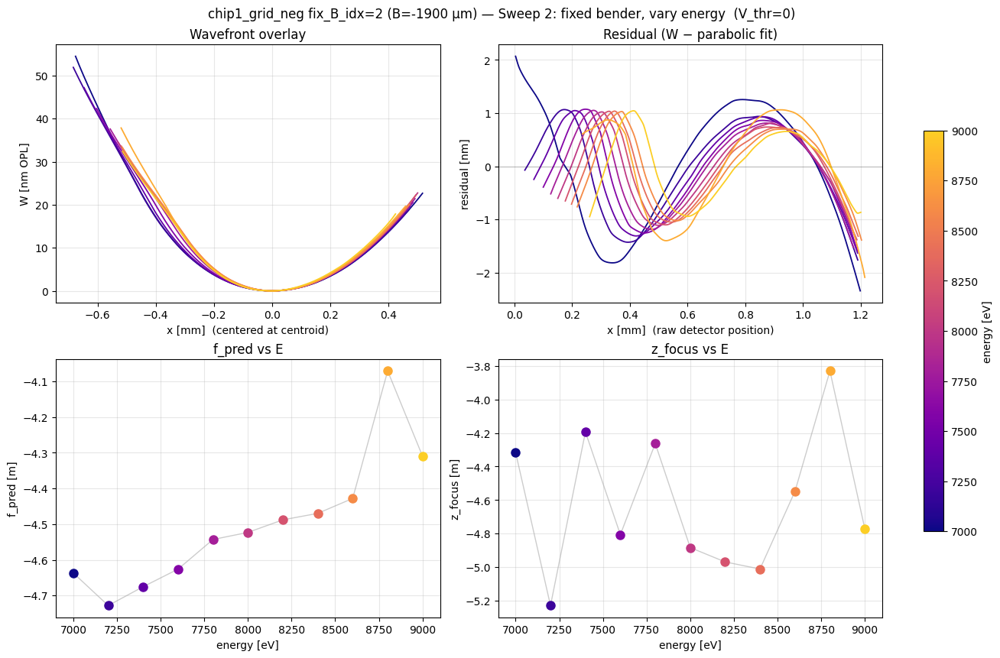

In [146]:
PLASMA_DARK = truncate_cmap('plasma', high=0.9)   # define once, reuse

# Sweep 2 reproduction: W overlay | residual overlay (top), f_pred | z_focus
# (bottom). Single shared colorbar on the right.

fig, ax = plt.subplots(2, 2, figsize=(13, 8.5), constrained_layout=True)

plot_wavefront_overlay(ax[0, 0], results_p, param_p, flags_p,
                       cmap=PLASMA_DARK, vmin=7000, vmax=9000)
ax[0, 0].set_title('Wavefront overlay')

plot_residual_overlay(ax[0, 1], results_p, param_p, flags_p,
                      cmap=PLASMA_DARK, x_axis='raw',
                      vmin=7000, vmax=9000)
ax[0, 1].set_title('Residual (W − parabolic fit)')

plot_scalar_vs_param(ax[1, 0], results_p, param_p, flags_p,
                     key='f_pred', cmap=PLASMA_DARK,
                     vmin=7000, vmax=9000)
ax[1, 0].set_xlabel(label_p)
ax[1, 0].set_ylabel('f_pred [m]')
ax[1, 0].set_title('f_pred vs E')

sm = plot_scalar_vs_param(ax[1, 1], results_p, param_p, flags_p,
                          key='z_focus', cmap=PLASMA_DARK,
                          vmin=7000, vmax=9000)
ax[1, 1].set_xlabel(label_p)
ax[1, 1].set_ylabel('z_focus [m]')
ax[1, 1].set_title('z_focus vs E')

fig.colorbar(sm, ax=ax, label=label_p, shrink=0.7)
fig.suptitle('chip1_grid_neg fix_B_idx=2 (B=-1900 µm) — '
             'Sweep 2: fixed bender, vary energy  (V_thr=0)',
             fontsize=12)
plt.show()

[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail


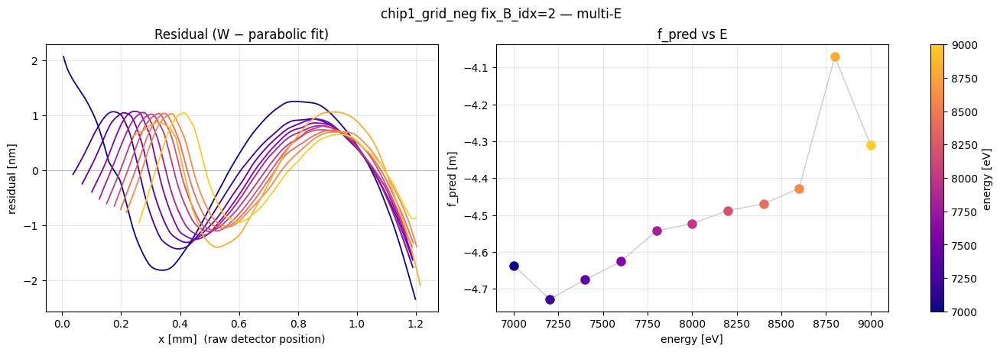

In [172]:
# Quick multi-E at B=-2000 µm.
results_e, param_e, label_e, flags_e = sweep(
    "chip1_grid_neg", fix_B_idx=2, V_threshold=0.0, propagate=False,
)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), constrained_layout=True)

plot_residual_overlay(axes[0], results_e, param_e, flags_e,
                      cmap=PLASMA_DARK, x_axis='raw',
                      vmin=7000, vmax=9000)
axes[0].set_title('Residual (W − parabolic fit)')

sm = plot_scalar_vs_param(axes[1], results_e, param_e, flags_e,
                          key='f_pred', cmap=PLASMA_DARK,
                          vmin=7000, vmax=9000)
axes[1].set_xlabel(label_e)
axes[1].set_ylabel('f_pred [m]')
axes[1].set_title('f_pred vs E')

fig.colorbar(sm, ax=axes, label=label_e)
fig.suptitle('chip1_grid_neg fix_B_idx=2 — '
             'multi-E',
             fontsize=12)
plt.show()

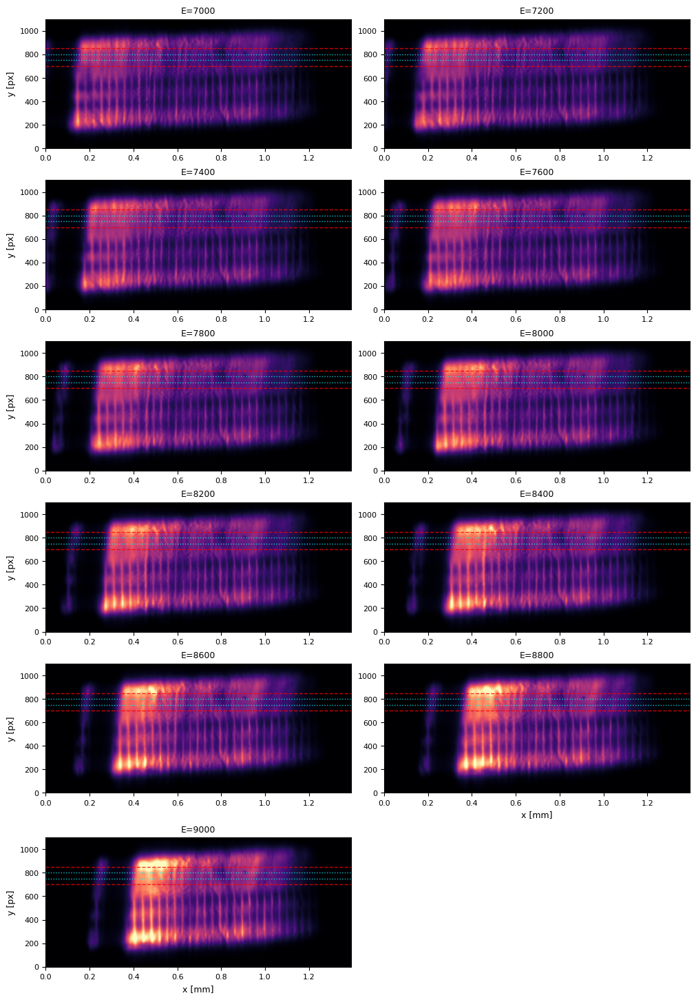

In [231]:
images_full, meta, info = SCANS[KEY]
y_roi                   = CHIP_DEFAULTS[1]['y_roi']
n = len(results_00)
fig, axes, nrows = _grid_layout(n, ncols=2, panel=(5, 2.4), sharey=False)

for i, (r, p, f) in enumerate(zip(results_00, param_00, flags_00)):
    ax = axes.flat[i]
    sub_disp = images_full[i].T[:]                  # full image, (N_y_full, N_x)
    N_y, N_x = sub_disp.shape                    # (1100, 2900)
    extent_mm = [0, N_x * r['dx'] * 1e3,         # x: 0 → ~1.4 mm
                 0, N_y]                          # y: 0 → 1100 (raw px)
    ax.imshow(sub_disp, origin='lower', aspect='auto',
              extent=extent_mm, cmap='magma',
              vmin=100, vmax=3000) #sub_disp.max())
    # Mark y_roi as horizontal reference lines
    # ax.axhline(y_roi.start, color='cyan', ls='--', lw=1.0, alpha=0.8)
    # ax.axhline(y_roi.stop,  color='cyan', ls='--', lw=1.0, alpha=0.8)
    ax.axhline(850,  color='red', ls='--', lw=1.0, alpha=0.8)
    ax.axhline(800,  color='cyan', ls=':', lw=1.0, alpha=0.8)
    ax.axhline(750,  color='cyan', ls=':', lw=1.0, alpha=0.8)
    ax.axhline(700,  color='red', ls='--', lw=1.0, alpha=0.8)
    ax.set_title(f"E={p:.0f}", #  [{f}]  max={int(sub_disp.max())}",
                 color=_FLAG_COLOR[f], fontsize=9)
    ax.tick_params(labelsize=8)
    row, col = divmod(i, 2)
    on_bottom = (row == nrows - 1) or (i + 2 >= n)
    if on_bottom:
        ax.set_xlabel('x [mm]', fontsize=9)
    if col == 0:
        ax.set_ylabel('y [px]', fontsize=9)

plt.show()

[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail


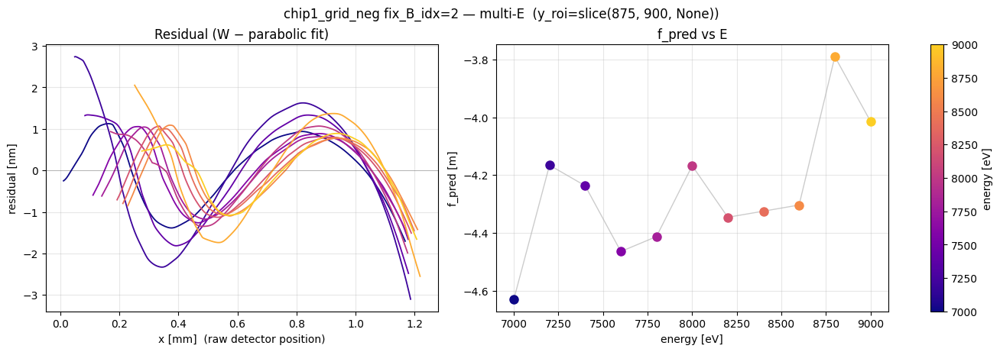

In [303]:
# Temporarily override y_roi for chip 1 to drop the dimmest 10 rows (710-719).
# Restored at the end so other cells aren't affected.
_OLD_Y_ROI = CHIP_DEFAULTS[1]['y_roi']
CHIP_DEFAULTS[1]['y_roi'] = slice(875, 900)

try:
    # Quick multi-E at B=-1900 µm with new y_roi.
    results_e, param_e, label_e, flags_e = sweep(
        "chip1_grid_neg", fix_B_idx=2, V_threshold=0.0, propagate=False,
    )

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), constrained_layout=True)

    plot_residual_overlay(axes[0], results_e, param_e, flags_e,
                          cmap=PLASMA_DARK, x_axis='raw',
                          vmin=7000, vmax=9000)
    axes[0].set_title('Residual (W − parabolic fit)')

    sm = plot_scalar_vs_param(axes[1], results_e, param_e, flags_e,
                              key='f_pred', cmap=PLASMA_DARK,
                              vmin=7000, vmax=9000)
    axes[1].set_xlabel(label_e)
    axes[1].set_ylabel('f_pred [m]')
    axes[1].set_title('f_pred vs E')

    fig.colorbar(sm, ax=axes, label=label_e)
    fig.suptitle(f'chip1_grid_neg fix_B_idx=2 — multi-E  '
                 f'(y_roi={CHIP_DEFAULTS[1]["y_roi"]})',
                 fontsize=12)
    plt.show()
finally:
    CHIP_DEFAULTS[1]['y_roi'] = _OLD_Y_ROI

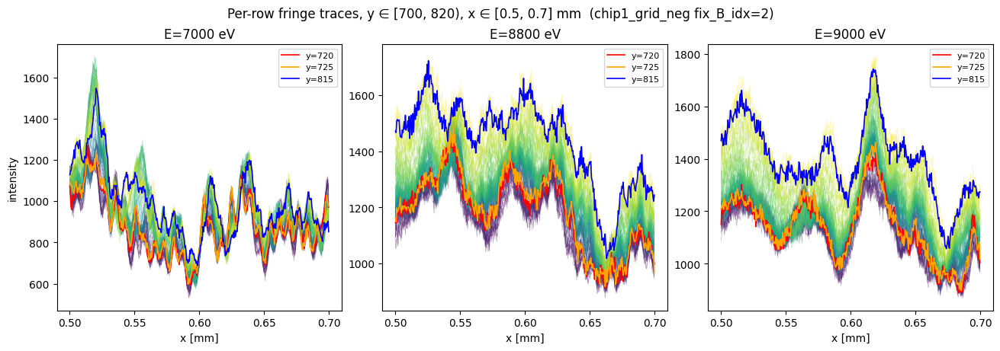

In [302]:
E_DIAG = [7000, 8800, 9000]
Y_LO, Y_HI = 700, 820
X_LO, X_HI = 0.5, 0.7     # mm — narrow window for fringe visibility

images_full, meta, info = SCANS[KEY]
E_arr = meta['mono_energy_eV']
# Indices on the fix_B_idx=2 column (B=-1900 µm)
n_E, n_B = info['shape']
idx_at_E = {int(round(E_arr[e * n_B + 2])):
            e * n_B + 2 for e in range(n_E)}

fig, axes = plt.subplots(1, 3, figsize=(13, 4.5), constrained_layout=True,
                         sharex=True, sharey=False)

for ax, E in zip(axes, E_diag := E_DIAG):
    i = idx_at_E[E]
    dx_m = info['dx_m']
    img  = images_full[i]                  # (2900, 1100)
    sub  = img[:, Y_LO:Y_HI]               # (2900, 120)
    x_mm = np.arange(img.shape[0]) * dx_m * 1e3
    sel  = (x_mm >= X_LO) & (x_mm <= X_HI)

    # Plot every row as a faint trace
    rows = np.arange(Y_LO, Y_HI)
    cmap_y = plt.cm.viridis
    norm_y = Normalize(vmin=Y_LO, vmax=Y_HI)
    for j, y in enumerate(rows):
        ax.plot(x_mm[sel], sub[sel, j],
                color=cmap_y(norm_y(y)), lw=0.4, alpha=0.4)
    # Highlight 720, 725, 815
    for y_hl, c_hl, ls in [(720, 'red',    '-'),
                            (725, 'orange', '-'),
                            (815, 'blue',   '-')]:
        ax.plot(x_mm[sel], sub[sel, y_hl - Y_LO],
                color=c_hl, lw=1.2, ls=ls, label=f'y={y_hl}')
    ax.set_xlabel('x [mm]')
    ax.set_title(f'E={E} eV')
    if E == E_diag[0]:
        ax.set_ylabel('intensity')
    ax.legend(fontsize=8, loc='upper right')

fig.suptitle(f'Per-row fringe traces, y ∈ [{Y_LO}, {Y_HI}), '
             f'x ∈ [{X_LO}, {X_HI}] mm  '
             f'(chip1_grid_neg fix_B_idx=2)')
plt.show()

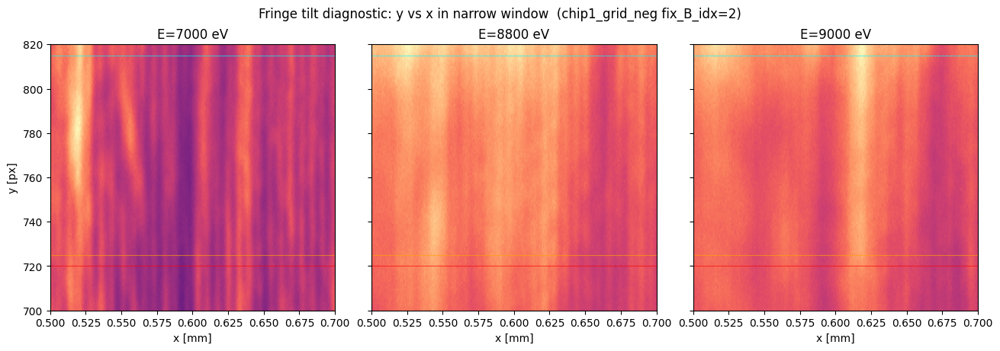

In [285]:
# Visualize fringe geometry: y vs x in a narrow x band. Vertical stripes
# = no y-dependent phase. Slanted stripes = fringes tilt in y → averaging
# washes contrast.

fig, axes = plt.subplots(1, 3, figsize=(13, 4.5), constrained_layout=True,
                         sharey=True)

for ax, E in zip(axes, E_DIAG):
    i = idx_at_E[E]
    dx_m = info['dx_m']
    img  = images_full[i]
    sub  = img[:, Y_LO:Y_HI]
    x_mm = np.arange(img.shape[0]) * dx_m * 1e3
    sel  = (x_mm >= X_LO) & (x_mm <= X_HI)
    sub_zoom = sub[sel, :].T              # (N_y, N_x_zoom) for imshow
    extent = [X_LO, X_HI, Y_LO, Y_HI]
    ax.imshow(sub_zoom, origin='lower', aspect='auto',
              extent=extent, cmap='magma',
              vmin=0, vmax=sub_zoom.max())
    for y_hl, c_hl in [(720, 'red'), (725, 'orange'), (815, 'cyan')]:
        ax.axhline(y_hl, color=c_hl, lw=0.8, alpha=0.6)
    ax.set_xlabel('x [mm]')
    ax.set_title(f'E={E} eV')
    if E == E_DIAG[0]:
        ax.set_ylabel('y [px]')

fig.suptitle(f'Fringe tilt diagnostic: y vs x in narrow window  '
             f'(chip1_grid_neg fix_B_idx=2)')
plt.show()

Brightest row in y_roi: y=814

y_avg (95 rows):
  f_pred         = -4.637 m
  rms_resid      = 1.126 nm
  r_DC           = 106.2
  SNR            = 53.2
  V_med (norm)   = 0.072
  V_med (raw)    = 0.026
  n_fit_px       = 2490

y=y_best (814):
  f_pred         = -4.653 m
  rms_resid      = 1.416 nm
  r_DC           = 174.0
  SNR            = 13.8
  V_med (norm)   = 0.054
  V_med (raw)    = 0.020
  n_fit_px       = 2454


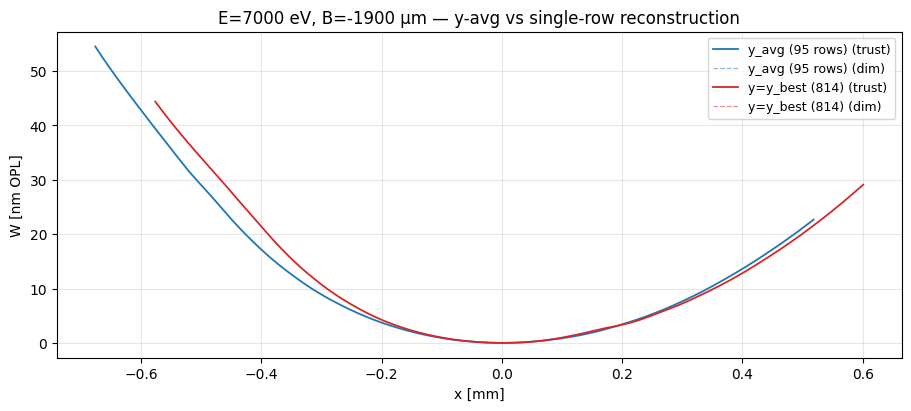

In [288]:
# Single-row reconstruction at 7000 eV, B=-1900 µm.
# Test: does picking ONE row (no y-averaging) recover the signal at 7000 eV?
# Use the brightest row inside y_roi as the "best" candidate.

key, idx_test = "chip1_grid_neg", 24   # E=7000 eV, B_idx=2 → 0*13+? wait

# 8000 eV at fix_B_idx=2 is e_idx=5 → idx = 5*13+2 = 67
# 7000 eV at fix_B_idx=2 is e_idx=0 → idx = 0*13+2 = 2
idx_test = 2
img, meta, info = SCANS[key][0][idx_test], SCANS[key][1], SCANS[key][2]
y_roi = slice(710, 815)

# Identify brightest row within y_roi
sub = img[:, y_roi]                          # (2900, 105)
row_total = sub.sum(axis=0)                  # length 105
i_max_in_roi = int(row_total.argmax())
y_best = y_roi.start + i_max_in_roi

print(f"Brightest row in y_roi: y={y_best}")

# Reconstruct using just that single row
res_1row = wfl.reconstruct_single(
    img, dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
    wavelength=wfl.energy_eV_to_wavelength_m(meta['mono_energy_eV'][idx_test]),
    z_gd=Z_GD_M, y_roi=slice(y_best, y_best + 1),
    V_threshold=0.0, I0_threshold=0.02, propagate=False, verbose=False,
)

# Compare to the y-averaged version
res_yavg = wfl.reconstruct_single(
    img, dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
    wavelength=wfl.energy_eV_to_wavelength_m(meta['mono_energy_eV'][idx_test]),
    z_gd=Z_GD_M, y_roi=y_roi,
    V_threshold=0.0, I0_threshold=0.02, propagate=False, verbose=False,
)

for tag, r in [('y_avg (95 rows)', res_yavg), (f'y=y_best ({y_best})', res_1row)]:
    bm = r['beam_mask']
    print(f"\n{tag}:")
    print(f"  f_pred         = {r['f_pred']:+.3f} m")
    print(f"  rms_resid      = {r['rms_resid_nm']:.3f} nm")
    print(f"  r_DC           = {r['dc_carrier_ratio']:.1f}")
    print(f"  SNR            = {r['carrier_snr']:.1f}")
    print(f"  V_med (norm)   = {np.median(r['V'][bm]):.3f}")
    print(f"  V_med (raw)    = {np.median(2 * r['A1'][bm] / r['I0'][bm]):.3f}")
    print(f"  n_fit_px       = {r['n_fit_px']}")

# Plot W(x) overlay for the two cases
fig, ax = plt.subplots(figsize=(9, 4), constrained_layout=True)
for tag, r, c in [('y_avg (95 rows)', res_yavg, 'C0'),
                   (f'y=y_best ({y_best})', res_1row, 'C3')]:
    bm, tm = r['beam_mask'], r['trust_mask']
    x = r['x_mm']
    W = r['W_nm']
    ax.plot(x, np.where(tm, W, np.nan), color=c, lw=1.3, label=f'{tag} (trust)')
    ax.plot(x, np.where(bm & ~tm, W, np.nan), color=c, ls='--', lw=0.9, alpha=0.5,
            label=f'{tag} (dim)')
ax.set_xlabel('x [mm]')
ax.set_ylabel('W [nm OPL]')
ax.set_title(f'E=7000 eV, B=-1900 µm — y-avg vs single-row reconstruction')
ax.legend(fontsize=9)
ax.grid(alpha=0.3)
plt.show()

Best-contrast row in y ∈ [700, 870): y=738  (k_amp/dc_amp = 0.0145)


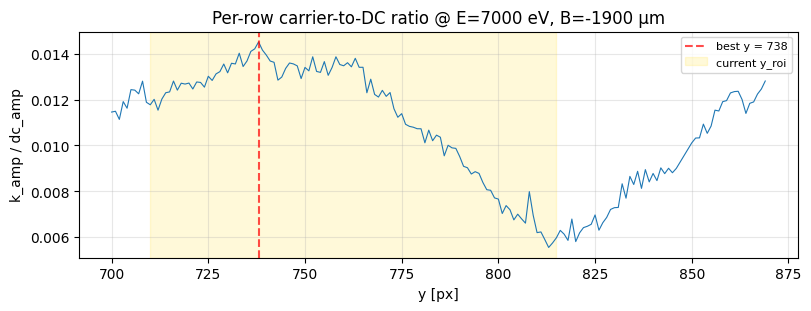

In [289]:
# Pick row with strongest carrier-to-DC ratio (= best per-row fringe contrast).
# Use info['grating_pitch_m'] to define k_ideal, search a ±50% band around it.

img, meta, info = SCANS[key][0][idx_test], SCANS[key][1], SCANS[key][2]
y_roi = slice(700, 870)               # widen the search to include rows above 815
dx_m  = info['dx_m']
pitch = info['grating_pitch_m']
k_ideal_cyc_per_m = 1.0 / pitch       # cyc/m

sub = img[:, y_roi]                   # (2900, n_y)
N = sub.shape[0]
freq = np.fft.fftshift(np.fft.fftfreq(N, d=dx_m))    # cyc/m
band = (freq > 0.5 * k_ideal_cyc_per_m) & (freq < 1.5 * k_ideal_cyc_per_m)
i_dc = N // 2                                        # index of freq=0 after fftshift

# Per-row carrier/DC ratio
per_row_ratio = []
for j in range(sub.shape[1]):
    fft_row = np.abs(np.fft.fftshift(np.fft.fft(sub[:, j].astype(float))))
    k_amp_row  = fft_row[band].max()
    dc_amp_row = fft_row[i_dc]
    per_row_ratio.append(k_amp_row / max(dc_amp_row, 1e-12))
per_row_ratio = np.array(per_row_ratio)

y_axis = np.arange(y_roi.start, y_roi.stop)
i_best = int(per_row_ratio.argmax())
y_best_contrast = y_axis[i_best]

print(f"Best-contrast row in y ∈ [{y_roi.start}, {y_roi.stop}): "
      f"y={y_best_contrast}  (k_amp/dc_amp = {per_row_ratio[i_best]:.4f})")

# Quick plot to see how contrast varies with y
fig, ax = plt.subplots(figsize=(8, 3), constrained_layout=True)
ax.plot(y_axis, per_row_ratio, color='C0', lw=0.8)
ax.axvline(y_best_contrast, color='red', ls='--', alpha=0.7,
           label=f'best y = {y_best_contrast}')
ax.axvspan(710, 815, color='gold', alpha=0.15, label='current y_roi')
ax.set_xlabel('y [px]')
ax.set_ylabel('k_amp / dc_amp')
ax.set_title(f'Per-row carrier-to-DC ratio @ E=7000 eV, B=-1900 µm')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)
plt.show()

In [290]:
res_best = wfl.reconstruct_single(
    img, dx=dx_m, grating_pitch=pitch,
    wavelength=wfl.energy_eV_to_wavelength_m(meta['mono_energy_eV'][idx_test]),
    z_gd=Z_GD_M, y_roi=slice(y_best_contrast, y_best_contrast + 1),
    V_threshold=0.0, I0_threshold=0.02, propagate=False, verbose=False,
)

bm = res_best['beam_mask']
print(f"\ny={y_best_contrast} (best contrast):")
print(f"  f_pred         = {res_best['f_pred']:+.3f} m")
print(f"  rms_resid      = {res_best['rms_resid_nm']:.3f} nm")
print(f"  r_DC           = {res_best['dc_carrier_ratio']:.1f}")
print(f"  SNR            = {res_best['carrier_snr']:.1f}")
print(f"  V_med (raw)    = {np.median(2 * res_best['A1'][bm] / res_best['I0'][bm]):.3f}")
print(f"  n_fit_px       = {res_best['n_fit_px']}")


y=738 (best contrast):
  f_pred         = -4.484 m
  rms_resid      = 1.253 nm
  r_DC           = 68.9
  SNR            = 35.4
  V_med (raw)    = 0.032
  n_fit_px       = 2492


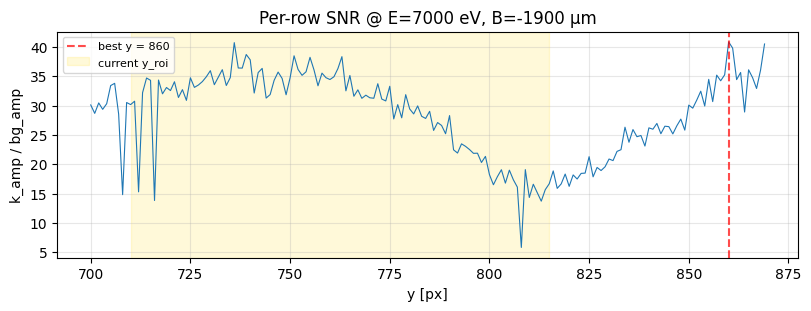

Best-SNR row: y=860  (SNR = 40.8)
Best-contrast row: y=738  (SNR there = 36.4)


In [291]:
# Per-row SNR: k_amp / bg_amp, where bg_amp is mean |FFT| in [1.2, 1.8] × k_peak
# (same convention as find_carrier in the script). k_peak per row varies
# slightly; use k_ideal here as a stable reference.

bg_lo = 1.2 * k_ideal_cyc_per_m
bg_hi = 1.8 * k_ideal_cyc_per_m
bg_band = (freq > bg_lo) & (freq < bg_hi)

per_row_snr = []
for j in range(sub.shape[1]):
    fft_row = np.abs(np.fft.fftshift(np.fft.fft(sub[:, j].astype(float))))
    k_amp_row  = fft_row[band].max()
    bg_amp_row = fft_row[bg_band].mean()
    per_row_snr.append(k_amp_row / max(bg_amp_row, 1e-12))
per_row_snr = np.array(per_row_snr)

i_best_snr = int(per_row_snr.argmax())
y_best_snr = y_axis[i_best_snr]

fig, ax = plt.subplots(figsize=(8, 3), constrained_layout=True)
ax.plot(y_axis, per_row_snr, color='C0', lw=0.8)
ax.axvline(y_best_snr, color='red', ls='--', alpha=0.7,
           label=f'best y = {y_best_snr}')
ax.axvspan(710, 815, color='gold', alpha=0.15, label='current y_roi')
ax.set_xlabel('y [px]')
ax.set_ylabel('k_amp / bg_amp')
ax.set_title(f'Per-row SNR @ E=7000 eV, B=-1900 µm')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)
plt.show()

print(f"Best-SNR row: y={y_best_snr}  (SNR = {per_row_snr[i_best_snr]:.1f})")
print(f"Best-contrast row: y={y_best_contrast}  "
      f"(SNR there = {per_row_snr[i_best - 0]:.1f})")

In [296]:
def plot_per_row_diagnostics(img, dx_m, grating_pitch_m, y_range,
                             ax_contrast, ax_snr, k_band=(0.5, 1.5),
                             bg_band=(1.2, 1.8), y_roi_ref=None,
                             title=''):
    """Compute and plot per-row carrier/DC ratio and per-row SNR vs y.

    img            : 2-D detector image (axis-0 = fringe direction)
    dx_m           : pixel pitch along fringe direction [m]
    grating_pitch_m: grating pitch → defines k_ideal [m]
    y_range        : (y_lo, y_hi) — half-open slice of rows to scan
    ax_contrast    : axes for k_amp/dc_amp panel
    ax_snr         : axes for k_amp/bg_amp panel
    k_band         : (lo, hi) × k_ideal — search band for k_amp
    bg_band        : (lo, hi) × k_ideal — band for bg_amp estimate
    y_roi_ref      : optional (start, stop) to shade as reference
    title          : prefix for both panel titles
    """
    y_lo, y_hi = y_range
    sub = img[:, y_lo:y_hi].astype(float)            # (N_x, n_y)
    N = sub.shape[0]
    freq = np.fft.fftshift(np.fft.fftfreq(N, d=dx_m))
    k_ideal = 1.0 / grating_pitch_m
    band   = (freq > k_band[0]   * k_ideal) & (freq < k_band[1]   * k_ideal)
    bg     = (freq > bg_band[0]  * k_ideal) & (freq < bg_band[1]  * k_ideal)
    i_dc   = N // 2

    fft_mag = np.abs(np.fft.fftshift(np.fft.fft(sub, axis=0), axes=0))
    k_amp   = fft_mag[band, :].max(axis=0)
    dc_amp  = fft_mag[i_dc, :]
    bg_amp  = fft_mag[bg,   :].mean(axis=0)
    contrast = k_amp / np.maximum(dc_amp, 1e-12)
    snr      = k_amp / np.maximum(bg_amp, 1e-12)

    y_axis = np.arange(y_lo, y_hi)
    i_c = int(contrast.argmax())
    i_s = int(snr.argmax())

    for ax, vals, ylabel, i_best, label_metric in [
        (ax_contrast, contrast, 'k_amp / dc_amp', i_c, 'contrast'),
        (ax_snr,      snr,      'k_amp / bg_amp', i_s, 'SNR'),
    ]:
        ax.plot(y_axis, vals, color='C0', lw=0.8)
        ax.axvline(y_axis[i_best], color='red', ls='--', alpha=0.7,
                   label=f'best y = {y_axis[i_best]}')
        if y_roi_ref is not None:
            ax.axvspan(*y_roi_ref, color='gold', alpha=0.15,
                       label=f'y_roi {y_roi_ref}')
        ax.set_ylabel(ylabel, fontsize=9)
        ax.legend(fontsize=7, loc='lower left')
        ax.grid(alpha=0.3)
        ax.set_title(f'{title}  per-row {label_metric}', fontsize=9)
    ax_snr.set_xlabel('y [px]', fontsize=9)
    return contrast, snr, y_axis

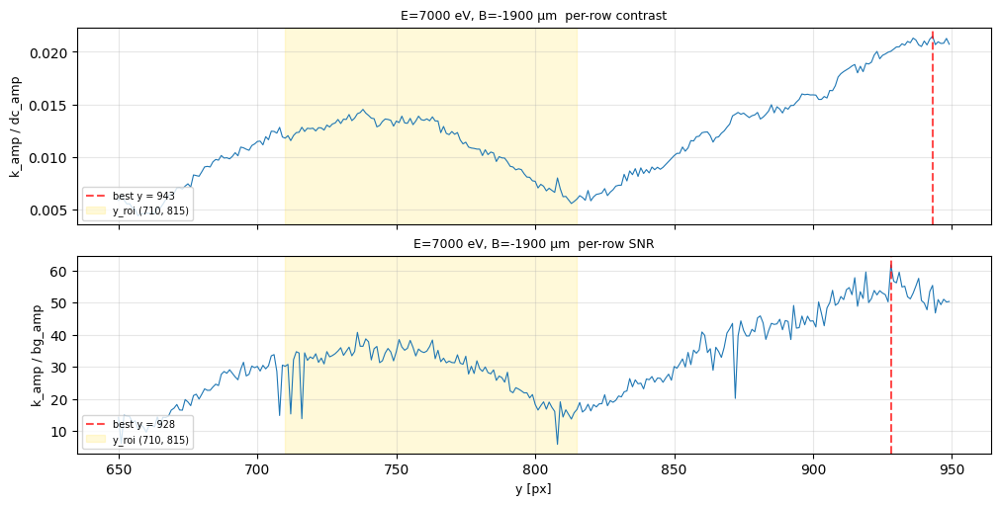

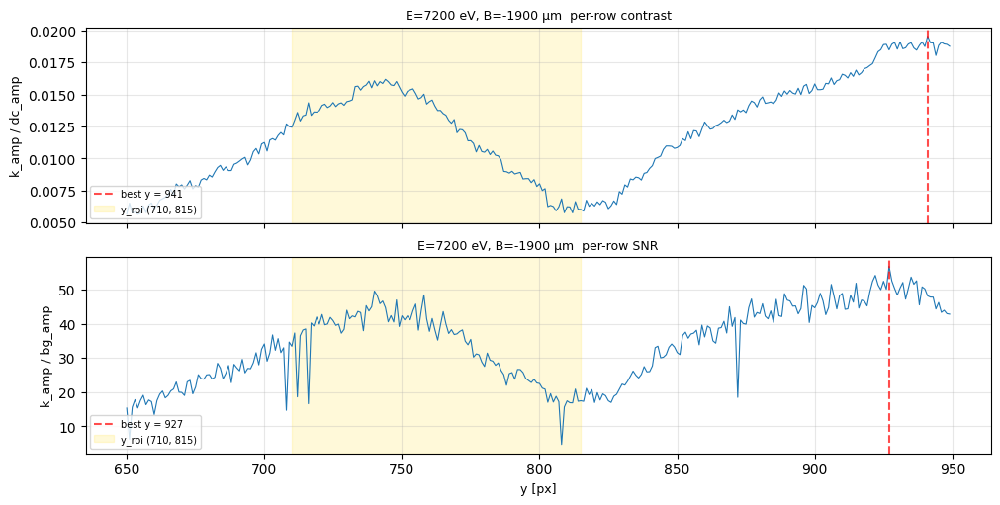

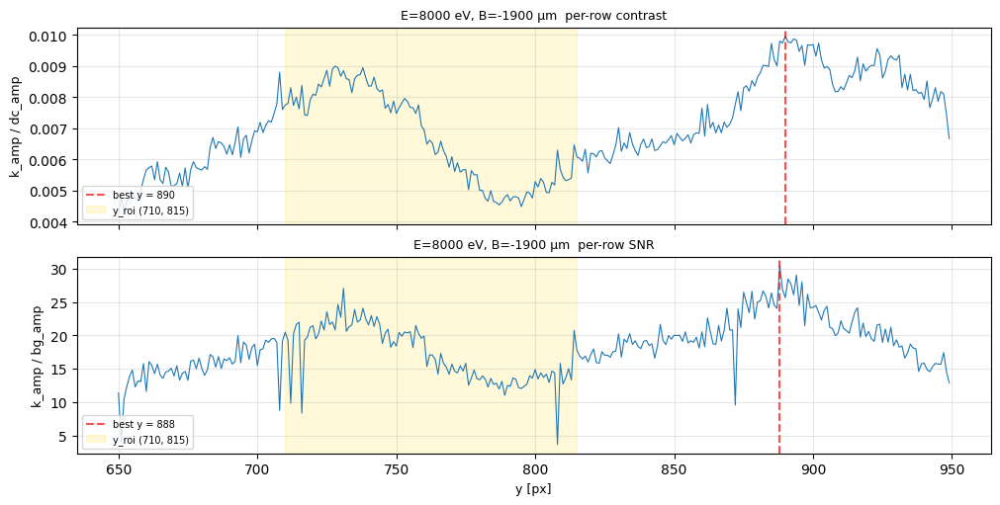

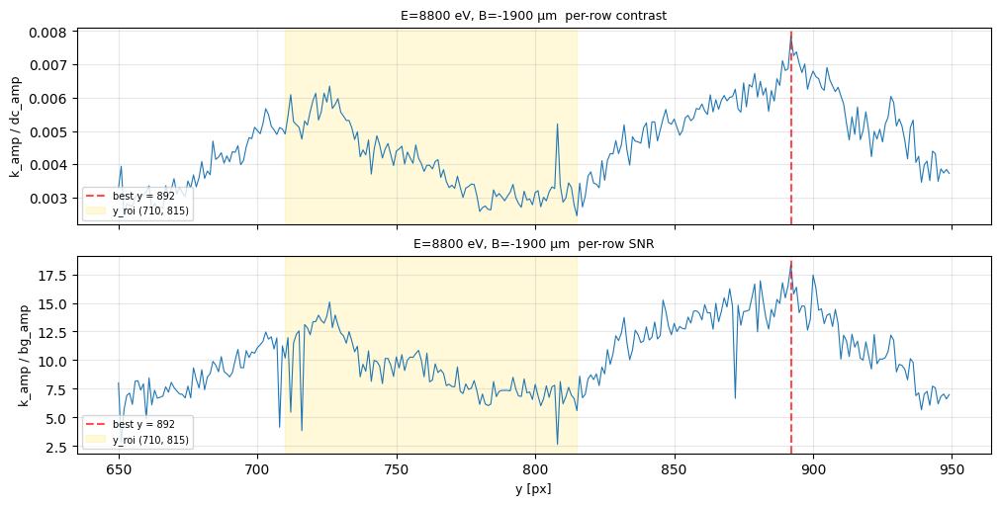

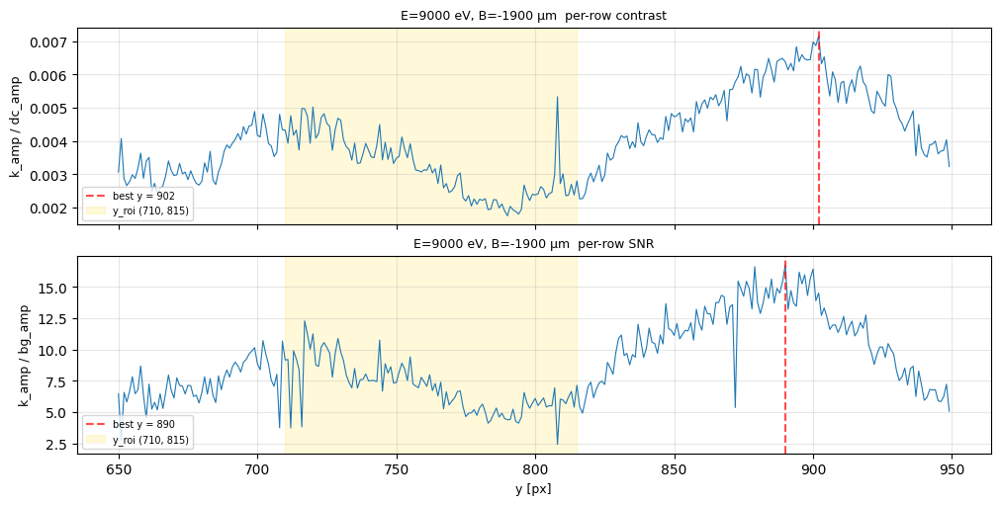

In [300]:
E_LIST    = [7000, 7200, 8000, 8800, 9000]
Y_RANGE   = (650, 950)
Y_ROI_REF = (CHIP_DEFAULTS[1]['y_roi'].start, CHIP_DEFAULTS[1]['y_roi'].stop)

images_full, meta, info = SCANS[KEY]
E_arr      = np.asarray(meta['mono_energy_eV'])
n_E, n_B   = info['shape']
B_IDX      = 2
idx_at_E = {int(round(E_arr[e * n_B + B_IDX])):
            e * n_B + B_IDX for e in range(n_E)}

for E in E_LIST:
    i = idx_at_E[E]
    fig, (ax_c, ax_s) = plt.subplots(2, 1, figsize=(10, 5),
                                     sharex=True, constrained_layout=True)
    plot_per_row_diagnostics(
        img             = images_full[i],
        dx_m            = info['dx_m'],
        grating_pitch_m = info['grating_pitch_m'],
        y_range         = Y_RANGE,
        ax_contrast     = ax_c,
        ax_snr          = ax_s,
        y_roi_ref       = Y_ROI_REF,
        title           = (f'E={E} eV, '
                           f'B={meta["bender_um"][i]:.0f} µm'),
    )
    plt.show()

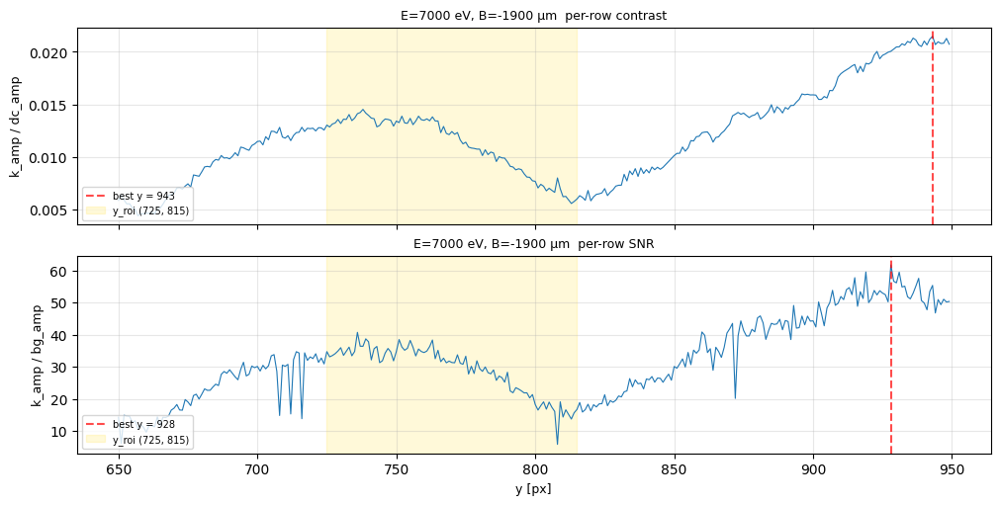

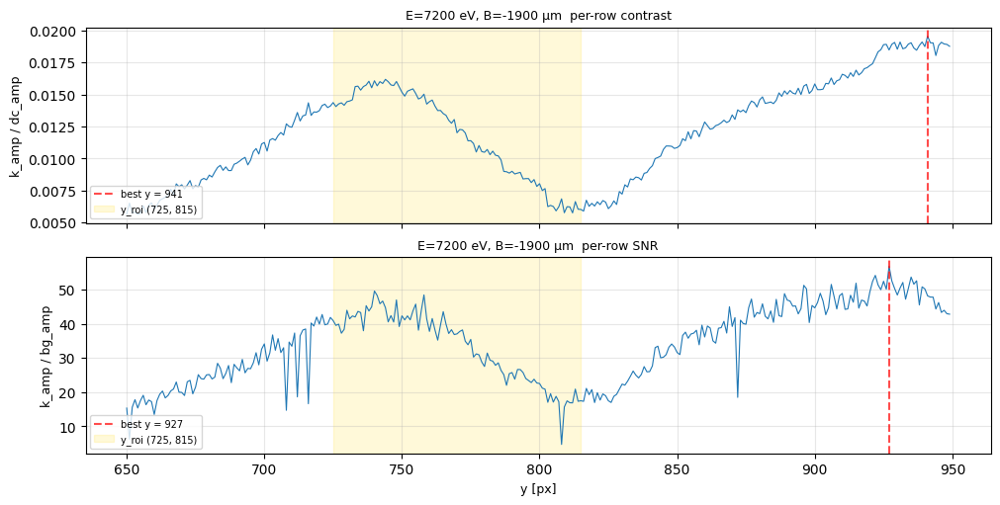

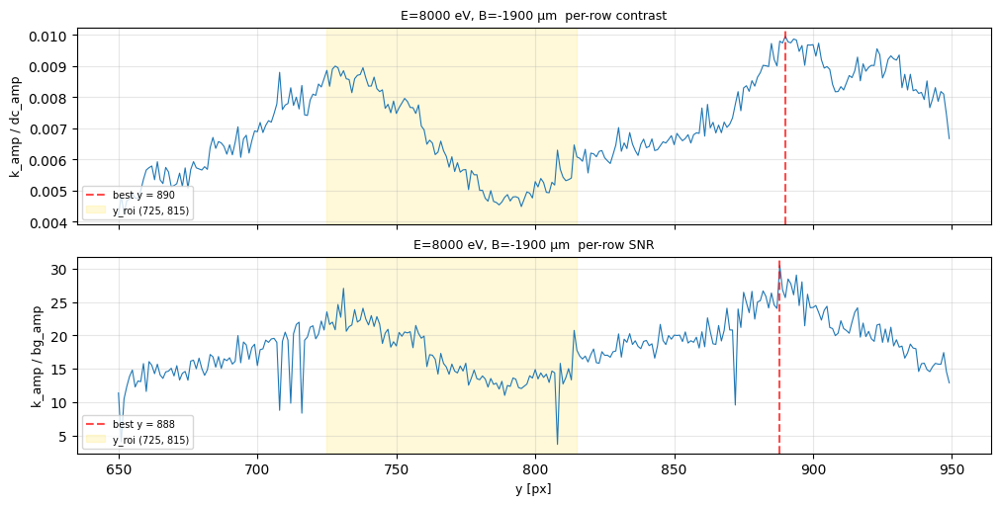

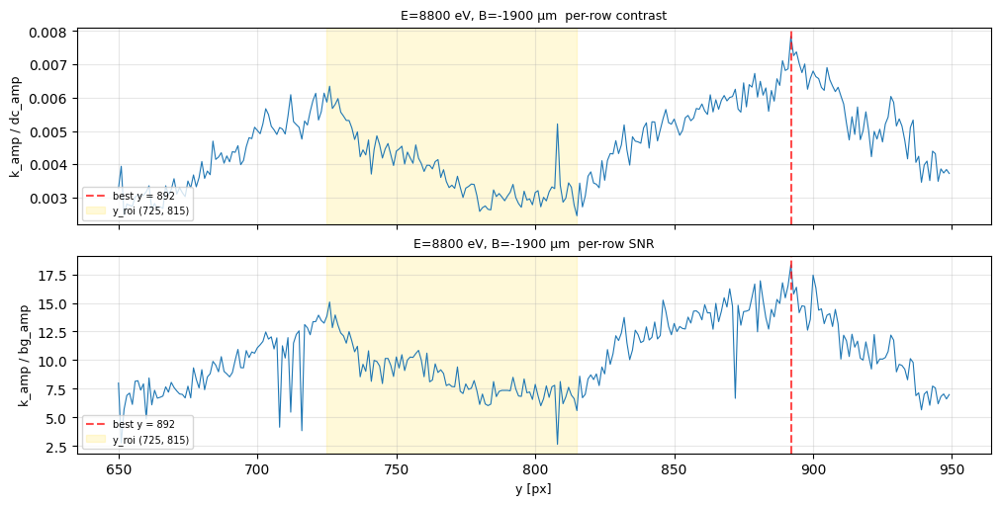

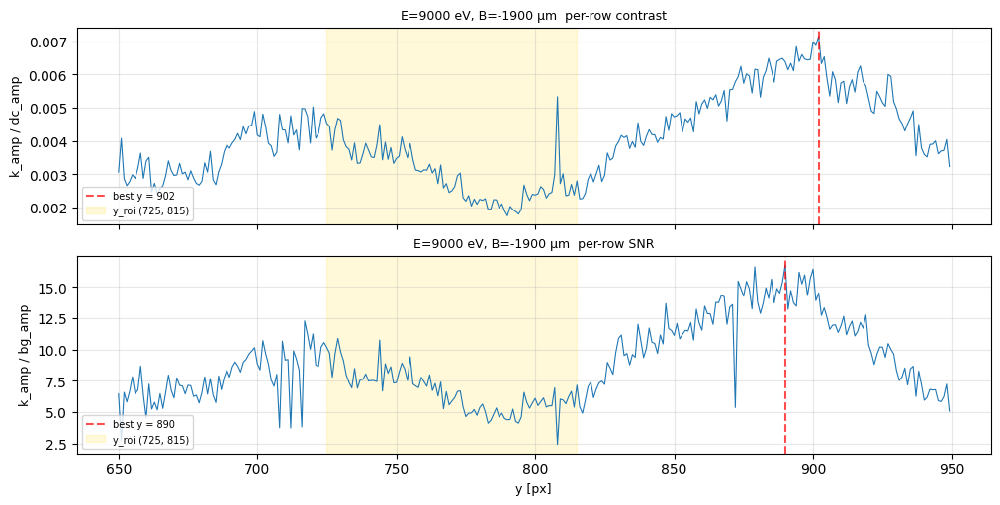

In [305]:
# Temporarily override y_roi for chip 1 to drop the dimmest 10 rows (710-719).
# Restored at the end so other cells aren't affected.
_OLD_Y_ROI = CHIP_DEFAULTS[1]['y_roi']
CHIP_DEFAULTS[1]['y_roi'] = slice(725, 815)

try:
    E_LIST    = [7000, 7200, 8000, 8800, 9000]
    Y_RANGE   = (650, 950)
    Y_ROI_REF = (CHIP_DEFAULTS[1]['y_roi'].start, CHIP_DEFAULTS[1]['y_roi'].stop)
    
    images_full, meta, info = SCANS[KEY]
    E_arr      = np.asarray(meta['mono_energy_eV'])
    n_E, n_B   = info['shape']
    B_IDX      = 2
    idx_at_E = {int(round(E_arr[e * n_B + B_IDX])):
                e * n_B + B_IDX for e in range(n_E)}
    
    for E in E_LIST:
        i = idx_at_E[E]
        fig, (ax_c, ax_s) = plt.subplots(2, 1, figsize=(10, 5),
                                         sharex=True, constrained_layout=True)
        plot_per_row_diagnostics(
            img             = images_full[i],
            dx_m            = info['dx_m'],
            grating_pitch_m = info['grating_pitch_m'],
            y_range         = Y_RANGE,
            ax_contrast     = ax_c,
            ax_snr          = ax_s,
            y_roi_ref       = Y_ROI_REF,
            title           = (f'E={E} eV, '
                               f'B={meta["bender_um"][i]:.0f} µm'),
        )
        plt.show()
finally:
    CHIP_DEFAULTS[1]['y_roi'] = _OLD_Y_ROI

[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail
[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail
[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail
[chip1_grid_neg] 11 frames @ V_thr=0.0, propagate=False  →  11 ok, 0 suspect, 0 fail


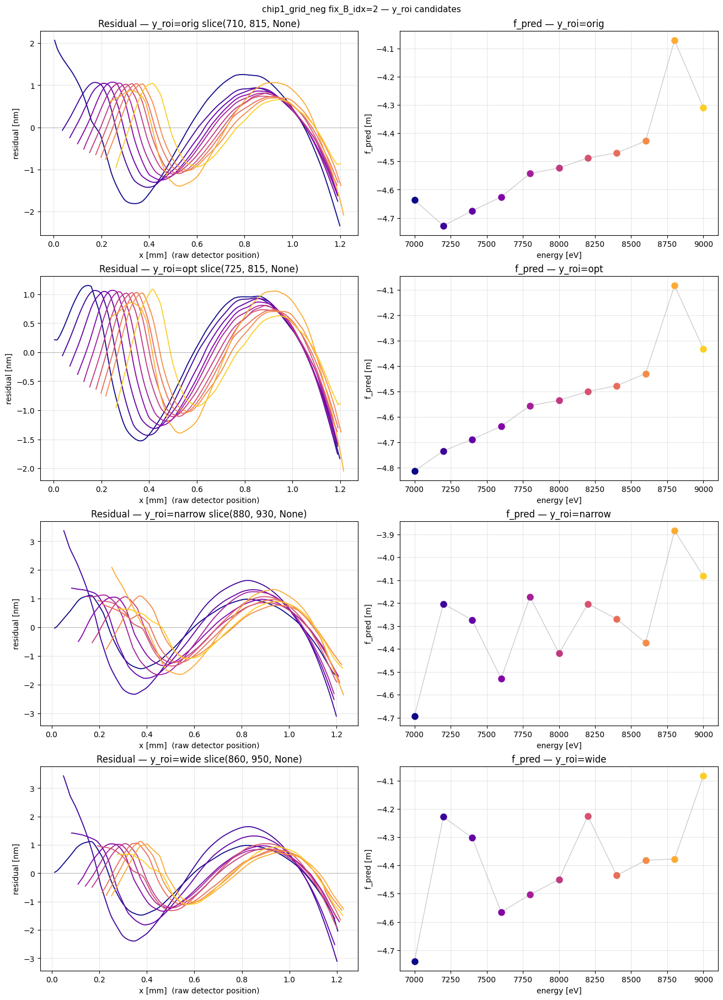

In [307]:
# Test: shift y_roi to cover the high-contrast region. Two candidates.
# Wider candidate captures the E-drift of the best row.

_OLD_Y_ROI = CHIP_DEFAULTS[1]['y_roi']

CANDIDATES = {
    'orig'   : slice(710, 815),    # current
    'opt'    : slice(725, 815),    # optimized
    'narrow' : slice(880, 930),    # 50 px, centered on high-E peak
    'wide'   : slice(860, 950),    # 90 px, covers full E-drift
}

fig, axes = plt.subplots(len(CANDIDATES), 2,
                         figsize=(13, 4.5 * len(CANDIDATES)),
                         constrained_layout=True)

for row, (tag, y_roi_new) in enumerate(CANDIDATES.items()):
    CHIP_DEFAULTS[1]['y_roi'] = y_roi_new

    res, par, lab, fl = sweep(
        "chip1_grid_neg", fix_B_idx=2,
        V_threshold=0.0, propagate=False,
    )

    plot_residual_overlay(axes[row, 0], res, par, fl,
                          cmap=PLASMA_DARK, x_axis='raw',
                          vmin=7000, vmax=9000)
    axes[row, 0].set_title(f"Residual — y_roi={tag} {y_roi_new}")

    sm = plot_scalar_vs_param(axes[row, 1], res, par, fl,
                              key='f_pred', cmap=PLASMA_DARK,
                              vmin=7000, vmax=9000)
    axes[row, 1].set_xlabel(lab)
    axes[row, 1].set_ylabel('f_pred [m]')
    axes[row, 1].set_title(f"f_pred — y_roi={tag}")

CHIP_DEFAULTS[1]['y_roi'] = _OLD_Y_ROI   # restore
fig.suptitle('chip1_grid_neg fix_B_idx=2 — y_roi candidates', fontsize=11)
plt.show()

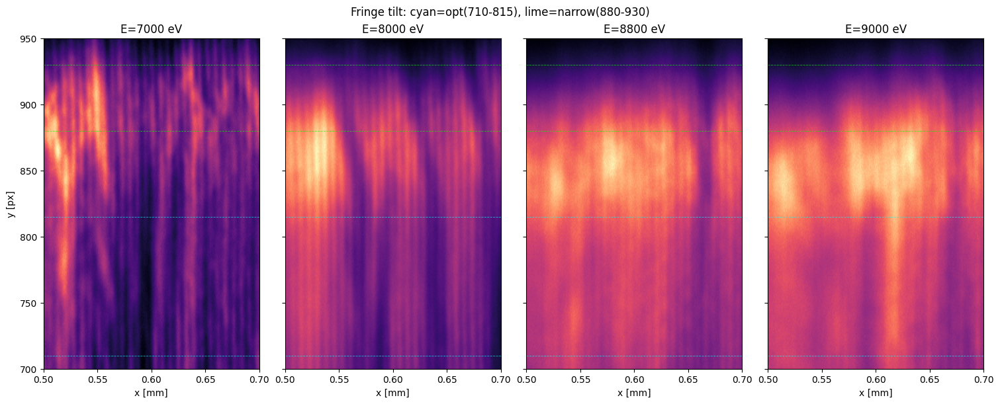

In [309]:
Y_LO_EXT, Y_HI_EXT = 700, 950
X_LO_EXT, X_HI_EXT = 0.5, 0.7

fig, axes = plt.subplots(1, 4, figsize=(15, 6),
                         constrained_layout=True, sharey=True)
for ax, E in zip(axes, [7000, 8000, 8800, 9000]):
    i = idx_at_E[E]
    img = images_full[i]
    sub = img[:, Y_LO_EXT:Y_HI_EXT]
    x_mm = np.arange(img.shape[0]) * info['dx_m'] * 1e3
    sel = (x_mm >= X_LO_EXT) & (x_mm <= X_HI_EXT)
    extent = [X_LO_EXT, X_HI_EXT, Y_LO_EXT, Y_HI_EXT]
    ax.imshow(sub[sel, :].T, origin='lower', aspect='auto',
              extent=extent, cmap='magma')
    # Mark candidate y_roi regions
    ax.axhspan(710, 815, alpha=0, edgecolor='cyan', lw=1.2, fill=False)
    for y_b in [710, 815]:
        ax.axhline(y_b, color='cyan', lw=0.6, alpha=0.7, ls='--')
    for y_b in [880, 930]:
        ax.axhline(y_b, color='lime', lw=0.6, alpha=0.7, ls='--')
    ax.set_xlabel('x [mm]')
    if E == 7000:
        ax.set_ylabel('y [px]')
    ax.set_title(f'E={E} eV')
fig.suptitle('Fringe tilt: cyan=opt(710-815), lime=narrow(880-930)')
plt.show()

### Same bender, multi-E

### Same energy, multi-B

[chip1_grid_neg] 13 frames @ V_thr=0.0, propagate=False  →  13 ok, 0 suspect, 0 fail


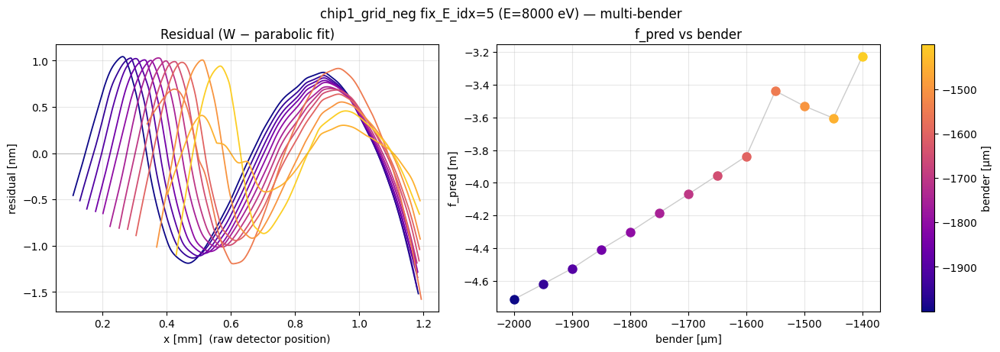

In [173]:
# Quick multi-bender at E=8000 eV.
results_b, param_b, label_b, flags_b = sweep(
    "chip1_grid_neg", fix_E_idx=5, V_threshold=0.0, propagate=False,
)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), constrained_layout=True)

plot_residual_overlay(axes[0], results_b, param_b, flags_b,
                      cmap=PLASMA_DARK, x_axis='raw',
                      vmin=param_b.min(), vmax=param_b.max())
axes[0].set_title('Residual (W − parabolic fit)')

sm = plot_scalar_vs_param(axes[1], results_b, param_b, flags_b,
                          key='f_pred', cmap=PLASMA_DARK,
                          vmin=param_b.min(), vmax=param_b.max())
axes[1].set_xlabel(label_b)
axes[1].set_ylabel('f_pred [m]')
axes[1].set_title('f_pred vs bender')

fig.colorbar(sm, ax=axes, label=label_b)
fig.suptitle('chip1_grid_neg fix_E_idx=5 (E=8000 eV) — '
             'multi-bender',
             fontsize=12)
plt.show()

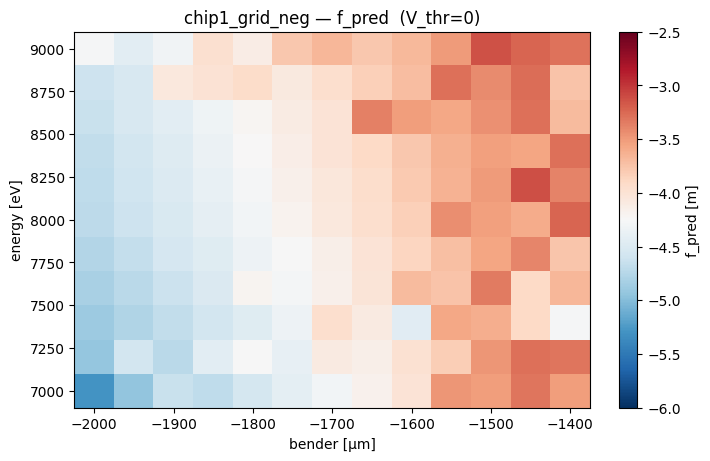

In [180]:
# Reconstruct the full chip1_grid_neg grid at V_thr=0 (no filter),
# arrange into (n_E, n_B) and heatmap f_pred.

KEY = "chip1_grid_neg"
images_g, meta_g, info_g = SCANS[KEY]
n_E, n_B = info_g['shape']
E_vals = np.asarray(meta_g['mono_energy_eV'])[::n_B]
B_vals = np.asarray(meta_g['bender_um'])[:n_B]

# Reconstruct every frame
all_recs = [reco_frame(KEY, i, V_threshold=0.0, propagate=False)
            for i in range(n_E * n_B)]

# Reshape f_pred into (n_E, n_B). snake_axes=False → row-major from outer
# (E) to inner (B).
f_pred_grid = np.array([r['f_pred'] for r in all_recs]).reshape(n_E, n_B)

# Plot
fig, ax = plt.subplots(figsize=(7, 4.5), constrained_layout=True)
dB = B_vals[1] - B_vals[0]
dE = E_vals[1] - E_vals[0]
extent = [B_vals[0] - dB/2, B_vals[-1] + dB/2,
          E_vals[0] - dE/2, E_vals[-1] + dE/2]
im = ax.imshow(f_pred_grid, origin='lower', aspect='auto',
               extent=extent, cmap='RdBu_r',
               vmin=-6, vmax=-2.5)
fig.colorbar(im, ax=ax, label='f_pred [m]')
ax.set_xlabel('bender [µm]')
ax.set_ylabel('energy [eV]')
ax.set_title('chip1_grid_neg — f_pred  (V_thr=0)')
plt.show()

# NOTES
